# Imports

In [1]:
import numpy as np
import os, sys
import matplotlib as mpl
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
import pandas as pd
import scipy.optimize as opt
from scipy import stats
from scipy.stats import gaussian_kde
import matplotlib.ticker as ticker
import starbars
import matplotlib.patches as mpatches

mpl.rcParams['mathtext.default'] = 'regular'
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
plt.rcParams["axes.linewidth"] = 1.0
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

# Figure 2

## Figure 2B Data

Actin-Covered Surface Area Fraction Time Series for Tetravalent Crosslinkers

In [2]:
# Assemble data for figure

# Load all replicates
# Take mean and std
# Row 0 - Time
# Row 1 - Fraction of occupied triangles 
jobfoldername = 'inputfiles' 
kbindvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1] 
kunbindvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1] 
Nreps = 10
Meanlist = []
Stdlist = []
dirpath = 'Figure_2'
for koniter, kbind in enumerate(kbindvec):
    for koffiter, kunbind in enumerate (kunbindvec):
        Row1 = []
        Rval = (koniter)*len(kunbindvec)+(koffiter)
        for repid in range(0, Nreps):
            fvar = dirpath+'/outputfiles/FO_Output'+'/FO_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df = pd.read_csv(fvar, index_col = 0)
            datavec = df.iloc[1].to_numpy()
            Row1.append(datavec)
            print('R_'+str(Rval)+'_r_'+str(repid))
            print('---')
        Row1 = np.array(Row1)
        Meanlist.append(np.mean(Row1, 0))
        Stdlist.append(np.std(Row1, 0))
Timevec = df.iloc[0].to_numpy()

R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
R_6_r_0
---
R_6_r_1
---
R_6_r_2
---
R_6_r_3
---
R_6_r_4
---
R_6_r_5
---
R_6_r_6
---
R_6_r_7
---
R_6_r_8
---
R_6_r_9
---
R_7_r_0
---
R_7_r_1
---
R_7_r_2
---
R_7_r_3
---
R_7_r_4
---
R_7_r_5
---
R_7_r_6
---
R_7_r_7
---
R_7_r_8
---
R_7_r_9
---
R_8_r_0
---
R_8_r_1
---
R_8_r_2
---
R_8_

## Plot Figure 2B

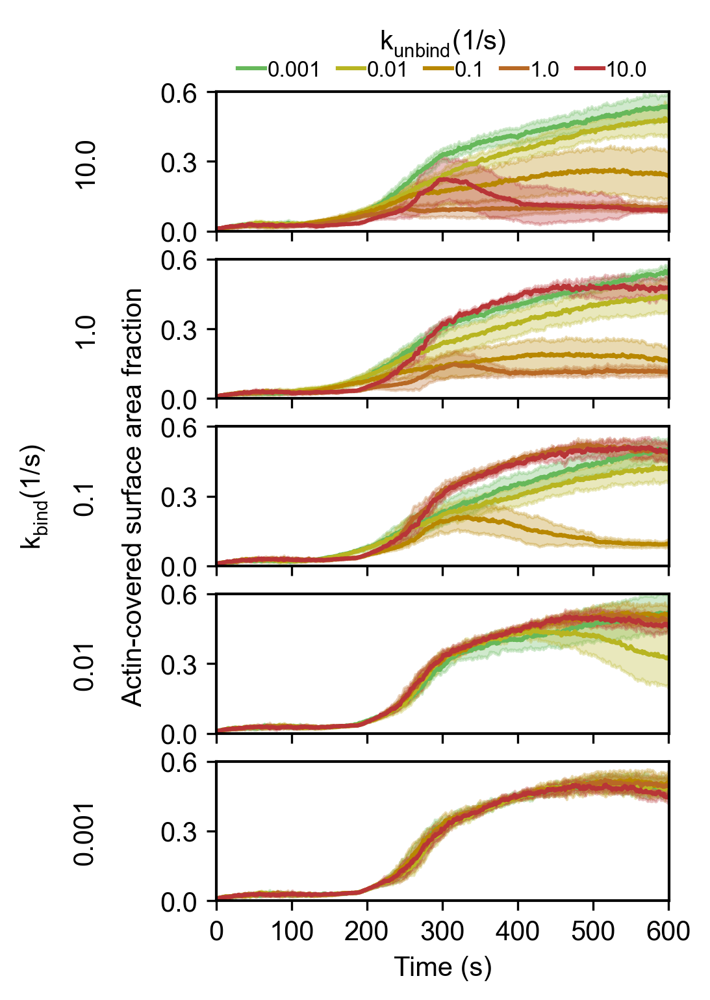

In [3]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#66B85A','#B8B521','#B88700','#B86925','#B83537']
labelvec = ['0.001', '0.01', '0.1', '1.0', '10.0'] 

nr = 5; nc = 1
fig, axvec = plt.subplots(nrows = nr, ncols = nc, figsize = (2.5, 5.0), 
                          dpi = 300, facecolor = 'w', edgecolor = 'k', sharex = False, sharey = False)

# Figure 2B
for plotcounter in range(0, nr):
    legcell = []
    for val in range(0, nr):
        Rval = plotcounter*len(kunbindvec) + val
        ax = axvec[nr-plotcounter-1]
        x = ax.plot(Timevec, Meanlist[Rval], color = colorlist[val])
        legcell.append(x[0]);
        ax.fill_between(Timevec, Meanlist[Rval]-Stdlist[Rval], Meanlist[Rval]+Stdlist[Rval], 
                        color = colorlist[val], alpha = 0.3)
        ax.set_xlim([0, 601])
        ax.set_ylim([0, 0.6])
        ax.set_xticks([0, 100, 200, 300, 400, 500, 600])
        ax.set_yticks([0, 0.3, 0.6])
        if plotcounter > 0:
            ax.set_xticklabels([])
plt.text(-0.18, 0.5, 'Actin-covered surface area fraction', horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)

axvec[0].legend(legcell, labelvec, title=r"$k_{unbind} (1/s)$",
                 ncol=5, fontsize=8, frameon=False, loc='upper center', bbox_to_anchor=(0.5, 1.6), 
                 labelspacing = 0.1, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)

axvec[4].set_xlabel('Time (s)') 
axvec[0].set_ylabel('10.0', labelpad=23) 
axvec[1].set_ylabel('1.0', labelpad=23) 
axvec[2].set_ylabel('0.1', labelpad=23) 
axvec[3].set_ylabel('0.01', labelpad=23) 
axvec[4].set_ylabel('0.001', labelpad=23) 
plt.text(-0.4, 0.5, r"$k_{bind} (1/s)$", horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)

plt.subplots_adjust(left = 0.05,
                    right = 0.98,
                    bottom = 0.05, 
                    top = 0.88,
                    wspace = 0.25, 
                    hspace = 0.2)

# SAVE FIGURE
plt.savefig('Figure_2B.png', dpi = 300, bbox_inches = 'tight')
fig.savefig('Figure_2B.pdf', bbox_inches = 'tight')

## Figure 2C Data

Fraction of Tetravalent Crosslinkers Bound to 0, 1, 2, 3, or 4 Actin Filaments 

In [4]:
# Function to Process Data

def VASP_Fraction(filename, Nreps, *args):
    if len(args):
        tv = args[0]
    # KEY
    # Row 0 Time
    # Row 1 Number of bound crosslinkers MEAN
    # Row 2 Number of bound crosslinkers STD
    # Row 3 Number of filaments per crosslinker MEAN
    # Row 4 Number of filaments per crosslinker STD
    # Row 5 Number of UNIQIUE filaments per crosslinker MEAN
    # Row 6 Number of UNIQUE filaments per crosslinker STD
    # Row 7 Last 5% data Row 5 MEAN
    # Row 8 Last 5% data Row 5 STD
    # Row 9 Number of crosslinkers bound to 1 filament MEAN
    # Row 10 Number of crosslinkers bound to 1 filament STD
    # Row 11 Number of crosslinkers bound to 2 filaments MEAN
    # Row 12 Number of crosslinkers bound to 2 filaments STD
    # Row 13 Number of crosslinkers bound to 3 filaments MEAN (Not Used for mini-Lpd)
    # Row 14 Number of crosslinkers bound to 3 filaments STD (Not Used for mini-Lpd)
    # Row 15 Number of crosslinkers bound to 4 filaments MEAN (Not Used for mini-Lpd)
    # Row 16 Number of crosslinkers bound to 4 filaments STD (Not Used for mini-Lpd)
    # Row 17 5% data Number of crosslinkers bound to N \in [1, 4] filaments MEAN
    # Row 18 5% data  Number of crosslinkers bound to N \in [1, 4] filaments STD

    Row1 = []
    Row2 = []
    Row3 = []
    Row4 = []
    Row5 = []
    Row6 = []
    Row7 = []
    Row8 = []
    Row17 = []
    Row18 = []
    bar_data_1 = np.array([])
    bar_data_2 = np.array([])
    bar_data_3 = np.array([])
    bar_data_4 = np.array([])

    dirpath = 'Figure_2'
    for repid in range(0, Nreps):
        print('R_'+str(Rval)+'_r_'+str(repid))
        print('---')
        fvar = dirpath+filename+str(repid)+'.csv'
        df = pd.read_csv(fvar, index_col = 0)
            
        Row1.append(df.iloc[1].to_numpy())
        Row2.append(df.iloc[2].to_numpy())
        Row3.append(df.iloc[3].to_numpy())
        Row4.append(df.iloc[4].to_numpy())
        Row5.append(df.iloc[5].to_numpy())
        Row6.append(df.iloc[6].to_numpy())
        Row7.append(df.iloc[7].to_numpy())
        Row8.append(df.iloc[8].to_numpy())
        Row9 = df.iloc[9].to_numpy()
        Row11 = df.iloc[11].to_numpy()
        Row13 = df.iloc[13].to_numpy()
        Row15 = df.iloc[15].to_numpy()
        startpos = int(0.95*len(Row9))
        endpos = int(len(Row9))
        bar_data_1 = np.append(bar_data_1, (Row9[startpos:endpos]/tv))
        bar_data_2 = np.append(bar_data_2, (Row11[startpos:endpos]/tv))
        bar_data_3 = np.append(bar_data_3, (Row13[startpos:endpos]/tv))
        bar_data_4 = np.append(bar_data_4, (Row15[startpos:endpos]/tv))
        Row17.append(df.iloc[17].to_numpy())
        Row18.append(df.iloc[18].to_numpy())
 
    # Get the number of crosslinkers that are free
    bar_data_0 = 1-bar_data_1-bar_data_2-bar_data_3-bar_data_4
    Mean_0_fil = np.mean(bar_data_0, 0)
    Mean_1_fil = np.mean(bar_data_1, 0)
    Mean_2_fil = np.mean(bar_data_2, 0)
    Mean_3_fil = np.mean(bar_data_3, 0)
    Mean_4_fil = np.mean(bar_data_4, 0)
    Std_0_fil = np.std(bar_data_0, 0)
    Std_1_fil = np.std(bar_data_1, 0)
    Std_2_fil = np.std(bar_data_2, 0)
    Std_3_fil = np.std(bar_data_3, 0)
    Std_4_fil = np.std(bar_data_4, 0)
    return [Mean_0_fil, Mean_1_fil, Mean_2_fil, Mean_3_fil, Mean_4_fil, Std_0_fil, Std_1_fil, Std_2_fil, Std_3_fil, Std_4_fil] 

############################################################################################

# Assemble data for figure

kbindvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1] 
kunbindvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1] 
Nreps = 10
Mean_0_fil = []
Mean_1_fil = []
Mean_2_fil = []
Mean_3_fil = []
Mean_4_fil = []
Std_0_fil = []
Std_1_fil = []
Std_2_fil = []
Std_3_fil = []
Std_4_fil = []
kbindlist = []
kunbindlist = []
jobfoldername = 'inputfiles' 
for kbinditer, kbind in enumerate(kbindvec):
    for kunbinditer, kunbind in enumerate (kunbindvec):
        kbindlist.append(kbind)
        kunbindlist.append(kunbind)
        Rval = (kbinditer)*len(kunbindvec)+(kunbinditer) 
        filename = '/outputfiles/CrosslinkOutput/'+'Crosslink_'+jobfoldername+'_R_'+str(Rval)+'_r_' 
        outputlist = VASP_Fraction(filename, Nreps, 1000)
        Mean_0_fil.append(outputlist[0])
        Mean_1_fil.append(outputlist[1])
        Mean_2_fil.append(outputlist[2])
        Mean_3_fil.append(outputlist[3])
        Mean_4_fil.append(outputlist[4])
        Std_0_fil.append(outputlist[5]) 
        Std_1_fil.append(outputlist[6]) 
        Std_2_fil.append(outputlist[7]) 
        Std_3_fil.append(outputlist[8]) 
        Std_4_fil.append(outputlist[9]) 

bardf = pd.DataFrame({'kbind':kbindlist, 'kunbind':kunbindlist,
                        '0':Mean_0_fil, '1':Mean_1_fil,
                        '2':Mean_2_fil, '3':Mean_3_fil,
                        '4':Mean_4_fil}) 
stddf = pd.DataFrame({'kbind':kbindlist, 'kunbind':kunbindlist,
                        '0':Std_0_fil, '1':Std_1_fil,
                        '2':Std_2_fil, '3':Std_3_fil,
                        '4':Std_4_fil}) 

cumarray = np.zeros((10, len(Mean_0_fil))) 
cumarray[0][:] = Mean_0_fil[:]
cumarray[1][:] = cumarray[0][:]+Mean_1_fil
cumarray[2][:] = cumarray[1][:]+Mean_2_fil
cumarray[3][:] = cumarray[2][:]+Mean_3_fil
cumarray[4][:] = cumarray[3][:]+Mean_4_fil

R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
R_6_r_0
---
R_6_r_1
---
R_6_r_2
---
R_6_r_3
---
R_6_r_4
---
R_6_r_5
---
R_6_r_6
---
R_6_r_7
---
R_6_r_8
---
R_6_r_9
---
R_7_r_0
---
R_7_r_1
---
R_7_r_2
---
R_7_r_3
---
R_7_r_4
---
R_7_r_5
---
R_7_r_6
---
R_7_r_7
---
R_7_r_8
---
R_7_r_9
---
R_8_r_0
---
R_8_r_1
---
R_8_r_2
---
R_8_

## Plot Figure 2C

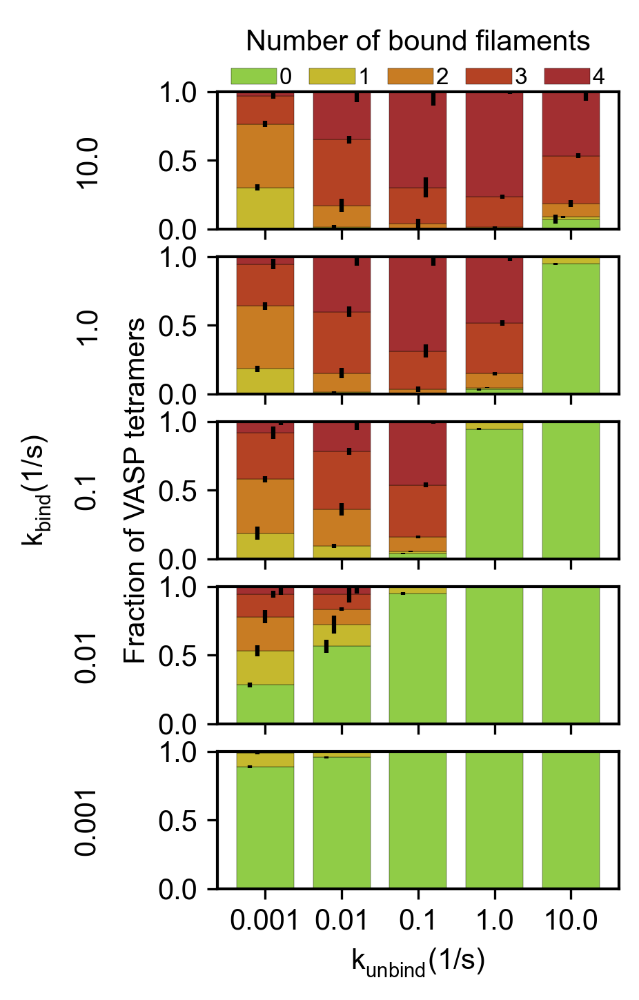

In [5]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
new_cmap = mpl.colors.LinearSegmentedColormap.from_list("", ['#90CC47', '#D7B226', '#BA4820', "#a22f31"])
labelvec = ['0.001', '0.01', '0.1', '1.0', '10.0'] 

# Get figure
nr = 5; nc = 1
fig, axvec = plt.subplots(nrows = nr, ncols = nc, figsize = (2.5, 5.0), 
                          dpi = 300, facecolor = 'w', edgecolor = 'k', sharex = False, sharey = False)

# Figure 2C
for plotcounter in range(0, nr):
    legcell = []
    df = pd.DataFrame()
    stddatavec = []
    Nvalency = 4 
    for val in range(0, len(kbindvec)):
        Rval = plotcounter*len(kunbindvec)+val
        stddatavec.append(np.array([val-0.2, cumarray[0][Rval], Std_0_fil[Rval]]))
        offset = -0.1
        for pos in range(0, Nvalency):
            if pos == 0:
                stddatavec.append(np.array([val+offset, cumarray[pos+1][Rval], Std_1_fil[Rval]]))
            elif pos == 1:
                stddatavec.append(np.array([val+offset, cumarray[pos+1][Rval], Std_2_fil[Rval]]))
            elif pos == 2:
                stddatavec.append(np.array([val+offset, cumarray[pos+1][Rval], Std_3_fil[Rval]]))
            elif pos == 3:
                stddatavec.append(np.array([val+offset, cumarray[pos+1][Rval], Std_4_fil[Rval]]))
            offset = offset + 0.1
    df = bardf[bardf["kbind"] == kbindvec[plotcounter]].drop(columns = "kbind")
    stddatavec = pd.DataFrame(np.array(stddatavec), columns = ['x', 'mean', 'std'])
    
    # PLOT
    ax = axvec[nr-plotcounter-1]
    df.plot(ax = ax, x = 'kunbind', kind = 'bar', stacked = True, legend = False, 
            width = 0.75,
            cmap = new_cmap, edgecolor = "black", linewidth = 0.1)
    ax.errorbar(stddatavec['x'], stddatavec['mean'], yerr = stddatavec['std'], 
                fmt = 'o', markersize = 0, ecolor = 'black')
    
    # Beautify
    ax.set_xticklabels(labelvec, rotation = 0)
    ax.set_ylim([0, 1])
    ax.set_yticks([0, 0.5, 1.0])
    
    if plotcounter > 0:
        ax.set_xticklabels([])

axvec[0].legend(['0', '1', '2', '3', '4'], title = 'Number of bound filaments', 
                 ncol=5, fontsize=8, frameon=False, loc='upper center', bbox_to_anchor=(0.5, 1.6), 
                 labelspacing = 0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 2)

plt.text(-0.2, 0.5, 'Fraction of VASP tetramers', horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)
axvec[nr-1].set_xlabel(r"$k_{unbind} (1/s)$")
axvec[1].set_xlabel('')
axvec[0].set_xlabel('')
axvec[0].set_ylabel('10.0', labelpad=20) 
axvec[1].set_ylabel('1.0', labelpad=20) 
axvec[2].set_ylabel('0.1', labelpad=20) 
axvec[3].set_ylabel('0.01', labelpad=20) 
axvec[4].set_ylabel('0.001', labelpad=20) 
plt.text(-0.45, 0.5, r"$k_{bind} (1/s)$", horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)

# SAVE FIGURE
plt.savefig('Figure_2C.png', dpi = 300, bbox_inches = 'tight')
fig.savefig('Figure_2C.pdf', bbox_inches = 'tight')

## Figure 2D-E K Means Clustering Functions

In [6]:
import matplotlib.pyplot as plt
from kneed import KneeLocator
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA, FactorAnalysis
from sklearn.metrics import silhouette_score, adjusted_rand_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
N_CLUSTERS = 6 
# https://realpython.com/k-means-clustering-python/#how-to-build-a-k-means-clustering-pipeline-in-python
preprocessor = Pipeline(
    [
        ("scaler", MinMaxScaler()),
    ]
)
preprocessor2 = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        ("pca", PCA(n_components=2)), 
    ]
)
clusterer = Pipeline(
   [
       (
           "kmeans",
           KMeans(
               n_clusters=N_CLUSTERS,
               init="k-means++",
               n_init=100,
               max_iter=750,
               random_state=42,
           ),
       ),
   ]
)
factor = Pipeline(
    [
        (
            "varimax",
            FactorAnalysis(n_components=2,
                           rotation="varimax")
    
        )
    ]
)
pipe = Pipeline(
    [
        ("preprocessor", preprocessor),
        ("clusterer", clusterer)
    ]
)
pipe2 = Pipeline(
    [
        ("preprocessor", preprocessor2),
        ("clusterer", clusterer)
    ]
)
varimaxpipe = Pipeline(
    [
        ("preprocessor", preprocessor),
        ("Varimax FA", factor),
    ]
)

## Figure 2D-E Data

In [7]:
def cluster_data(): 
    kbindvec =[1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
    kunbindvec =[1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
    Nreps = 10
    Nsnaps = 5
    startpos = 601-Nsnaps
    endpos = 601
    tv = 1000
    FO_Data=np.array([])
    ZeroBound = []
    OneBound = []
    TwoBound = []
    ThreeBound = []
    FourBound = []
    spana = []
    spanb =[]
    spanc = []
    taglist = []
    dirpath = 'Figure_2'
    jobfoldername = 'inputfiles'
    for koniter, kbind in enumerate(kbindvec):
        for koffiter, kunbind in enumerate (kunbindvec): 
            Rval = koniter*len(kunbindvec)+koffiter
            for repid in range(0,Nreps):
                # Data for actin-covered surface fraction
                fvar = dirpath+'/outputfiles/'+'FO_Output'+'/FO_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
                df = pd.read_csv(fvar,index_col=0)
                FO_Data = np.append(FO_Data, df.iloc[1].to_numpy()[startpos:endpos])

                # Data for the number of VASP molecules bound to {0, 1, 2, 3, 4} actin filaments
                fvar = dirpath+'/outputfiles/'+'CrosslinkOutput'+'/Crosslink_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
                df = pd.read_csv(fvar,index_col=0)
                
                ZeroBound_tmp = []
                OneBound_tmp = []
                TwoBound_tmp = []
                ThreeBound_tmp = []
                FourBound_tmp = []

                OneBound_tmp = df.iloc[9].to_numpy()
                TwoBound_tmp = df.iloc[11].to_numpy()
                ThreeBound_tmp = df.iloc[13].to_numpy()
                FourBound_tmp = df.iloc[13].to_numpy()
                ZeroBound_tmp = tv-OneBound_tmp-TwoBound_tmp-ThreeBound_tmp-FourBound_tmp

                OneBound = np.append(OneBound, df.iloc[9].to_numpy()[startpos:endpos]/tv)
                TwoBound = np.append(TwoBound, df.iloc[11].to_numpy()[startpos:endpos]/tv)
                ThreeBound = np.append(ThreeBound, df.iloc[13].to_numpy()[startpos:endpos]/tv)
                FourBound = np.append(FourBound, df.iloc[15].to_numpy()[startpos:endpos]/tv)
                ZeroBound = np.append(ZeroBound, ZeroBound_tmp[startpos:endpos]/tv)
                
                # Data for ellipsoid spans
                fvar = dirpath+'/outputfiles/'+'EigenvalueOutput'+'/Eigval'+jobfoldername+'R_'+str(Rval)+'_r_'+str(repid)+'.csv'
                df = pd.read_csv(fvar,index_col=0)
                spana = np.append(spana, df.iloc[1].to_numpy()[startpos:endpos])
                spanb = np.append(spanb, df.iloc[2].to_numpy()[startpos:endpos])
                spanc = np.append(spanc, df.iloc[3].to_numpy()[startpos:endpos])

                for frame in range(startpos, endpos):
                    taglist.append([kbind, kunbind, repid, frame])

                print('R_'+str(Rval)+'_r_'+str(repid))
                print('---')

    return [FO_Data, ZeroBound, OneBound, TwoBound, ThreeBound, FourBound, taglist, spana, spanb, spanc]



retlist = cluster_data()
for i in range(0,len(retlist)):
    print(len(retlist[i]))
FO_Data = retlist[0]
ZeroBound = retlist[1]
OneBound = retlist[2]
TwoBound = retlist[3]
ThreeBound = retlist[4]
FourBound = retlist[5]
taglist = retlist[6]
spana = retlist[7]
spanb = retlist[8]
spanc = retlist[9]

input_features = pd.DataFrame({'Actin Covered Surface Fraction':np.transpose(FO_Data), 
                      '1':np.transpose(OneBound),
                      '2':np.transpose(TwoBound), 
                      '3':np.transpose(ThreeBound), 
                      '4':np.transpose(FourBound)})

pipe2["preprocessor"]["pca"].n_components = 3
pipe2["clusterer"]["kmeans"].n_clusters = 4
pipe2.fit(input_features)

# Get the PCA data 
pcadf = pd.DataFrame(
    pipe2["preprocessor"].transform(input_features),
    columns=["PC1", "PC2", "PC3"]
)

varimaxpipe.fit(input_features)
components = varimaxpipe['Varimax FA']['varimax'].components_
print(varimaxpipe['Varimax FA']['varimax'])
print(components)
pcadf["Predicted Cluster"] = (pipe2["clusterer"]["kmeans"]).labels_.astype(str)
pcadf["tag"] = taglist
pcadf.to_csv('Figure_2D-E_Data.csv')
#####################################

R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
R_6_r_0
---
R_6_r_1
---
R_6_r_2
---
R_6_r_3
---
R_6_r_4
---
R_6_r_5
---
R_6_r_6
---
R_6_r_7
---
R_6_r_8
---
R_6_r_9
---
R_7_r_0
---
R_7_r_1
---
R_7_r_2
---
R_7_r_3
---
R_7_r_4
---
R_7_r_5
---
R_7_r_6
---
R_7_r_7
---
R_7_r_8
---
R_7_r_9
---
R_8_r_0
---
R_8_r_1
---
R_8_r_2
---
R_8_

## Plot Figure 2D

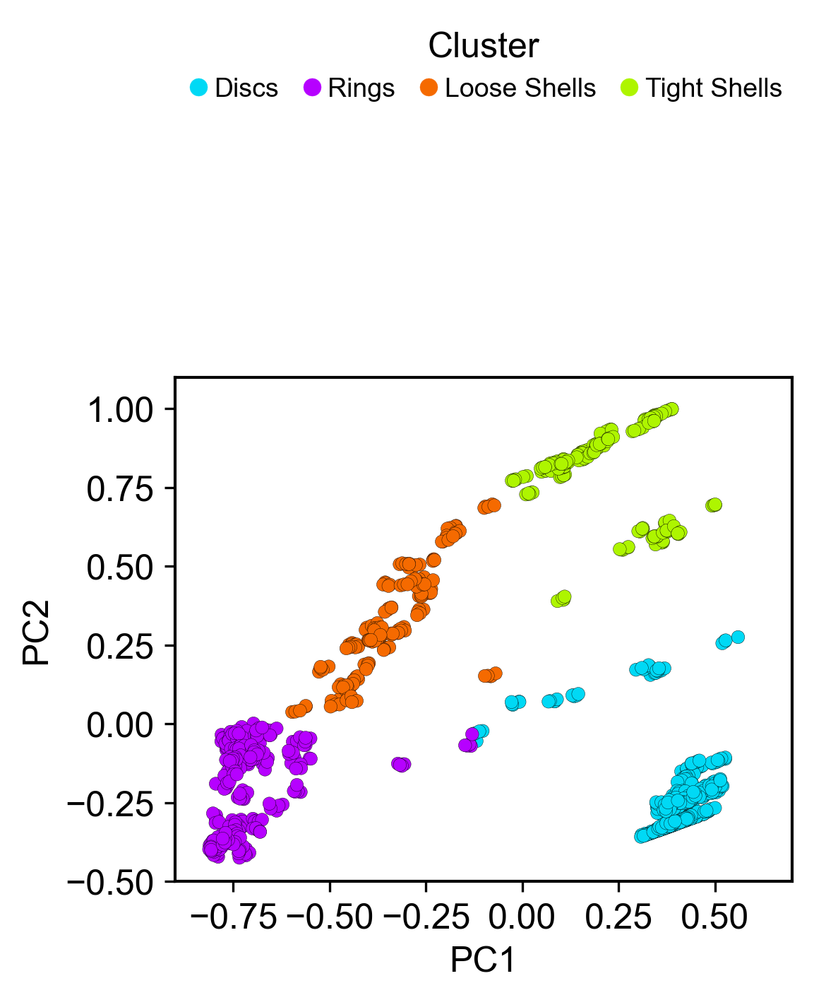

In [8]:
new_cmap = mpl.colors.LinearSegmentedColormap.from_list("", ['#00D9F5','#B601FF','#F56A00','#AEF500'])
plt.rcParams.update({'font.size': 12, 'font.family':'arial', 'font.weight':'normal'})
kmdf = pd.read_csv('Figure_2D-E_Data.csv',index_col=0)
kmdf['PC1']=-1*kmdf['PC1']
cluster_string = ['Discs', 'Rings', 'Loose Shells', 'Tight Shells']

fig, axvec = plt.subplots(nrows=1, ncols=1,figsize=(4.0,6.0), 
                        dpi=300, facecolor='w', edgecolor='k', sharex=False, sharey=False)
scatter = axvec.scatter(data=kmdf, x="PC1", y="PC2",c="Predicted Cluster", cmap=new_cmap, 
            edgecolors='black', linewidths=0.1, s=20.0)
    
X=list(scatter.legend_elements(num=3))
X[1] = cluster_string
legend1 = axvec.legend(X[0], X[1], title="Cluster", ncol=4, fontsize=9,
                    frameon=False, loc="lower center", bbox_to_anchor=(0.5,1.5),
                    labelspacing = 0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1)
 
axvec.set_xlim([-0.9, 0.7])
axvec.set_ylim([-0.5, 1.1])
axvec.set_xticks([-0.75, -0.5, -0.25, 0.0, 0.25, 0.5])
axvec.set_yticks([-0.5, -0.25, 0.0, 0.25, 0.5, 0.75, 1.0])
    
# Plot closest point
axvec.set_xlabel('PC1')
axvec.set_ylabel('PC2')
fig.tight_layout()

# SAVE FIGURE
plt.savefig('Figure_2D.png', dpi=300, bbox_inches='tight')
fig.savefig('Figure_2D.pdf', bbox_inches='tight')

## Plot Figure 2E

Cluster  0
n =  590
---
Cluster  1
n =  310
---
Cluster  2
n =  165
---
Cluster  3
n =  185
---


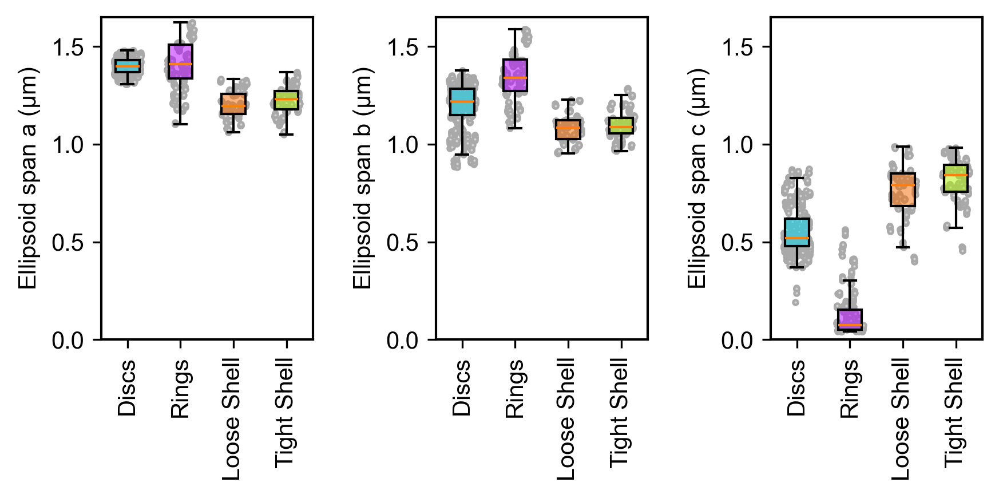

In [9]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorvec = ['#00D9F580','#B601FF80','#F56A0080','#AEF50080']

pcadf = pd.read_csv('Figure_2D-E_Data.csv',index_col=0)

plotdf = pd.DataFrame({'spana':spana,
                       'spanb':spanb,
                       'spanc':spanc,
                       'Predicted Cluster':pcadf['Predicted Cluster']})

plotdf["Predicted Cluster"] = plotdf["Predicted Cluster"].astype(int)
fig, axvec = plt.subplots(nrows=1, ncols=3,figsize=(6.0,3.0), 
                          dpi=300, facecolor='w', edgecolor='k', sharex=False, sharey=False)

for tagiter, tagval in enumerate(['spana','spanb','spanc']):
    for clusterid in range(0,4):
        clusterdf = plotdf[plotdf['Predicted Cluster'] == clusterid][tagval].values
        for x in range(0, len(clusterdf)):
            w = 0.25
            axvec[tagiter].plot((clusterid + 1) - w + (x*2*w/(len(clusterdf)-1)), clusterdf[x], marker='o', markersize=2, color='lightgrey', markeredgecolor='darkgrey')
        if tagval == 'spanc':
            print('Cluster ', clusterid)
            print('n = ', len(clusterdf))
            print('---')
    bplot = axvec[tagiter].boxplot([
        plotdf[plotdf['Predicted Cluster'] == 0][tagval].values,
        plotdf[plotdf['Predicted Cluster'] == 1][tagval].values,
        plotdf[plotdf['Predicted Cluster'] == 2][tagval].values,
        plotdf[plotdf['Predicted Cluster'] == 3][tagval].values,
                    ], patch_artist=True, showfliers=False)
    
    for patch, color in zip(bplot['boxes'], colorvec):
        patch.set_facecolor(color)
    
    axvec[tagiter].set_xticklabels(['Discs','Rings','Loose Shell','Tight Shell'], rotation=90)
    if tagiter == 0:
        axvec[tagiter].set_ylabel(r'Ellipsoid span a '+r'$(\mu m)$')
    elif tagiter == 1:
        axvec[tagiter].set_ylabel(r'Ellipsoid span b '+r'$(\mu m)$')
    elif tagiter == 2:
        axvec[tagiter].set_ylabel(r'Ellipsoid span c '+r'$(\mu m)$')
    axvec[tagiter].set_ylim([0,1.65])
plt.tight_layout()

plt.savefig('Figure_2E.png', dpi=300, bbox_inches='tight')
fig.savefig('Figure_2E.pdf', bbox_inches='tight')

# Figure 3

## Figure 3A Data

In [10]:
# Load all replicates
# Take mean and std
# plot 5 rows 1 column plots
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

jobfoldername = 'inputfiles' 
kbindvec =[1e-3]
kunbindvec =[1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
Nreps = 10
MeanlistAR = []
StdlistAR = []
dirpath = 'Figure_3/Figure_3A'
for koniter, kbind in enumerate(kbindvec):
    for koffiter, kunbind in enumerate (kunbindvec):
        AspectRatio = []
        Rval = koniter*len(kunbindvec)+koffiter
        for repid in range(0,Nreps):
            fvar = dirpath+'/outputfiles/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df = pd.read_csv(fvar,index_col=0)
            Timevec = df.iloc[0].to_numpy()
            a1 = df.iloc[1].to_numpy()
            a2 = df.iloc[2].to_numpy()
            a3 = df.iloc[3].to_numpy()
            AspectRatio_tmp = np.zeros(len(Timevec))
            for time in range(0,len(Timevec)):
                a = max(a1[time], a2[time], a3[time])
                c = min(a1[time], a2[time], a3[time])
                AspectRatio_tmp[time] = a/c
            AspectRatio.append(AspectRatio_tmp)
            print('R_'+str(Rval)+'_r_'+str(repid))
            print('Aspect Ratio at t=600s for Replicate ' + str(repid) + ' : ',AspectRatio_tmp[600])
            print('---')
        AspectRatio = np.array(AspectRatio)
        MeanlistAR.append(np.mean(AspectRatio,0))
        StdlistAR.append(np.std(AspectRatio,0))
        print('R_'+str(Rval)+' - Average Aspect Ratio at t=600s: ',np.mean(AspectRatio,0)[600])
        print('------------------')
Timevec = df.iloc[0].to_numpy()


R_0_r_0
Aspect Ratio at t=600s for Replicate 0 :  1.380421088148057
---
R_0_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.3383183230471993
---
R_0_r_2
Aspect Ratio at t=600s for Replicate 2 :  1.2790855233612168
---
R_0_r_3
Aspect Ratio at t=600s for Replicate 3 :  1.3424118325315098
---
R_0_r_4
Aspect Ratio at t=600s for Replicate 4 :  1.3160403719389437
---
R_0_r_5
Aspect Ratio at t=600s for Replicate 5 :  1.3289620489250804
---
R_0_r_6
Aspect Ratio at t=600s for Replicate 6 :  1.3758843951218065
---
R_0_r_7
Aspect Ratio at t=600s for Replicate 7 :  1.2727850912499814
---
R_0_r_8
Aspect Ratio at t=600s for Replicate 8 :  1.3605997668978205
---
R_0_r_9
Aspect Ratio at t=600s for Replicate 9 :  1.326604288360587
---
R_0 - Average Aspect Ratio at t=600s:  1.3321112729582203
------------------
R_1_r_0
Aspect Ratio at t=600s for Replicate 0 :  1.4195921938008187
---
R_1_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.3759709887165508
---
R_1_r_2
Aspect Ratio at t=600s for Replicate 2 : 

## Plot Figure 3A

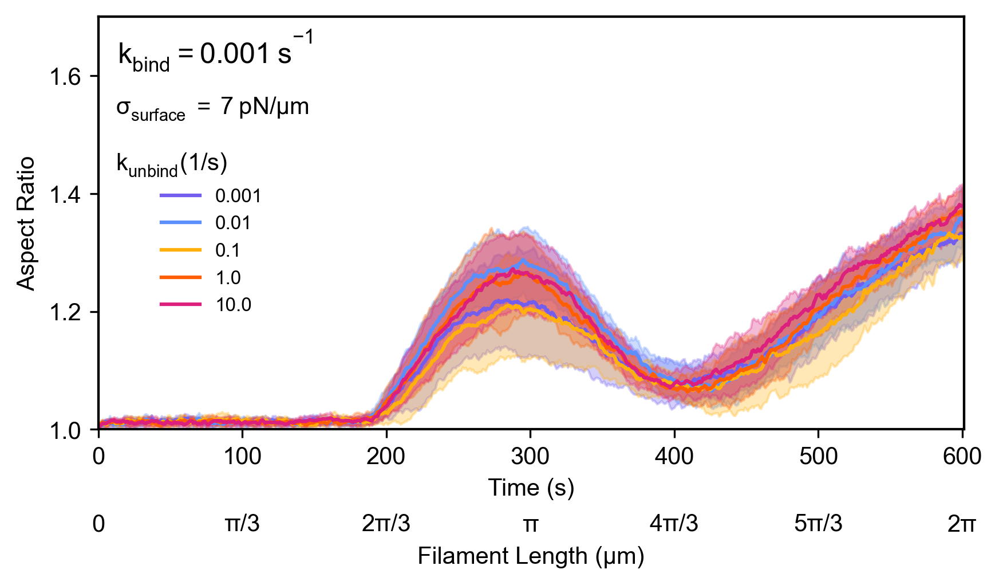

In [11]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']

# Aspect Ratio Figure
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(6,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
ax1 = axvec
for plotcounter in range(0,nr):
    legcell = []
    for val in range(0,5):
        Rval = plotcounter*len(kunbindvec) + val
        x = ax1.plot(Timevec,MeanlistAR[Rval],color=colorlist[val])
        legcell.append(x[0]);
        ax1.fill_between(Timevec,MeanlistAR[Rval]-StdlistAR[Rval],MeanlistAR[Rval]+StdlistAR[Rval],color=colorlist[val],alpha=0.3)
ax1.set_xlabel('Time (s)') 
ax1.set_ylabel('Aspect Ratio') 
ax1.set_xlim([0,601]) 
ax1.set_ylim([1.0,1.7])
ax1.set_xticks([0,100,200,300,400,500,600]) 
ax1.set_yticks([1.0,1.2,1.4,1.6])
leg = fig.legend(legcell, kunbindvec,title='\n \n' + r"$\sigma_{surface} \: = \: 7 \: pN/µm$" + '\n \n' + r"$k_{unbind} (1/s)$",ncol=1,fontsize=8,frameon=False,
                loc='upper left', bbox_to_anchor=(0.15, 0.88), labelspacing=0.5)

ax2 = ax1.twiny()
ax2.set_xlim(ax1.get_xlim())
ax2.set_xticks(ax1.get_xticks())
ax2.set_xticklabels(['0', 'π/3', '2π/3', 'π', '4π/3', '5π/3', '2π'])
ax2.set_xlabel('Filament Length (µm)')
ax2.xaxis.set_ticks_position('bottom')
ax2.xaxis.set_label_position('bottom')
ax2.spines['bottom'].set_position(('outward', 32))
ax2.spines['bottom'].set_visible(False)
ax2.tick_params(axis='x', length=0)

plt.text(0.135, 0.92, r"$k_{bind} = 0.001 \: s^{-1}$", horizontalalignment='center', verticalalignment='center', transform=axvec.transAxes, fontsize=12)
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_3A.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_3A.pdf', dpi=300, bbox_inches='tight')

## Figure 3B Data

In [12]:
# Assemble data for figure

# Load all replicates
# Take mean and std
# plot 5 rows 1 column plots
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

# Define power law equation
def power_law(x, a, b):
    return a * np.power(x, b)

jobfoldername = 'inputfiles' 
Diameter = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0]
Nfil = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100]
nTension = [str(2), str(4), str(8)]
lowerAR = 1.5
upperAR = 2.0
Nreps = 10
Dfitdata = []
Nfitdata = []
tensionARfit = []
adata = []
bdata = []
r2data = []

dirpath = 'Figure_3/Figure_3B'
for teniter, tension in enumerate(nTension):
    fitDataAR = []
    for Nfiliter in range (0, len(Nfil)):
        for diter in range (0, len(Diameter)):
            abc = []
            Rval = diter + len(Diameter)*Nfiliter
            for repid in range(0, Nreps):
                fvar = dirpath+'/outputfiles_tension_'+tension+'/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
                df = pd.read_csv(fvar,index_col=0)
                Timevec = df.iloc[0].to_numpy()
                a1 = df.iloc[1].to_numpy()
                a2 = df.iloc[2].to_numpy()
                a3 = df.iloc[3].to_numpy()
                AspectRatio = np.zeros(len(Timevec))
                for time in range(0, len(Timevec)):
                    abc_tmp = np.array([a1[time],a2[time],a3[time]])
                    abc = np.sort(abc_tmp)
                    a = abc[2]
                    b = abc[1]
                    c = abc[0]
                    AspectRatio[time] = a/c
                if AspectRatio[600] >= lowerAR  and AspectRatio[600] <= upperAR:
                    fitDataAR.append([Rval, repid, Nfil[Nfiliter], Diameter[diter], AspectRatio[600]])
                print('R_'+str(Rval)+'_r_'+str(repid))
                print('---')

    fitdf = pd.DataFrame(fitDataAR, columns =  ["Rval", "Replicate", "Nfil", "Diameter", "AspectRatio"])
    fitdf = fitdf.groupby("Diameter").filter(lambda x: len(x) >= 10)
    Dfitdata_tmp = fitdf["Diameter"]
    Dfitdata.append(Dfitdata_tmp)
    Nfitdata_tmp = fitdf["Nfil"]
    Nfitdata.append(Nfitdata_tmp)
    Diameter_Fit = np.linspace(0, 4.5, 451)

    params, pcov, infodict, _, _ = opt.curve_fit(power_law, Dfitdata_tmp, Nfitdata_tmp, full_output=True)
    a, b = params
    adata.append(a)
    bdata.append(b)
        
    fvec = infodict['fvec']
    r2 = 1 - (np.sum(np.square(fvec)))/(np.sum(np.square(Nfitdata_tmp - np.mean(Nfitdata_tmp))))
    r2data.append(r2)
    tensionARfit_tmp = a * Diameter_Fit**b
    tensionARfit.append(tensionARfit_tmp)
    

R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
R_6_r_0
---
R_6_r_1
---
R_6_r_2
---
R_6_r_3
---
R_6_r_4
---
R_6_r_5
---
R_6_r_6
---
R_6_r_7
---
R_6_r_8
---
R_6_r_9
---
R_7_r_0
---
R_7_r_1
---
R_7_r_2
---
R_7_r_3
---
R_7_r_4
---
R_7_r_5
---
R_7_r_6
---
R_7_r_7
---
R_7_r_8
---
R_7_r_9
---
R_8_r_0
---
R_8_r_1
---
R_8_r_2
---
R_8_

## Plot Figure 3B

Surface Tension =  2
Number of Replicates:  10
Number of Data Points:  131
Power Fit:  y = 1.1545x^(3.9504)
R2:  0.9403751217716235
------------------
Surface Tension =  4
Number of Replicates:  10
Number of Data Points:  179
Power Fit:  y = 3.6606x^(3.3718)
R2:  0.8723059417915392
------------------
Surface Tension =  8
Number of Replicates:  10
Number of Data Points:  170
Power Fit:  y = 9.3169x^(2.9832)
R2:  0.7513210026714394
------------------


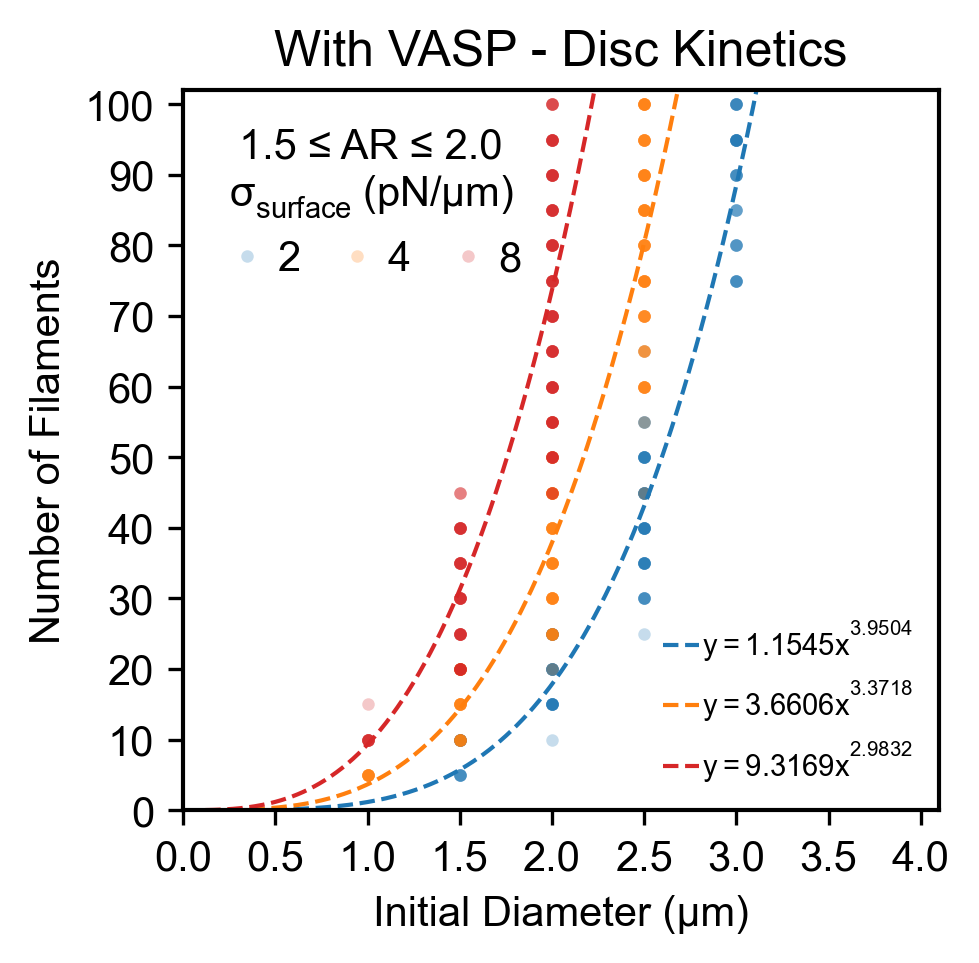

In [13]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['tab:blue', 'tab:orange', 'tab:red']

# Figure
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
for plotcounter in range(0,nr):
    legcell1 = []
    for teniter in range(0, len(nTension)):
        x1=axvec.plot(Dfitdata[teniter],Nfitdata[teniter],marker='.',linewidth=0.0,color=colorlist[teniter],alpha=0.25,markeredgecolor='none', label=f"${nTension[teniter]}$")
        legcell1.append(x1[0]);
    legcell2 = []
    for teniter in range(0, len(nTension)):
        x2=axvec.plot(Diameter_Fit,tensionARfit[teniter],linewidth=1.0,linestyle='dashed',color=colorlist[teniter],alpha=1.0, label=f"$y = {adata[teniter]:.4f} x^{{ {bdata[teniter]:.4f} }}$")
        legcell2.append(x2[0]);
        print("Surface Tension = ",  nTension[teniter])
        print('Number of Replicates: ', Nreps)
        print('Number of Data Points: ', len(Nfitdata[teniter]))
        print('Power Fit: ', f"y = {adata[teniter]:.4f}x^({bdata[teniter]:.4f})")
        print('R2: ', r2data[teniter])
        print('------------------')
axvec.set_xlabel(r"Initial Diameter (µm)")
axvec.set_xlim([0,4.1]) 
axvec.set_ylabel(r"Number of Filaments") 
axvec.set_ylim([0,102]) 

axvec.set_yticks([0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]) 
axvec.set_xticks([0.0,0.5,1,1.5,2,2.5,3,3.5,4]) 

leg1 = fig.legend(handles=legcell1, title = str(lowerAR) + r" ≤ AR ≤ " + str(upperAR) + '\n' + r"$\sigma_{surface} \: (pN/\mu m)$",ncol=3,fontsize=10.0,frameon=False,
                loc='upper left', bbox_to_anchor=(0.15, 0.9), labelspacing=0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)
plt.setp(leg1.get_title(), ha ='center')
leg2 = plt.legend(handles=legcell2, loc='lower right', ncol=1,fontsize=7.0, frameon=False, 
                labelspacing=0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)

plt.title('With VASP - Disc Kinetics')
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
    
plt.savefig('Figure_3B.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_3B.pdf', dpi=300, bbox_inches='tight')

## Figure 3C Data

In [14]:
# Path to Excel data
datafile = 'Source_Data_Fig_3.xlsx'
# Read Excel file with multiple sheets
xlsx = pd.read_excel(datafile, sheet_name=['Fig 3C', 'Fig 3E'])

df = xlsx['Fig 3C']
df.columns = df.iloc[0]

df = df.reset_index(drop=True)
Discs = df.iloc[:, [0, 1]]
Discs = Discs.dropna()

def power_law(x, a, b):
    return a * np.power(x, b)

DiscsD = np.array(Discs.iloc[:, 0])
DiscsD = DiscsD.astype(float)
DiscsT = np.array(Discs.iloc[:, 1])
DiscsT = DiscsT.astype(float)

Diameter_Fit = np.linspace(0, 6, 300)

params, pcov, infodict, _, _ = opt.curve_fit(power_law, DiscsD, DiscsT, full_output=True)
a, b = params
print("Discs Fit Parameters")
print("a:", a)
print("b:", b)

Discs_Fit = a * Diameter_Fit**b
fvec = infodict['fvec']
r2 = 1 - (np.sum(np.square(fvec)))/(np.sum(np.square(DiscsT - np.mean(DiscsT))))
print('R2: ', r2)

Discs Fit Parameters
a: 0.07969049031364238
b: 1.8455941855796942
R2:  0.8429533765850994


## Plot Figure 3C

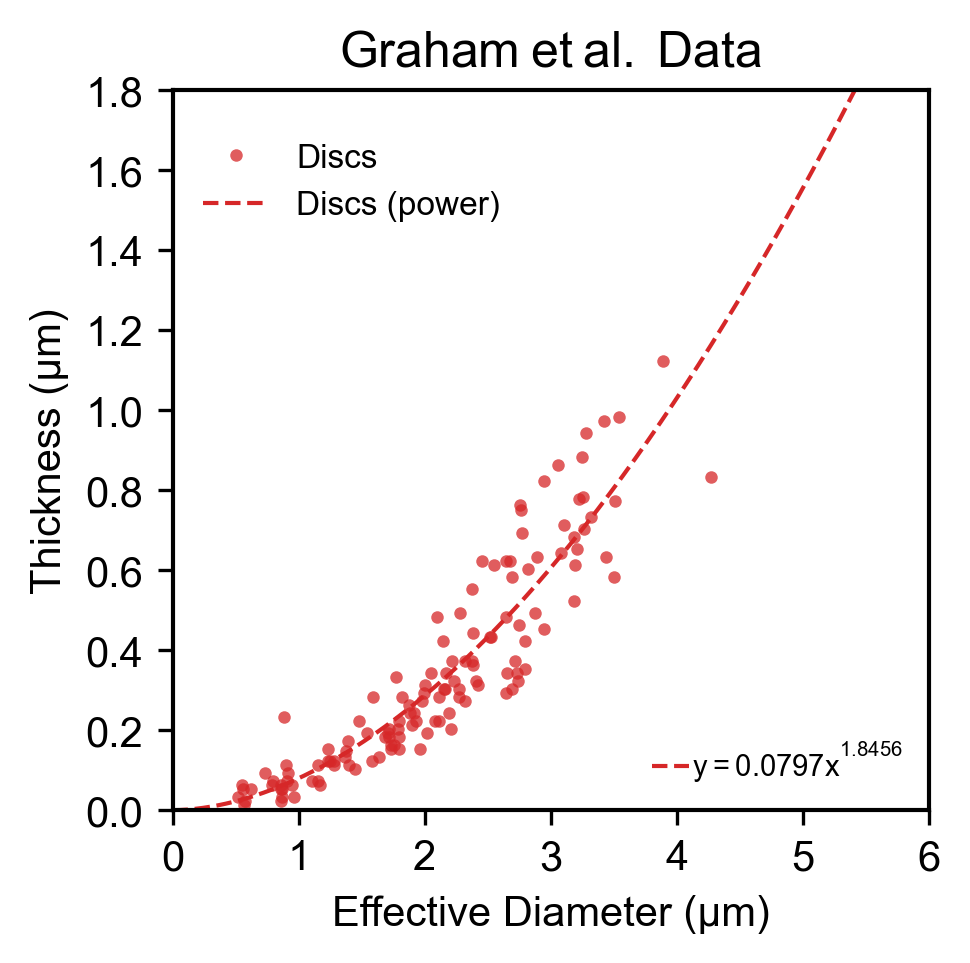

In [15]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})

nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)

for plotcounter in range(0,nr):
    legcell1 = []
    x1=axvec.plot(DiscsD,DiscsT,marker='.',linewidth=0.0,color='tab:red',alpha=0.75,markeredgecolor='none')
    legcell1.append(x1[0]);
    legcell2 = []
    x2=axvec.plot(Diameter_Fit,Discs_Fit,linewidth=1.0,linestyle='dashed',color='tab:red',alpha=1.0,label=f"$y = {a:.4f} x^{{ {b:.4f} }}$")
    legcell1.append(x2[0]);
    legcell2.append(x2[0]);

labelvec = ['Discs', 'Discs (power)']

axvec.set_xlabel('Effective Diameter (µm)') 
axvec.set_xlim([0,6]) 
axvec.set_ylabel('Thickness (µm)') 
axvec.set_ylim([0,1.8]) 
axvec.set_yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8]) 
axvec.set_xticks([0,1,2,3,4,5,6]) 
leg = fig.legend(legcell1, labelvec,ncol=1,fontsize=8,frameon=False,
                loc='upper left', bbox_to_anchor=(0.15, 0.875), labelspacing=0.5)
leg2 = plt.legend(handles=legcell2, loc='lower right', ncol=1,fontsize=7.0, frameon=False, 
                  labelspacing=0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)
plt.title(r"$Graham \: et \: al. \: Data$")
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_3C.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_3C.pdf', dpi=300, bbox_inches='tight')

## Figure 3D Data

In [16]:
# Assemble data for figure

# Load all replicates
# Take mean and std
# plot 5 rows 1 column plots
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

# Define power law equation
def power_law(x, a, b):
    return a * np.power(x, b)

jobfoldername = 'inputfiles' 
Diameter = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0]
Nfil = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100]
nTension = [str(2), str(4), str(8)]
lowerAR = 1.5
upperAR = 2.0
Nreps = 10
Dfitdata = []
Nfitdata = []
tensionARfit = []
adata = []
bdata = []
r2data = []

dirpath = 'Figure_3/Figure_3D'
for teniter, tension in enumerate(nTension):
    fitDataAR = []
    for Nfiliter in range (0, len(Nfil)):
        for diter in range (0, len(Diameter)):
            abc = []
            Rval = diter + len(Diameter)*Nfiliter
            for repid in range(0, Nreps):
                fvar = dirpath+'/outputfiles_tension_'+tension+'/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
                df = pd.read_csv(fvar,index_col=0)
                Timevec = df.iloc[0].to_numpy()
                a1 = df.iloc[1].to_numpy()
                a2 = df.iloc[2].to_numpy()
                a3 = df.iloc[3].to_numpy()
                AspectRatio = np.zeros(len(Timevec))
                for time in range(0, len(Timevec)):
                    abc_tmp = np.array([a1[time],a2[time],a3[time]])
                    abc = np.sort(abc_tmp)
                    a = abc[2]
                    b = abc[1]
                    c = abc[0]
                    AspectRatio[time] = a/c
                if AspectRatio[600] >= lowerAR  and AspectRatio[600] <= upperAR:
                    fitDataAR.append([Rval, repid, Nfil[Nfiliter], Diameter[diter], AspectRatio[600]])
                print('R_'+str(Rval)+'_r_'+str(repid))
                print('---')

    fitdf = pd.DataFrame(fitDataAR, columns =  ["Rval", "Replicate", "Nfil", "Diameter", "AspectRatio"])
    fitdf = fitdf.groupby("Diameter").filter(lambda x: len(x) >= 10)
    Dfitdata_tmp = fitdf["Diameter"]
    Dfitdata.append(Dfitdata_tmp)
    Nfitdata_tmp = fitdf["Nfil"]
    Nfitdata.append(Nfitdata_tmp)
    Diameter_Fit = np.linspace(0, 4.5, 451)

    params, pcov, infodict, _, _ = opt.curve_fit(power_law, Dfitdata_tmp, Nfitdata_tmp, full_output=True)
    a, b = params
    adata.append(a)
    bdata.append(b)
        
    fvec = infodict['fvec']
    r2 = 1 - (np.sum(np.square(fvec)))/(np.sum(np.square(Nfitdata_tmp - np.mean(Nfitdata_tmp))))
    r2data.append(r2)
    tensionARfit_tmp = a * Diameter_Fit**b
    tensionARfit.append(tensionARfit_tmp)


R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
R_6_r_0
---
R_6_r_1
---
R_6_r_2
---
R_6_r_3
---
R_6_r_4
---
R_6_r_5
---
R_6_r_6
---
R_6_r_7
---
R_6_r_8
---
R_6_r_9
---
R_7_r_0
---
R_7_r_1
---
R_7_r_2
---
R_7_r_3
---
R_7_r_4
---
R_7_r_5
---
R_7_r_6
---
R_7_r_7
---
R_7_r_8
---
R_7_r_9
---
R_8_r_0
---
R_8_r_1
---
R_8_r_2
---
R_8_

## Plot Figure 3D

Surface Tension =  2
Number of Replicates:  10
Number of Data Points:  51
Power Fit:  y = 3.2949x^(3.6834)
R2:  0.8190179068806116
------------------
Surface Tension =  4
Number of Replicates:  10
Number of Data Points:  66
Power Fit:  y = 4.0138x^(3.8149)
R2:  0.8201056712912149
------------------
Surface Tension =  8
Number of Replicates:  10
Number of Data Points:  116
Power Fit:  y = 8.5601x^(3.2445)
R2:  0.9037647742494057
------------------


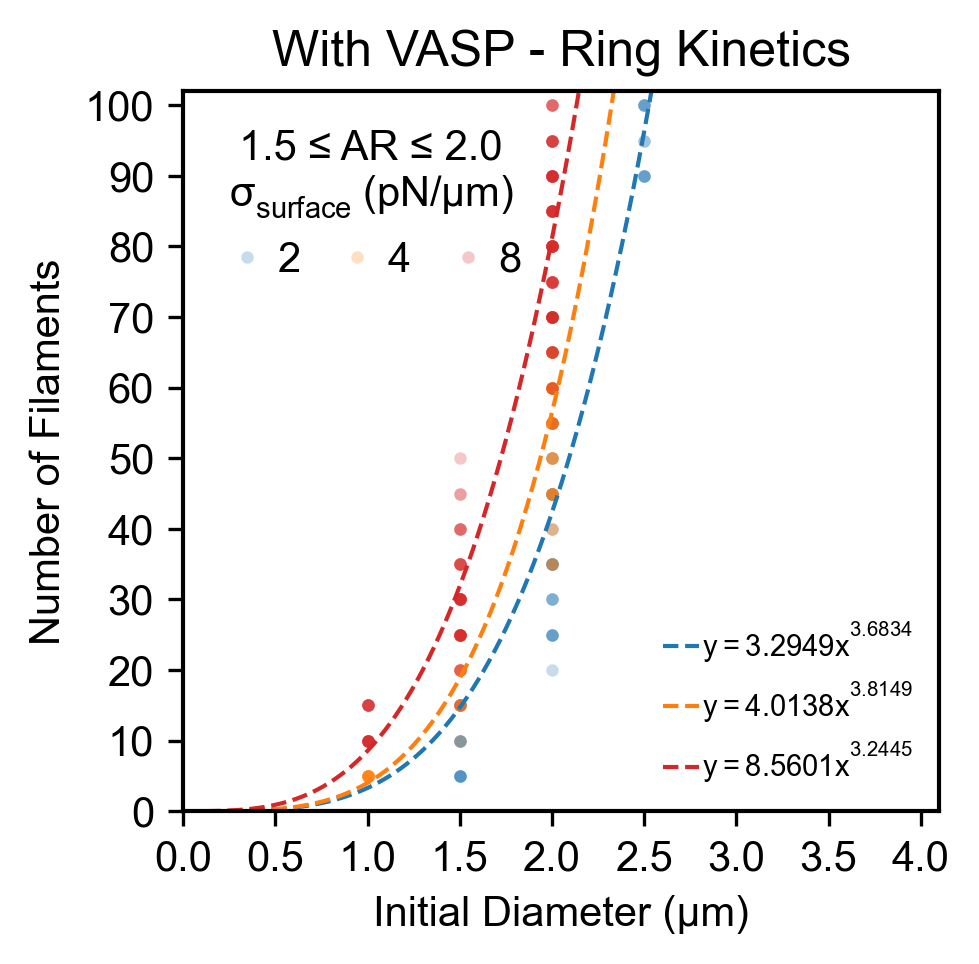

In [17]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['tab:blue', 'tab:orange', 'tab:red']

# Figure
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
for plotcounter in range(0,nr):
    legcell1 = []
    for teniter in range(0, len(nTension)):
        x1=axvec.plot(Dfitdata[teniter],Nfitdata[teniter],marker='.',linewidth=0.0,color=colorlist[teniter],alpha=0.25,markeredgecolor='none', label=f"${nTension[teniter]}$")
        legcell1.append(x1[0]);
    legcell2 = []
    for teniter in range(0, len(nTension)):
        x2=axvec.plot(Diameter_Fit,tensionARfit[teniter],linewidth=1.0,linestyle='dashed',color=colorlist[teniter],alpha=1.0, label=f"$y = {adata[teniter]:.4f} x^{{ {bdata[teniter]:.4f} }}$")
        legcell2.append(x2[0]);
        print("Surface Tension = ",  nTension[teniter])
        print('Number of Replicates: ', Nreps)
        print('Number of Data Points: ', len(Nfitdata[teniter]))
        print('Power Fit: ', f"y = {adata[teniter]:.4f}x^({bdata[teniter]:.4f})")
        print('R2: ', r2data[teniter])
        print('------------------')
axvec.set_xlabel(r"Initial Diameter (µm)")
axvec.set_xlim([0,4.1]) 
axvec.set_ylabel(r"Number of Filaments") 
axvec.set_ylim([0,102]) 

axvec.set_yticks([0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]) 
axvec.set_xticks([0.0,0.5,1,1.5,2,2.5,3,3.5,4]) 

leg1 = fig.legend(handles=legcell1, title = str(lowerAR) + r" ≤ AR ≤ " + str(upperAR) + '\n' + r"$\sigma_{surface} \: (pN/\mu m)$",ncol=3,fontsize=10.0,frameon=False,
                loc='upper left', bbox_to_anchor=(0.15, 0.9), labelspacing=0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)
plt.setp(leg1.get_title(), ha ='center')
leg2 = plt.legend(handles=legcell2, loc='lower right', ncol=1,fontsize=7.0, frameon=False, 
                labelspacing=0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)

plt.title('With VASP - Ring Kinetics')
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
    
plt.savefig('Figure_3D.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_3D.pdf', dpi=300, bbox_inches='tight')

## Figure 3E Data

In [18]:
# Path to Excel data
datafile = 'Source_Data_Fig_3.xlsx'
# Read Excel file with multiple sheets
xlsx = pd.read_excel(datafile, sheet_name=['Fig 3C', 'Fig 3E'])

df = xlsx['Fig 3E']
df.columns = df.iloc[0]

df = df.reset_index(drop=True)
Rings = df.iloc[:, [0, 1]]
Rings = Rings.dropna()

def power_law(x, a, b):
    return a * np.power(x, b)

RingsD = np.array(Rings.iloc[:, 0])
RingsD = RingsD.astype(float)
RingsT = np.array(Rings.iloc[:, 1])
RingsT = RingsT.astype(float)

Diameter_Fit = np.linspace(0, 6, 300)

params, pcov, infodict, _, _ = opt.curve_fit(power_law, RingsD, RingsT, full_output=True)
a, b = params
print("Rings Fit Parameters")
print("a:", a)
print("b:", b)

Rings_Fit = a * Diameter_Fit**b
fvec = infodict['fvec']
r2 = 1 - (np.sum(np.square(fvec)))/(np.sum(np.square(RingsT - np.mean(RingsT))))
print('R2: ', r2)

Rings Fit Parameters
a: 0.0476018456600173
b: 1.9681986872595991
R2:  0.7277934283509935


## Plot Figure 3E

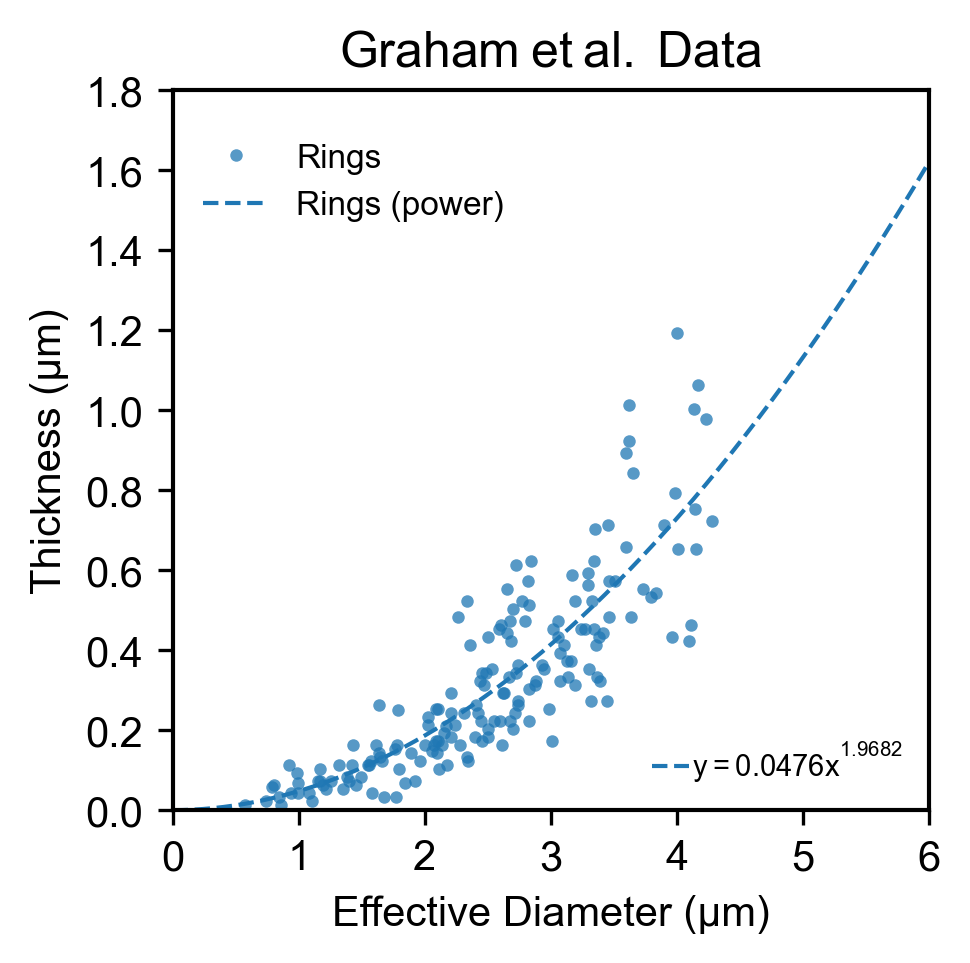

In [19]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})

nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)

for plotcounter in range(0,nr):
    legcell1 = []
    x1=axvec.plot(RingsD,RingsT,marker='.',linewidth=0.0,color='tab:blue',alpha=0.75,markeredgecolor='none')
    legcell1.append(x1[0]);
    legcell2 = []
    x2=axvec.plot(Diameter_Fit,Rings_Fit,linewidth=1.0,linestyle='dashed',color='tab:blue',alpha=1.0,label=f"$y = {a:.4f} x^{{ {b:.4f} }}$")
    legcell1.append(x2[0]);
    legcell2.append(x2[0]);

labelvec = ['Rings', 'Rings (power)']

axvec.set_xlabel('Effective Diameter (µm)') 
axvec.set_xlim([0,6]) 
axvec.set_ylabel('Thickness (µm)') 
axvec.set_ylim([0,1.8]) 
axvec.set_yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8]) 
axvec.set_xticks([0,1,2,3,4,5,6]) 
leg = fig.legend(legcell1, labelvec,ncol=1,fontsize=8,frameon=False,
                loc='upper left', bbox_to_anchor=(0.15, 0.875), labelspacing=0.5)
leg2 = plt.legend(handles=legcell2, loc='lower right', ncol=1,fontsize=7.0, frameon=False, 
                  labelspacing=0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)
plt.title(r"$Graham \: et \: al. \: Data$")
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_3E.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_3E.pdf', dpi=300, bbox_inches='tight')

# Figure 4

## Figure 4B Data

In [20]:
# Assemble data for figure

# Load all replicates
# Take mean and std
# Row 0 - Time
# Row 1 - Filament length distribution 
jobfoldername = 'inputfiles' 
Meanlist = []
Stdlist = []
lengthList = []
dirpath = 'Figure_4'
for Rval in range(7, 15):
        Row1 = []
        fvar = dirpath+'/outputfiles/FilLengthOutput'+'/Fillength_dist_'+jobfoldername+'R_'+str(Rval)+'.csv'
        df = pd.read_csv(fvar, index_col = 0)
        datavec = df.iloc[-1].to_numpy()
        Row1.append(datavec)
        print('R_'+str(Rval))
        print('---')
        Row1 = np.array(Row1)
        lengthList.append(Row1)

Timevec = np.linspace(0, 600, 601)
Lengthvec = np.linspace(0, 6.5, len(Row1[0])+1)
Lengthvec = Lengthvec[:-1] + (6.5/len(Row1[0]))/2

R_7
---
R_8
---
R_9
---
R_10
---
R_11
---
R_12
---
R_13
---
R_14
---


## Plot Figure 4B

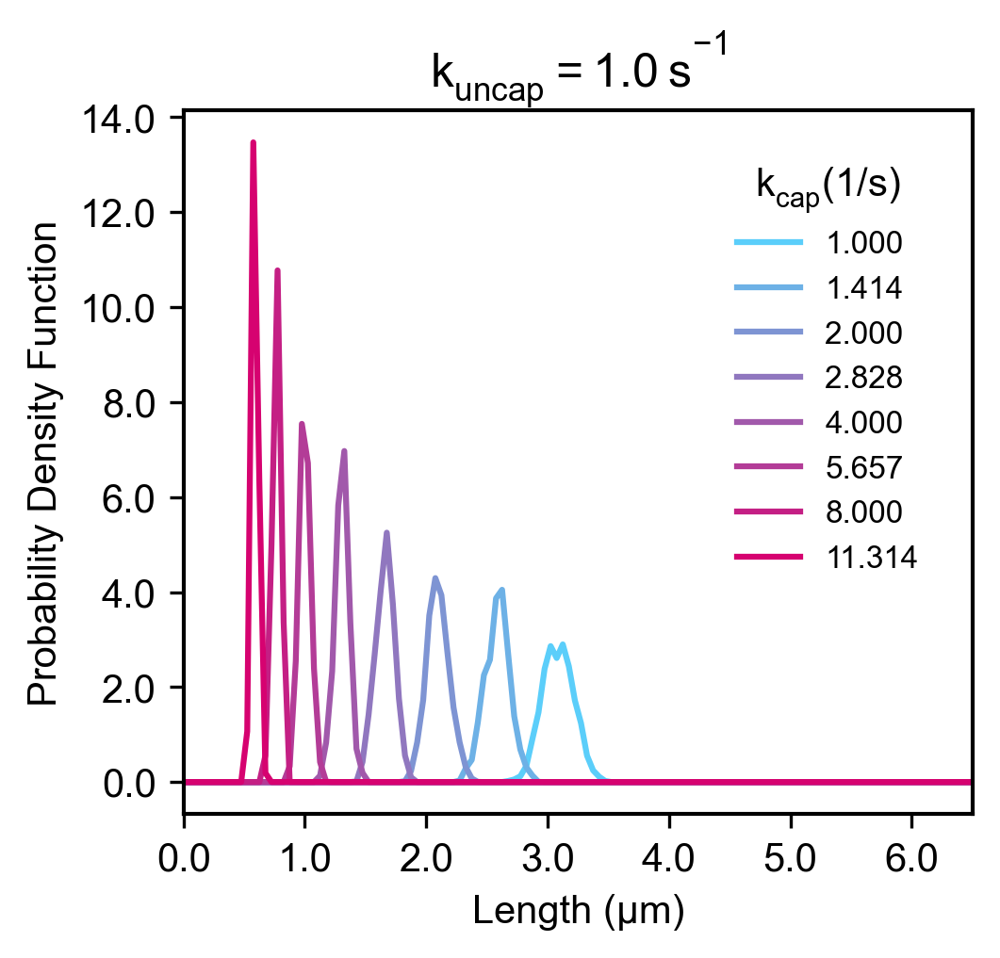

In [21]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
labelvec = ['100', '150', '200', '300', '400'] 
cappingratefinesweep = [2**0, 2**0.5, 2**1, 2**1.5, 2**2, 2**2.5, 2**3, 2**3.5]
kcapvec = [ '%.3f' % n for n in cappingratefinesweep ]

def colorFader(c1,c2,mix=0): # Linear interpolation from color c1 to color c2
    c1=np.array(mpl.colors.to_rgb(c1))
    c2=np.array(mpl.colors.to_rgb(c2))
    return mpl.colors.to_hex((1-mix)*c1 + mix*c2)

c1 = '#5BCEFA'
c2 = '#D60270'

color_indices = np.linspace(0, 1, len(kcapvec))
colorlist = []
for n in color_indices:
    colorlist.append(colorFader(c1,c2,n))

# Get figure
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows = nr, ncols = nc, figsize = (3.0, 3.0), 
                          dpi = 300, facecolor = 'w', edgecolor = 'k', sharex = False, sharey = False)

# Figure 4B
for plotcounter in range(0, nr):
    legcell = []
    for Rval in range(0, len(kcapvec)): 
        x = axvec.plot(Lengthvec, lengthList[Rval][0], color = colorlist[Rval])
        legcell.append(x[0]);

leg = fig.legend(legcell, kcapvec,title=r"$k_{cap} (1/s)$",ncol=1,fontsize=8,frameon=False,
                loc='upper right', bbox_to_anchor=(0.95, 0.85), labelspacing=0.5)
formatter = ticker.FormatStrFormatter(f'%.{1}f')
axvec.yaxis.set_major_formatter(formatter)
axvec.xaxis.set_major_formatter(formatter)
axvec.set_xticks([0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0])
axvec.set_xlim([0, 6.5])
axvec.set_xlabel('Length (µm)') 
axvec.set_yticks([0.0, 2.0, 4.0, 6.0, 8.0, 10.0, 12.0, 14.0])
axvec.set_ylabel('Probability Density Function') 
plt.title(r"$k_{uncap} = 1.0 \: s^{-1}$")

plt.subplots_adjust(left = 0.05,
                    right = 0.98,
                    bottom = 0.05, 
                    top = 0.88,
                    wspace = 0.25, 
                    hspace = 0.2)

# SAVE FIGURE
plt.savefig('Figure_4B.png', dpi = 300, bbox_inches = 'tight')
fig.savefig('Figure_4B.pdf', bbox_inches = 'tight')

## Figure 4C Data

In [22]:
# Load all replicates
# Take mean and std
# plot 5 rows 1 column plots
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

jobfoldername = 'inputfiles' 
cappingratefinesweep = [2**0, 2**0.5, 2**1, 2**1.5, 2**2, 2**2.5, 2**3, 2**3.5]
kcapvec = [ '%.3f' % n for n in cappingratefinesweep ]
kuncapvec = ['1.0']
Nreps = 10
ARList = []
MeanlistBarAR = []
StdlistBarAR = []
Nsnaps = 1
startpos = 601-Nsnaps
endpos = 601
dirpath = 'Figure_4'
for kcapiter, kcap in enumerate(kcapvec):
    for kuncapiter, kuncap in enumerate (kuncapvec):
        AspectRatio = []
        ARlist_tmp = []
        MeanBar = []
        Rval = kcapiter*len(kuncapvec)+kuncapiter+7
        for repid in range(0,Nreps):
            fvar = dirpath+'/outputfiles/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df = pd.read_csv(fvar,index_col=0)
            Timevec = df.iloc[0].to_numpy()
            a1 = df.iloc[1].to_numpy()
            a2 = df.iloc[2].to_numpy()
            a3 = df.iloc[3].to_numpy()
            AspectRatio_tmp = np.zeros(len(Timevec))
            for time in range(0,len(Timevec)):
                a = max(a1[time], a2[time], a3[time])
                c = min(a1[time], a2[time], a3[time])
                AspectRatio_tmp[time] = a/c
            AspectRatio.append(AspectRatio_tmp)
            ARlist_tmp.append(AspectRatio_tmp[startpos:endpos])
            MeanBar.append(AspectRatio_tmp[startpos:endpos])
            print('R_'+str(Rval)+'_r_'+str(repid))
            if repid == 0:
                print('Aspect Ratio at t=600s for Gallery Snapshot: ',AspectRatio_tmp[600])
            else:
                print('Aspect Ratio at t=600s for Replicate ' + str(repid) + ' : ',AspectRatio_tmp[600])
            print('---')
        AspectRatio = np.array(AspectRatio)
        ARList.append(np.array(ARlist_tmp).flatten())
        MeanlistBarAR.append(np.mean(MeanBar))
        StdlistBarAR.append(np.std(MeanBar))
        print('R_'+str(Rval)+' - Average Aspect Ratio at t=600s: ',np.mean(AspectRatio,0)[600])
        print('------------------')
Timevec = df.iloc[0].to_numpy()

R_7_r_0
Aspect Ratio at t=600s for Gallery Snapshot:  1.1738929904603899
---
R_7_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.3214231853323153
---
R_7_r_2
Aspect Ratio at t=600s for Replicate 2 :  1.3232345983551665
---
R_7_r_3
Aspect Ratio at t=600s for Replicate 3 :  1.0490599910645733
---
R_7_r_4
Aspect Ratio at t=600s for Replicate 4 :  1.2802024664046778
---
R_7_r_5
Aspect Ratio at t=600s for Replicate 5 :  1.268625831209538
---
R_7_r_6
Aspect Ratio at t=600s for Replicate 6 :  1.2932170272646493
---
R_7_r_7
Aspect Ratio at t=600s for Replicate 7 :  1.32232983057704
---
R_7_r_8
Aspect Ratio at t=600s for Replicate 8 :  1.264234900135989
---
R_7_r_9
Aspect Ratio at t=600s for Replicate 9 :  1.3094198318752703
---
R_7 - Average Aspect Ratio at t=600s:  1.2605640652679608
------------------
R_8_r_0
Aspect Ratio at t=600s for Gallery Snapshot:  1.1091161674406345
---
R_8_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.198876639617885
---
R_8_r_2
Aspect Ratio at t=600s for Replicate

## Plot Figure 4C

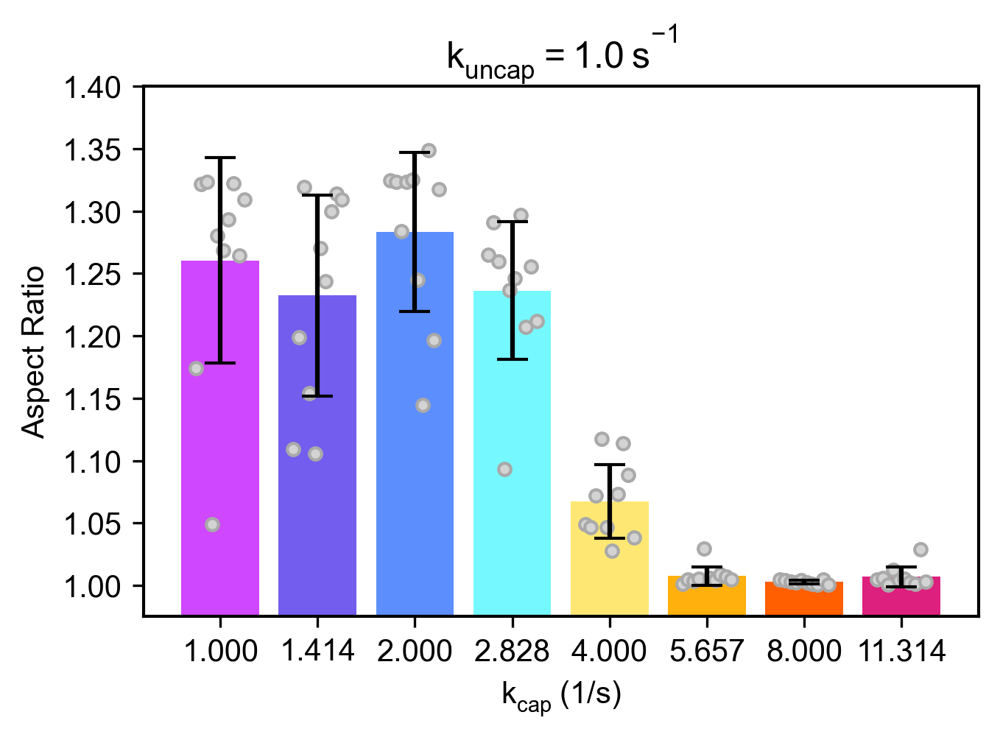

In [23]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#CF47FF', '#725DEF', '#5C8EFD', '#75F8FF', '#FEE873', '#FFB00D', '#FF5F01', '#DD207D']

# Figure Full
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(4.5,3), dpi=300, facecolor='w', edgecolor='k', sharex=False, sharey=False)
for plotcounter in range(0,nr):
    legcell = []
    meanvec = []
    stdvec = []
    for val in range(0, len(kcapvec)):
        Rval = plotcounter*len(kuncapvec)+val
        meanvec.append(MeanlistBarAR[Rval])
        stdvec.append(StdlistBarAR[Rval])
        for x in range(0, len(ARList[Rval])):
            w = 0.25
            axvec.plot(val - w + (x*2*w/(len(ARList[Rval])-1)), ARList[Rval][x], marker='o', markersize=4, color='lightgrey', markeredgecolor='darkgrey')
    axvec.bar(kcapvec, meanvec, yerr=stdvec, capsize=5, color=colorlist)
    axvec.set_ylabel('Aspect Ratio')
    axvec.set_xlabel(r"$k_{cap} \: (1/s)$")
    axvec.set_ylim(0.975,1.4)
    axvec.set_yticks([1.0,1.05,1.1,1.15,1.2,1.25,1.3,1.35,1.4]) 
    
plt.title(r"$k_{uncap} = 1.0 \: s^{-1}$")
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.6, 
                    hspace=0.4)
plt.savefig('Figure_4C.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_4C.pdf', dpi=300, bbox_inches='tight')

## Figure 4E-F Data

In [24]:
def getARdata(sheetname, columnlist, condlist, Ntrials):
    # Path to Excel data
    datafile = 'Source_Data_Fig_4.xlsx'
    # Read Excel file with multiple sheets
    xlsx = pd.read_excel(datafile, sheet_name=['Fig 4E', 'Fig 4F'])
    dataframedict = {}
    Ncond = len(condlist)
    ARData = []
    ARFrac = np.zeros((Ntrials, Ncond))
    ARAvg = np.zeros((Ntrials, Ncond))
    for cond in range(0, Ncond):
        df = xlsx[sheetname]
        df.columns = df.iloc[1]
        df = df[2:]
        df = df.reset_index(drop=True)
        ARData_Reps = []
        colstart = columnlist[cond]
        for trial in range(0, Ntrials):
            col = colstart + trial
            CapZData = df.iloc[:, col]
            CapZData = pd.to_numeric(CapZData, errors='coerce')
            CapZData = CapZData.dropna()
            CapZData = CapZData.loc[CapZData >= 1]
            df_name = f'CapZ_{condlist[cond]}_AR{trial+1}'
            dataframedict[df_name] = CapZData
            # Calculate fraction of condensates with AR > 1.2
            Count = sum(1 for AR in CapZData if AR > 1.2)
            ARFrac[trial, cond] = Count/len(CapZData)
            # Calculate average aspect ratio
            ARAvg[trial, cond] = np.mean(CapZData)
            ARData_Reps.extend(CapZData)
        ARData.append(ARData_Reps)
    return dataframedict, ARFrac, ARAvg, ARData

## Plot Figure 4E

  conc1 conc2  t_statistic   p_value
0   0.0   0.5     1.141559  0.317335
1   0.0   1.0     3.768179  0.019635
2   0.0   2.0     3.905715  0.017457
3   0.5   1.0     1.412405  0.230692
4   0.5   2.0     2.055156  0.109050
5   1.0   2.0     1.588627  0.187343
3.7399999999999998 0.01
3.7399999999999998 0.01


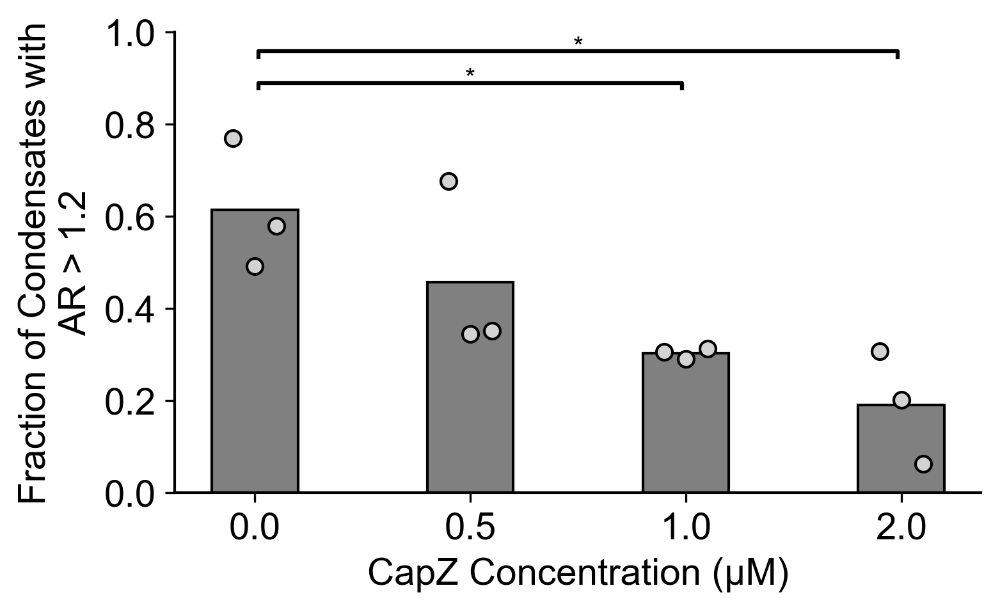

In [25]:
# Get Data
sheetname = 'Fig 4E'
columnlist = [0, 4, 8, 12]
condlist = ['00', '05', '10', '20']
Ntrials = 3
dataframedict, ARFrac, ARAvg, ARData = getARdata(sheetname, columnlist, condlist, Ntrials)

plt.rcParams.update({'font.size': 14, 'font.family':'arial', 'font.weight':'normal'})
conclist = ['0.0', '0.5', '1.0', '2.0']
bar_width = 0.4

# Figure Full
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(5,3), dpi=300, facecolor='w', edgecolor='k', sharex=False, sharey=False)
for plotcounter in range(0,nr):
    legcell = []
    concvec = []
    pointsvec = []
    meanvec = []
    stdvec = []
    t_test = []
    for cond in range(0, len(conclist)):
        concvec.append([conclist[cond], conclist[cond], conclist[cond]])
        pointsvec.append(ARFrac[:, cond])
        meanvec.append(np.mean(ARFrac[:, cond]))
        stdvec.append(np.std(ARFrac[:, cond]))
    axvec.bar(conclist, meanvec, width=bar_width, capsize=5, color='grey', edgecolor='black', linewidth=1)
    axvec.spines[['right', 'top']].set_visible(False)
    for cond in range(0, len(conclist)):
        x_jitter_means = [cond-0.1, cond, cond+0.1]
        axvec.plot(x_jitter_means, pointsvec[cond], marker='o', linewidth=0.0, color='lightgrey', alpha=1.0, markeredgecolor='black')
        for cond2 in range(0, len(conclist)):
            if cond < cond2:
                t_statistic, p_value = stats.ttest_ind(a=pointsvec[cond], b=pointsvec[cond2], equal_var=True)
                t_test_tmp = {'conc1': conclist[cond], 'conc2': conclist[cond2], 't_statistic': t_statistic, 'p_value': p_value}
                t_test.append(t_test_tmp)
            else:
                continue
    df = pd.DataFrame(t_test)
    print(df)
    df_annotations = df.drop(columns=['t_statistic'])
    annotations = list(df_annotations.itertuples(index=False, name=None))
    starbars.draw_annotation(annotations, ns_show=False, bar_gap=0.0, text_distance=0.01, h_gap=0.01, top_margin=0.03, tip_length=0.015)
    axvec.set_ylabel('Fraction of Condensates with\nAR > 1.2')
    axvec.set_xlabel('CapZ Concentration (µM)')
    axvec.set_ylim(0.0, 1.0)

plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.6, 
                    hspace=0.4)
plt.savefig('Figure_4E.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_4E.pdf', dpi=300, bbox_inches='tight')

## Plot Figure 4F

  conc1 conc2  t_statistic   p_value
0   0.0   0.5     3.759936  0.019776
1   0.0   1.0     3.965143  0.016606
2   0.0   2.0     4.087433  0.015007
3   0.5   1.0     1.873083  0.134351
4   0.5   2.0     2.770469  0.050307
5   1.0   2.0     2.230505  0.089561
3.7399999999999998 0.01
3.7399999999999998 0.01
3.7399999999999998 0.01


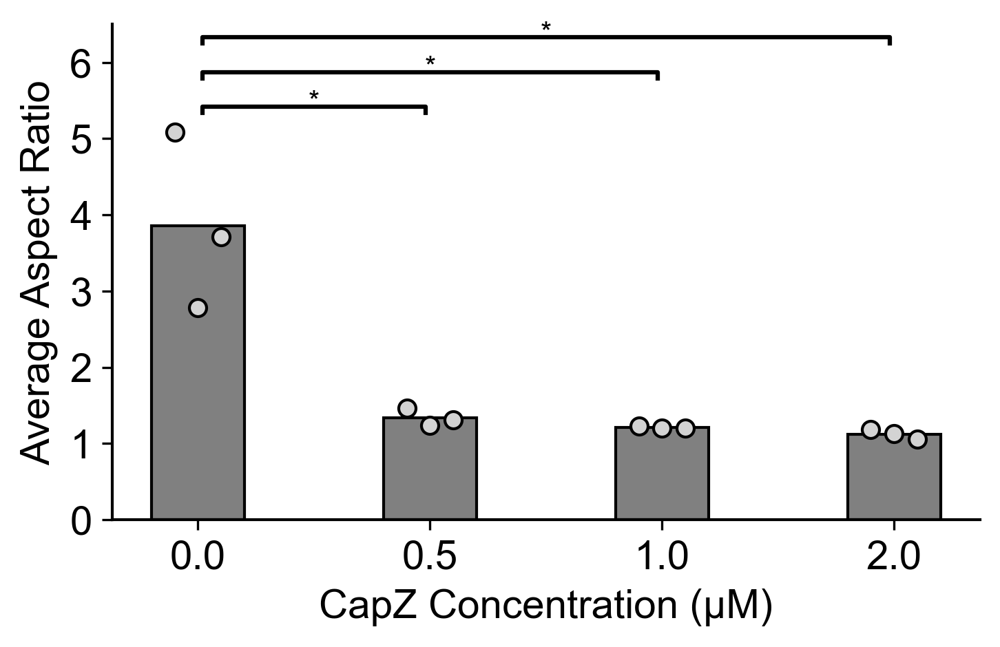

In [26]:
# Get Data
sheetname = 'Fig 4F'
columnlist = [0, 4, 8, 12]
condlist = ['00', '05', '10', '20']
Ntrials = 3
dataframedict, ARFrac, ARAvg, ARData = getARdata(sheetname, columnlist, condlist, Ntrials)

plt.rcParams.update({'font.size': 14, 'font.family':'arial', 'font.weight':'normal'})
conclist = ['0.0', '0.5', '1.0', '2.0']
bar_width = 0.4

# Figure Full
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(5,3), dpi=300, facecolor='w', edgecolor='k', sharex=False, sharey=False)
for plotcounter in range(0,nr):
    legcell = []
    concvec = []
    pointsvec = []
    meanvec = []
    stdvec = []
    t_test = []
    for cond in range(0, len(conclist)):
        concvec.append([conclist[cond], conclist[cond], conclist[cond]])
        pointsvec.append(ARAvg[:, cond])
        meanvec.append(np.mean(ARAvg[:, cond]))
        stdvec.append(np.std(ARAvg[:, cond]))
    axvec.bar(conclist, meanvec, width=bar_width, capsize=5, color='grey', edgecolor='black', linewidth=1)
    axvec.spines[['right', 'top']].set_visible(False)
    for cond in range(0, len(conclist)):
        x_jitter_means = [cond-0.1, cond, cond+0.1]
        axvec.plot(x_jitter_means, pointsvec[cond], marker='o', linewidth=0.0, color='lightgrey', alpha=1.0, markeredgecolor='black')
        for cond2 in range(0, len(conclist)):
            if cond < cond2:
                t_statistic, p_value = stats.ttest_ind(a=pointsvec[cond], b=pointsvec[cond2], equal_var=True)
                t_test_tmp = {'conc1': conclist[cond], 'conc2': conclist[cond2], 't_statistic': t_statistic, 'p_value': p_value}
                t_test.append(t_test_tmp)
            else:
                continue
    df = pd.DataFrame(t_test)
    print(df)
    df_annotations = df.drop(columns=['t_statistic'])
    annotations = list(df_annotations.itertuples(index=False, name=None))
    starbars.draw_annotation(annotations, ns_show=False, ax=axvec, bar_gap=0.0, text_distance=0.01, h_gap=0.01, top_margin=0.03, tip_length=0.015)
    axvec.set_ylabel('Average Aspect Ratio')
    axvec.set_xlabel('CapZ Concentration (µM)')
    axvec.set_ylim(0.0, 6.5)
    axvec.set_yticks([0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0])

plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.6, 
                    hspace=0.4)
plt.savefig('Figure_4F.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_4F.pdf', dpi=300, bbox_inches='tight')

# Figure 5

## Figure 5A-C Data

In [27]:
# Load all replicates
# Take mean and std
# plot 5 rows 1 column plots
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

jobfoldername = 'inputfiles' 
kbindvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
kunbindvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
Nreps = 10
MeanlistAR = []
StdlistAR = []

dirpath = 'Figure_5/Figure_5A-C'
for koniter, kbind in enumerate(kbindvec):
    for koffiter, kunbind in enumerate (kunbindvec):
        AspectRatio = []
        Rval = koniter*len(kunbindvec)+koffiter
        for repid in range(0,Nreps):
            fvar = dirpath+'/outputfiles/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df = pd.read_csv(fvar,index_col=0)
            Timevec = df.iloc[0].to_numpy()
            a1 = df.iloc[1].to_numpy()
            a2 = df.iloc[2].to_numpy()
            a3 = df.iloc[3].to_numpy()
            AspectRatio_tmp = np.zeros(len(Timevec))
            for time in range(0,len(Timevec)):
                a = max(a1[time], a2[time], a3[time])
                c = min(a1[time], a2[time], a3[time])
                AspectRatio_tmp[time] = a/c
            AspectRatio.append(AspectRatio_tmp)
            print('R_'+str(Rval)+'_r_'+str(repid))
            print('Aspect Ratio at t=600s for Replicate ' + str(repid) + ' : ',AspectRatio_tmp[600])
            print('---')
        AspectRatio = np.array(AspectRatio)
        MeanlistAR.append(np.mean(AspectRatio,0))
        StdlistAR.append(np.std(AspectRatio,0))
        print('R_'+str(Rval)+' - Average Aspect Ratio at t=600s: ',np.mean(AspectRatio,0)[600])
        print('------------------')
Timevec = df.iloc[0].to_numpy()

R_0_r_0
Aspect Ratio at t=600s for Replicate 0 :  1.380421088148057
---
R_0_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.3383183230471993
---
R_0_r_2
Aspect Ratio at t=600s for Replicate 2 :  1.2790855233612168
---
R_0_r_3
Aspect Ratio at t=600s for Replicate 3 :  1.3424118325315098
---
R_0_r_4
Aspect Ratio at t=600s for Replicate 4 :  1.3160403719389437
---
R_0_r_5
Aspect Ratio at t=600s for Replicate 5 :  1.3289620489250804
---
R_0_r_6
Aspect Ratio at t=600s for Replicate 6 :  1.3758843951218065
---
R_0_r_7
Aspect Ratio at t=600s for Replicate 7 :  1.2727850912499814
---
R_0_r_8
Aspect Ratio at t=600s for Replicate 8 :  1.3605997668978205
---
R_0_r_9
Aspect Ratio at t=600s for Replicate 9 :  1.326604288360587
---
R_0 - Average Aspect Ratio at t=600s:  1.3321112729582203
------------------
R_1_r_0
Aspect Ratio at t=600s for Replicate 0 :  1.4195921938008187
---
R_1_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.3759709887165508
---
R_1_r_2
Aspect Ratio at t=600s for Replicate 2 : 

## Plot Figure 5A

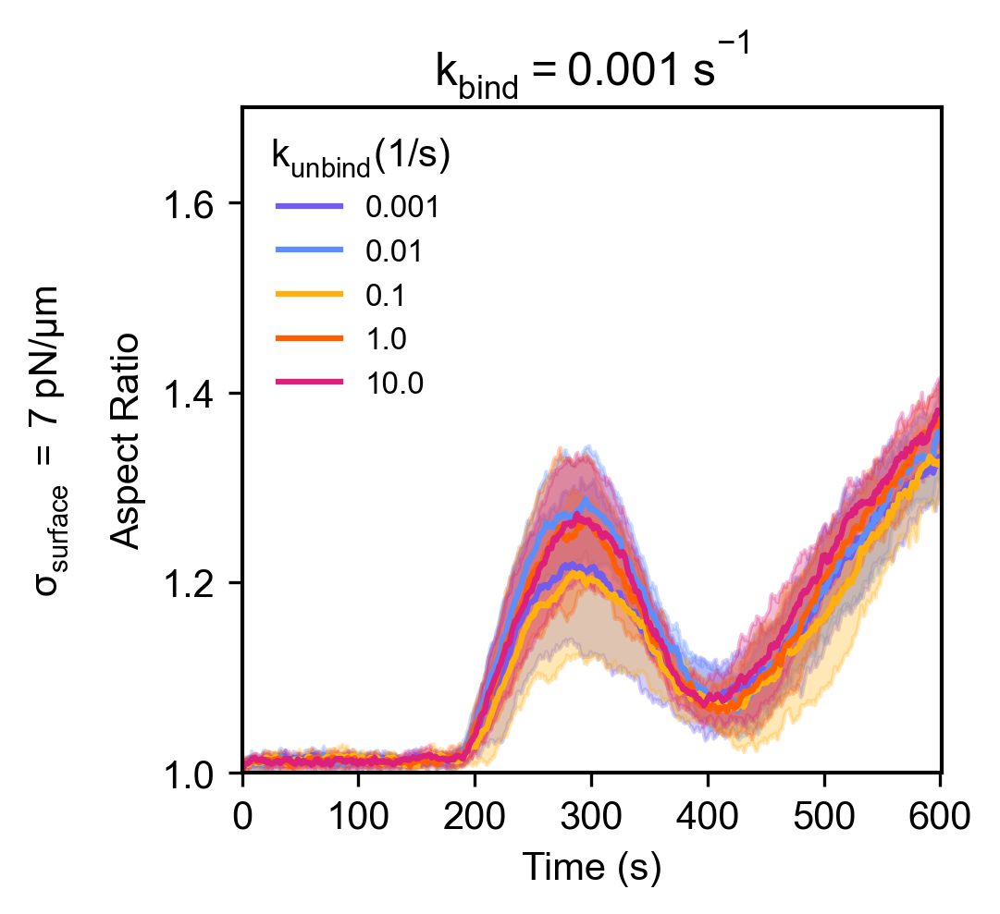

In [28]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']
cond = 0 # kbind = 0.001

# Aspect Ratio Figure
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
for plotcounter in range(0,nr):
    legcell = []
    for val in range(0,5):
        Rval = cond*len(kunbindvec) + val
        x = axvec.plot(Timevec,MeanlistAR[Rval],color=colorlist[val])
        legcell.append(x[0]);
        axvec.fill_between(Timevec,MeanlistAR[Rval]-StdlistAR[Rval],MeanlistAR[Rval]+StdlistAR[Rval],color=colorlist[val],alpha=0.3)
axvec.set_xlabel('Time (s)') 
axvec.set_ylabel('Aspect Ratio') 
axvec.set_xlim([0,601]) 
axvec.set_ylim([1.0,1.7])
axvec.set_yticks([1.0,1.2,1.4,1.6])
axvec.set_xticks([0,100,200,300,400,500,600]) 
leg = fig.legend(legcell, kunbindvec,title=r"$k_{unbind} (1/s)$",ncol=1,fontsize=8,frameon=False,
                loc='upper left', bbox_to_anchor=(0.15, 0.9), labelspacing=0.5)
plt.title(r"$k_{bind} = 0.001 \: s^{-1}$")
plt.text(-0.275, 0.5, r"$\sigma_{surface} \: = \: 7 \: pN/µm$", horizontalalignment='center', verticalalignment='center', transform=axvec.transAxes, rotation=90)
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_5A.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_5A.pdf', dpi=300, bbox_inches='tight')

## Plot Figure 5B

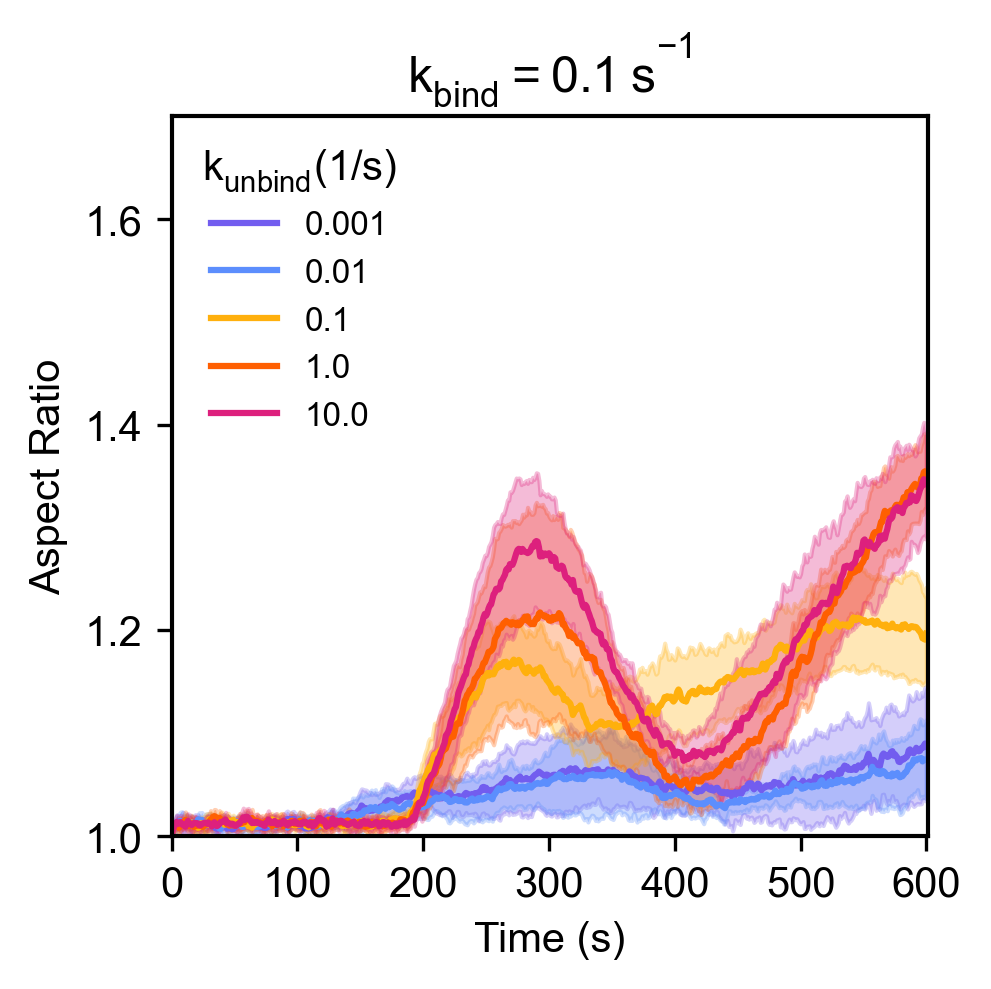

In [29]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']
cond = 2 # kbind = 0.1

# Aspect Ratio Figure
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
for plotcounter in range(0,nr):
    legcell = []
    for val in range(0,5):
        Rval = cond*len(kunbindvec) + val
        x = axvec.plot(Timevec,MeanlistAR[Rval],color=colorlist[val])
        legcell.append(x[0]);
        axvec.fill_between(Timevec,MeanlistAR[Rval]-StdlistAR[Rval],MeanlistAR[Rval]+StdlistAR[Rval],color=colorlist[val],alpha=0.3)
axvec.set_xlabel('Time (s)') 
axvec.set_ylabel('Aspect Ratio') 
axvec.set_xlim([0,601]) 
axvec.set_ylim([1.0,1.7])
axvec.set_yticks([1.0,1.2,1.4,1.6])
axvec.set_xticks([0,100,200,300,400,500,600]) 
leg = fig.legend(legcell, kunbindvec,title=r"$k_{unbind} (1/s)$",ncol=1,fontsize=8,frameon=False,
                loc='upper left', bbox_to_anchor=(0.15, 0.9), labelspacing=0.5)
plt.title(r"$k_{bind} = 0.1 \: s^{-1}$")
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_5B.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_5B.pdf', dpi=300, bbox_inches='tight')

## Plot Figure 5C

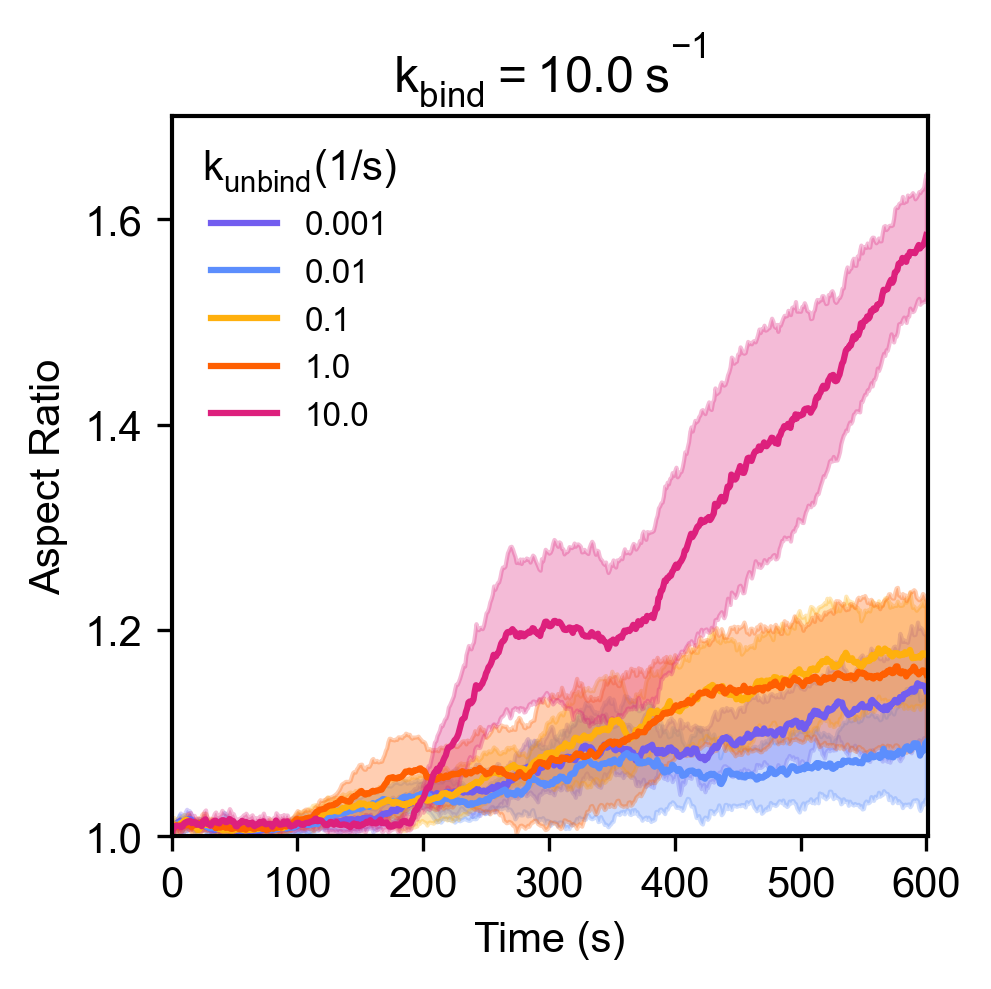

In [30]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']
cond = 4 # kbind = 10.0

# Aspect Ratio Figure
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
for plotcounter in range(0,nr):
    legcell = []
    for val in range(0,5):
        Rval = cond*len(kunbindvec) + val
        x = axvec.plot(Timevec,MeanlistAR[Rval],color=colorlist[val])
        legcell.append(x[0]);
        axvec.fill_between(Timevec,MeanlistAR[Rval]-StdlistAR[Rval],MeanlistAR[Rval]+StdlistAR[Rval],color=colorlist[val],alpha=0.3)
axvec.set_xlabel('Time (s)') 
axvec.set_ylabel('Aspect Ratio') 
axvec.set_xlim([0,601]) 
axvec.set_ylim([1.0,1.7])
axvec.set_yticks([1.0,1.2,1.4,1.6])
axvec.set_xticks([0,100,200,300,400,500,600]) 
leg = fig.legend(legcell, kunbindvec,title=r"$k_{unbind} (1/s)$",ncol=1,fontsize=8,frameon=False,
                loc='upper left', bbox_to_anchor=(0.15, 0.9), labelspacing=0.5)
plt.title(r"$k_{bind} = 10.0 \: s^{-1}$")
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_5C.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_5C.pdf', dpi=300, bbox_inches='tight')

## Figure 5D-F Data

In [31]:
# Load all replicates
# Take mean and std
# plot 5 rows 1 column plots
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

jobfoldername = 'inputfiles' 
kbindvec =[1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
kunbindvec =[1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
Nreps = 10
MeanlistAR = []
StdlistAR = []

dirpath = 'Figure_5/Figure_5D-F'
for koniter, kbind in enumerate(kbindvec):
    for koffiter, kunbind in enumerate (kunbindvec):
        AspectRatio = []
        Rval = koniter*len(kunbindvec)+koffiter
        for repid in range(0,Nreps):
            fvar = dirpath+'/outputfiles/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df = pd.read_csv(fvar,index_col=0)
            Timevec = df.iloc[0].to_numpy()
            a1 = df.iloc[1].to_numpy()
            a2 = df.iloc[2].to_numpy()
            a3 = df.iloc[3].to_numpy()
            AspectRatio_tmp = np.zeros(len(Timevec))
            for time in range(0,len(Timevec)):
                a = max(a1[time], a2[time], a3[time])
                c = min(a1[time], a2[time], a3[time])
                AspectRatio_tmp[time] = a/c
            AspectRatio.append(AspectRatio_tmp)
            print('R_'+str(Rval)+'_r_'+str(repid))
            print('Aspect Ratio at t=600s for Replicate ' + str(repid) + ' : ',AspectRatio_tmp[600])
            print('---')
        AspectRatio = np.array(AspectRatio)
        MeanlistAR.append(np.mean(AspectRatio,0))
        StdlistAR.append(np.std(AspectRatio,0))
        print('R_'+str(Rval)+' - Average Aspect Ratio at t=600s: ',np.mean(AspectRatio,0)[600])
        print('------------------')
Timevec = df.iloc[0].to_numpy() 

R_0_r_0
Aspect Ratio at t=600s for Replicate 0 :  6.249680713913633
---
R_0_r_1
Aspect Ratio at t=600s for Replicate 1 :  6.067307745063434
---
R_0_r_2
Aspect Ratio at t=600s for Replicate 2 :  5.532458835083586
---
R_0_r_3
Aspect Ratio at t=600s for Replicate 3 :  2.310024774125617
---
R_0_r_4
Aspect Ratio at t=600s for Replicate 4 :  6.627865085751403
---
R_0_r_5
Aspect Ratio at t=600s for Replicate 5 :  1.9231436891456326
---
R_0_r_6
Aspect Ratio at t=600s for Replicate 6 :  6.891158602161448
---
R_0_r_7
Aspect Ratio at t=600s for Replicate 7 :  5.330127784514329
---
R_0_r_8
Aspect Ratio at t=600s for Replicate 8 :  2.3574825135428714
---
R_0_r_9
Aspect Ratio at t=600s for Replicate 9 :  2.055349851200775
---
R_0 - Average Aspect Ratio at t=600s:  4.534459959450272
------------------
R_1_r_0
Aspect Ratio at t=600s for Replicate 0 :  5.345878791590478
---
R_1_r_1
Aspect Ratio at t=600s for Replicate 1 :  5.463419477109583
---
R_1_r_2
Aspect Ratio at t=600s for Replicate 2 :  5.423520

## Plot Figure 5D

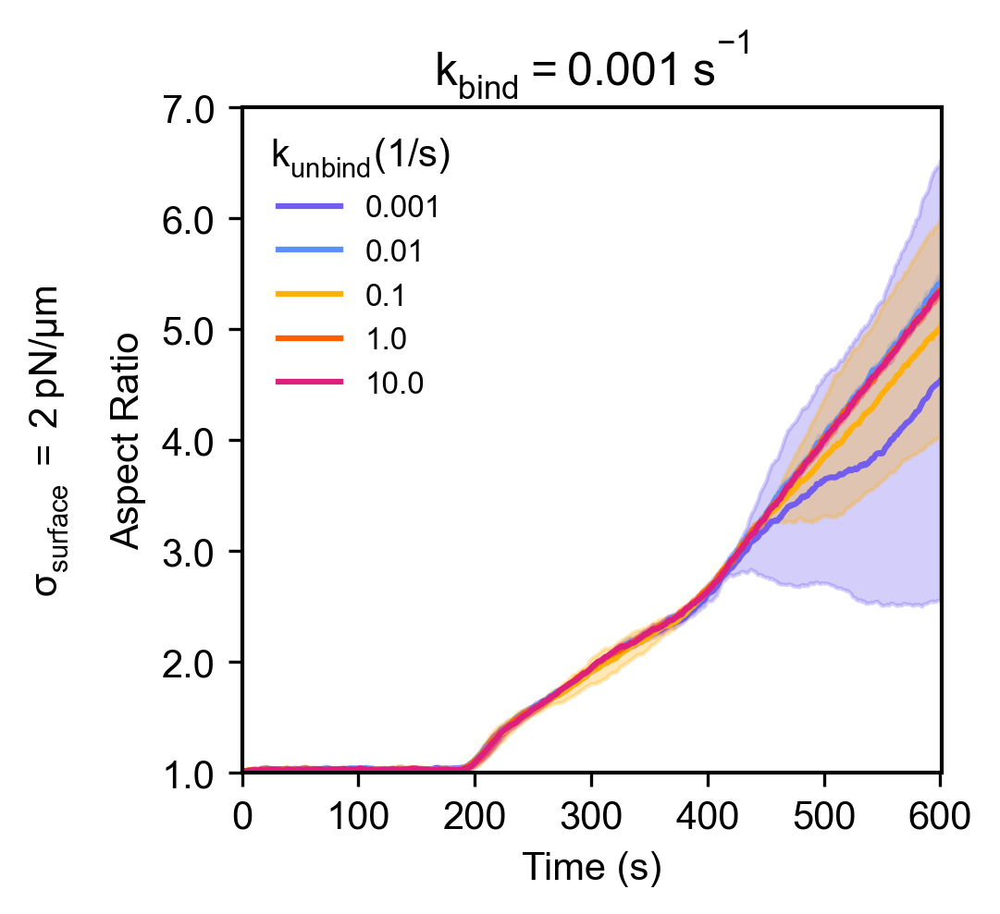

In [32]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']
cond = 0 # kbind = 0.001

# Aspect Ratio Figure
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
for plotcounter in range(0,nr):
    legcell = []
    for val in range(0,5):
        Rval = cond*len(kunbindvec) + val
        x = axvec.plot(Timevec,MeanlistAR[Rval],color=colorlist[val])
        legcell.append(x[0]);
        axvec.fill_between(Timevec,MeanlistAR[Rval]-StdlistAR[Rval],MeanlistAR[Rval]+StdlistAR[Rval],color=colorlist[val],alpha=0.3)
axvec.set_xlabel('Time (s)') 
axvec.set_ylabel('Aspect Ratio') 
axvec.set_xlim([0,601]) 
axvec.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
axvec.set_yticks([1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0])
axvec.set_ylim([1.0,7.0])
axvec.set_xticks([0,100,200,300,400,500,600]) 
leg = fig.legend(legcell, kunbindvec,title=r"$k_{unbind} (1/s)$",ncol=1,fontsize=8,frameon=False,
                loc='upper left', bbox_to_anchor=(0.15, 0.9), labelspacing=0.5)
plt.title(r"$k_{bind} = 0.001 \: s^{-1}$")
plt.text(-0.275, 0.5, r"$\sigma_{surface} \: = \: 2 \: pN/µm$", horizontalalignment='center', verticalalignment='center', transform=axvec.transAxes, rotation=90)
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_5D.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_5D.pdf', dpi=300, bbox_inches='tight')

## Plot Figure 5E

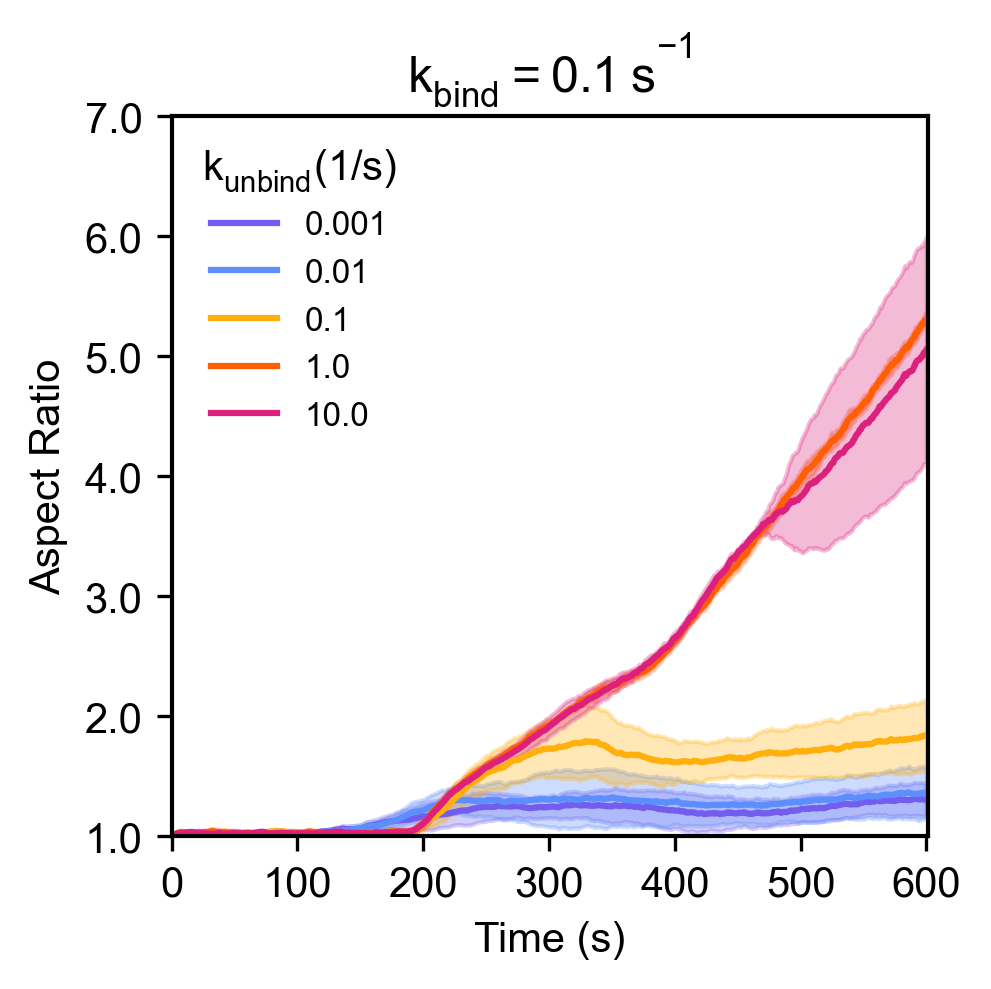

In [33]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']
cond = 2 # kbind = 0.1

# Aspect Ratio Figure
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
for plotcounter in range(0,nr):
    legcell = []
    for val in range(0,5):
        Rval = cond*len(kunbindvec) + val
        x = axvec.plot(Timevec,MeanlistAR[Rval],color=colorlist[val])
        legcell.append(x[0]);
        axvec.fill_between(Timevec,MeanlistAR[Rval]-StdlistAR[Rval],MeanlistAR[Rval]+StdlistAR[Rval],color=colorlist[val],alpha=0.3)
axvec.set_xlabel('Time (s)') 
axvec.set_ylabel('Aspect Ratio') 
axvec.set_xlim([0,601]) 
axvec.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
axvec.set_yticks([1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0])
axvec.set_ylim([1.0,7.0])
axvec.set_xticks([0,100,200,300,400,500,600]) 
leg = fig.legend(legcell, kunbindvec,title=r"$k_{unbind} (1/s)$",ncol=1,fontsize=8,frameon=False,
                loc='upper left', bbox_to_anchor=(0.15, 0.9), labelspacing=0.5)
plt.title(r"$k_{bind} = 0.1 \: s^{-1}$")
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_5E.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_5E.pdf', dpi=300, bbox_inches='tight')

## Plot Figure 5F

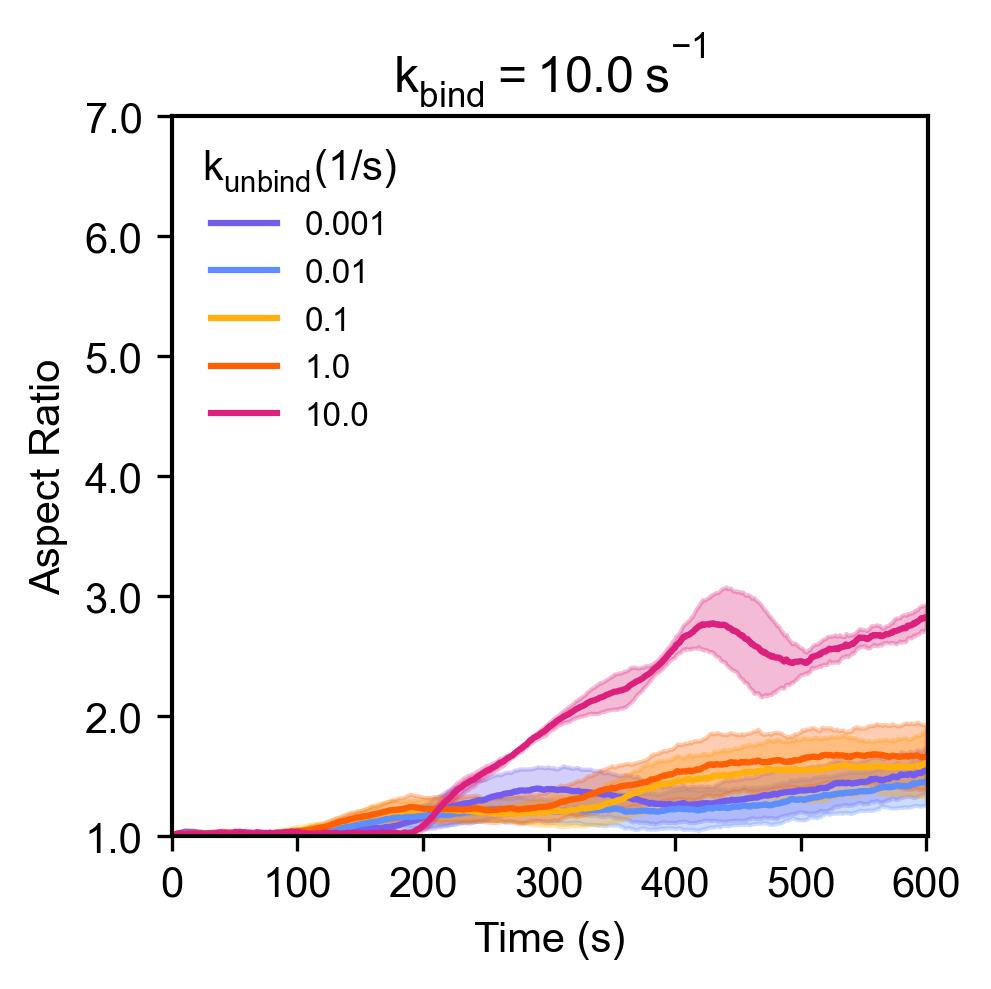

In [34]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']
cond = 4 # kbind = 10.0

# Aspect Ratio Figure
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
for plotcounter in range(0,nr):
    legcell = []
    for val in range(0,5):
        Rval = cond*len(kunbindvec) + val
        x = axvec.plot(Timevec,MeanlistAR[Rval],color=colorlist[val])
        legcell.append(x[0]);
        axvec.fill_between(Timevec,MeanlistAR[Rval]-StdlistAR[Rval],MeanlistAR[Rval]+StdlistAR[Rval],color=colorlist[val],alpha=0.3)
axvec.set_xlabel('Time (s)') 
axvec.set_ylabel('Aspect Ratio') 
axvec.set_xlim([0,601]) 
axvec.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
axvec.set_yticks([1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0])
axvec.set_ylim([1.0,7.0])
axvec.set_xticks([0,100,200,300,400,500,600]) 
leg = fig.legend(legcell, kunbindvec,title=r"$k_{unbind} (1/s)$",ncol=1,fontsize=8,frameon=False,
                loc='upper left', bbox_to_anchor=(0.15, 0.9), labelspacing=0.5)
plt.title(r"$k_{bind} = 10.0 \: s^{-1}$")
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_5F.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_5F.pdf', dpi=300, bbox_inches='tight')

# Figure 6

## Figure 6B Data

In [35]:
# Assemble data for figure

# Load all replicates
# Take mean and std
# plot 5 rows 1 column plots
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

# Define power law equation
def power_law(x, a, b):
    return a * np.power(x, b)

jobfoldername = 'inputfiles' 
Diameter = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
Nfil = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100]
nTension = [str(2), str(4), str(8)]
lowerAR = 1.5
upperAR = 2.0
Nreps = 10
Dfitdata = []
Nfitdata = []
tensionARfit = []
adata = []
bdata = []
r2data = []

dirpath = 'Figure_6/Figure_6B'
for teniter, tension in enumerate(nTension):
    fitDataAR = []
    for Nfiliter in range (0, len(Nfil)):
        for diter in range (0, len(Diameter)):
            abc = []
            Rval = diter + 8*Nfiliter
            for repid in range(0, Nreps):
                fvar = dirpath+'/outputfiles_tension_'+tension+'/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
                df = pd.read_csv(fvar,index_col=0)
                Timevec = df.iloc[0].to_numpy()
                a1 = df.iloc[1].to_numpy()
                a2 = df.iloc[2].to_numpy()
                a3 = df.iloc[3].to_numpy()
                AspectRatio = np.zeros(len(Timevec))
                for time in range(0, len(Timevec)):
                    abc_tmp = np.array([a1[time],a2[time],a3[time]])
                    abc = np.sort(abc_tmp)
                    a = abc[2]
                    b = abc[1]
                    c = abc[0]
                    AspectRatio[time] = a/c
                if AspectRatio[600] >= lowerAR  and AspectRatio[600] <= upperAR:
                    fitDataAR.append([Rval, repid, Nfil[Nfiliter], Diameter[diter], AspectRatio[600]])
                print('R_'+str(Rval)+'_r_'+str(repid))
                print('---')

    fitdf = pd.DataFrame(fitDataAR, columns =  ["Rval", "Replicate", "Nfil", "Diameter", "AspectRatio"])
    fitdf = fitdf.groupby("Diameter").filter(lambda x: len(x) >= 10)
    Dfitdata_tmp = fitdf["Diameter"]
    Dfitdata.append(Dfitdata_tmp)
    Nfitdata_tmp = fitdf["Nfil"]
    Nfitdata.append(Nfitdata_tmp)
    Diameter_Fit = np.linspace(0, 4.5, 451)

    params, pcov, infodict, _, _ = opt.curve_fit(power_law, Dfitdata_tmp, Nfitdata_tmp, full_output=True)
    a, b = params
    adata.append(a)
    bdata.append(b)
        
    fvec = infodict['fvec']
    r2 = 1 - (np.sum(np.square(fvec)))/(np.sum(np.square(Nfitdata_tmp - np.mean(Nfitdata_tmp))))
    r2data.append(r2)
    tensionARfit_tmp = a * Diameter_Fit**b
    tensionARfit.append(tensionARfit_tmp)


R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
R_8_r_0
---
R_8_r_1
---
R_8_r_2
---
R_8_r_3
---
R_8_r_4
---
R_8_r_5
---
R_8_r_6
---
R_8_r_7
---
R_8_r_8
---
R_8_r_9
---
R_9_r_0
---
R_9_r_1
---
R_9_r_2
---
R_9_r_3
---
R_9_r_4
---
R_9_r_5
---
R_9_r_6
---
R_9_r_7
---
R_9_r_8
---
R_9_r_9
---
R_10_r_0
---
R_10_r_1
---
R_10_r_2
---
R

## Plot Figure 6B

Surface Tension =  2
Number of Replicates:  10
Number of Data Points:  103
Power Fit:  y = 1.0768x^(4.7821)
R2:  0.9377108020319604
------------------
Surface Tension =  4
Number of Replicates:  10
Number of Data Points:  104
Power Fit:  y = 3.7330x^(3.5521)
R2:  0.9439826745475208
------------------
Surface Tension =  8
Number of Replicates:  10
Number of Data Points:  173
Power Fit:  y = 9.3357x^(2.9735)
R2:  0.7471958792974833
------------------


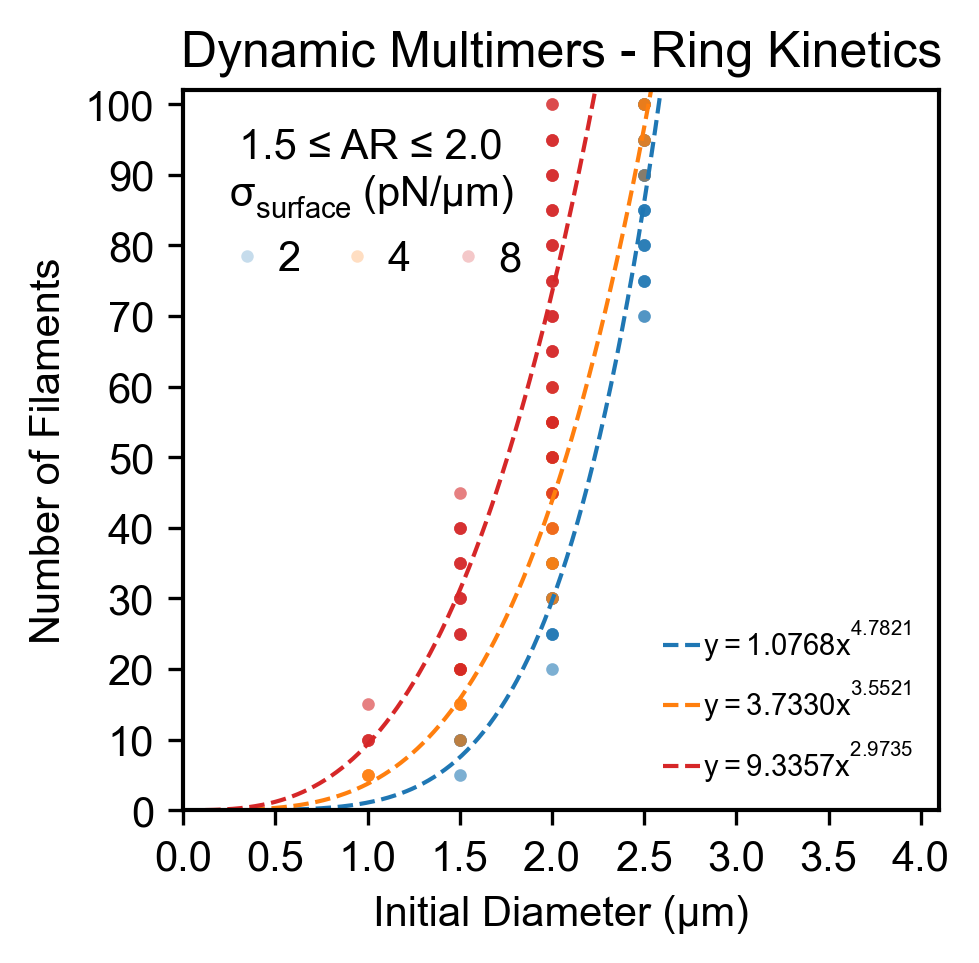

In [36]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['tab:blue', 'tab:orange', 'tab:red']

# Figure
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
for plotcounter in range(0,nr):
    legcell1 = []
    for teniter in range(0, len(nTension)):
        x1=axvec.plot(Dfitdata[teniter],Nfitdata[teniter],marker='.',linewidth=0.0,color=colorlist[teniter],alpha=0.25,markeredgecolor='none', label=f"${nTension[teniter]}$")
        legcell1.append(x1[0]);
    legcell2 = []
    for teniter in range(0, len(nTension)):
        x2=axvec.plot(Diameter_Fit,tensionARfit[teniter],linewidth=1.0,linestyle='dashed',color=colorlist[teniter],alpha=1.0, label=f"$y = {adata[teniter]:.4f} x^{{ {bdata[teniter]:.4f} }}$")
        legcell2.append(x2[0]);
        print("Surface Tension = ",  nTension[teniter])
        print('Number of Replicates: ', Nreps)
        print('Number of Data Points: ', len(Nfitdata[teniter]))
        print('Power Fit: ', f"y = {adata[teniter]:.4f}x^({bdata[teniter]:.4f})")
        print('R2: ', r2data[teniter])
        print('------------------')
axvec.set_xlabel(r"Initial Diameter (µm)")
axvec.set_xlim([0,4.1]) 
axvec.set_ylabel(r"Number of Filaments") 
axvec.set_ylim([0,102]) 

axvec.set_yticks([0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]) 
axvec.set_xticks([0.0,0.5,1,1.5,2,2.5,3,3.5,4]) 

leg1 = fig.legend(handles=legcell1, title = str(lowerAR) + r" ≤ AR ≤ " + str(upperAR) + '\n' + r"$\sigma_{surface} \: (pN/\mu m)$",ncol=3,fontsize=10.0,frameon=False,
                loc='upper left', bbox_to_anchor=(0.15, 0.9), labelspacing=0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)
plt.setp(leg1.get_title(), ha ='center')
leg2 = plt.legend(handles=legcell2, loc='lower right', ncol=1,fontsize=7.0, frameon=False, 
                labelspacing=0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)

plt.title('Dynamic Multimers - Ring Kinetics')
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
    
plt.savefig('Figure_6B.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_6B.pdf', dpi=300, bbox_inches='tight')

## Figure 6D Data

In [37]:
# Path to Excel data
datafile = 'Source_Data_Fig_6.xlsx'
# Read Excel file with multiple sheets
xlsx = pd.read_excel(datafile, sheet_name=['Fig 6D'])

df = xlsx['Fig 6D']
df.columns = df.iloc[0]

df = df.reset_index(drop=True)
mini_Lpd = df.iloc[:, [0, 1]]
mini_Lpd = mini_Lpd.dropna()

def power_law(x, a, b):
    return a * np.power(x, b)

Diameter = np.array(mini_Lpd.iloc[:, 0])
Diameter = Diameter.astype(float)
Thickness = np.array(mini_Lpd.iloc[:, 1])
Thickness = Thickness.astype(float)

Diameter_Fit = np.linspace(0, 6, 300)

params, pcov, infodict, _, _ = opt.curve_fit(power_law, Diameter, Thickness, full_output=True)
a, b = params
print("mini-Lpd Fit Parameters")
print("a:", a)
print("b:", b)

Droplet_Fit = a * Diameter_Fit**b
fvec = infodict['fvec']
r2 = 1 - (np.sum(np.square(fvec)))/(np.sum(np.square(Thickness - np.mean(Thickness))))
print('R2: ', r2)

mini-Lpd Fit Parameters
a: 0.05530377798747888
b: 1.991023227185189
R2:  0.8250780758016883


## Plot Figure 6D

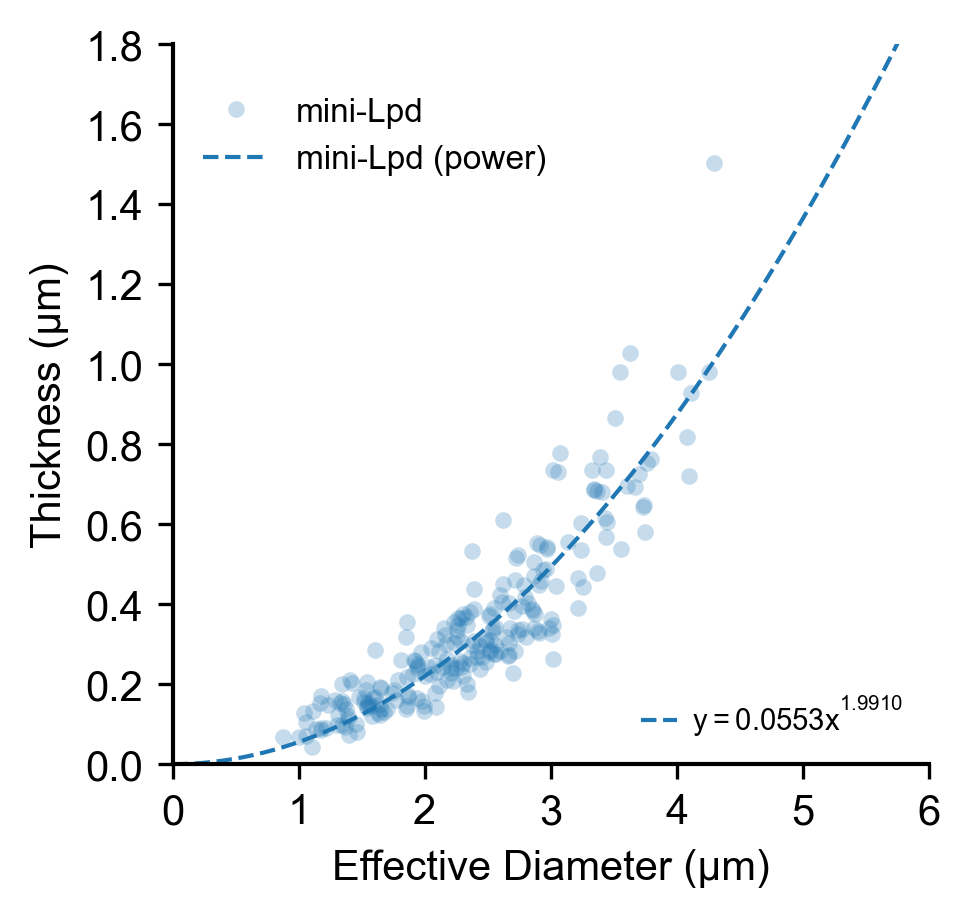

In [38]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})

nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)

for plotcounter in range(0,nr):
    legcell1 = []
    x1=axvec.plot(Diameter,Thickness,marker='o',markersize=4,linewidth=0.0,color='tab:blue',alpha=0.25,markeredgecolor='none')
    legcell1.append(x1[0]);
    legcell2 = []
    x2=axvec.plot(Diameter_Fit,Droplet_Fit,linewidth=1.0,linestyle='dashed',color='tab:blue',alpha=1.0,label=f"$y = {a:.4f} x^{{ {b:.4f} }}$")
    legcell1.append(x2[0]);
    legcell2.append(x2[0]);

labelvec = ['mini-Lpd', 'mini-Lpd (power)']

axvec.spines[['right', 'top']].set_visible(False)
axvec.set_xlabel('Effective Diameter (µm)') 
axvec.set_xlim([0,6]) 
axvec.set_ylabel('Thickness (µm)') 
axvec.set_ylim([0,1.8]) 
axvec.set_yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8]) 
axvec.set_xticks([0,1,2,3,4,5,6]) 
leg = fig.legend(legcell1, labelvec,ncol=1,fontsize=8,frameon=False,
                loc='upper left', bbox_to_anchor=(0.15, 0.875), labelspacing=0.5)
leg2 = plt.legend(handles=legcell2, loc='lower right', ncol=1,fontsize=7.0, frameon=False, 
                  labelspacing=0.5, columnspacing = 0.75, handletextpad = 0.5, handlelength = 1.25)
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_6D.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_6D.pdf', dpi=300, bbox_inches='tight')

## Figure 6E Data

In [39]:
# Load all replicates
# Take mean and std
# plot 5 rows 1 column plots
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

jobfoldername = 'inputfiles' 
kformvec =[1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
ksplitvec =[1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
Nreps = 10
MeanlistAR = []
StdlistAR = []

dirpath = 'Figure_6/Figure_6E'
for kformiter, kform in enumerate(kformvec):
    for ksplititer, ksplit in enumerate (ksplitvec):
        AspectRatio = []
        Rval = kformiter*len(ksplitvec)+ksplititer
        for repid in range(0,Nreps):
            fvar = dirpath+'/outputfiles/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df = pd.read_csv(fvar,index_col=0)
            Timevec = df.iloc[0].to_numpy()
            a1 = df.iloc[1].to_numpy()
            a2 = df.iloc[2].to_numpy()
            a3 = df.iloc[3].to_numpy()
            AspectRatio_tmp = np.zeros(len(Timevec))
            for time in range(0,len(Timevec)):
                a = max(a1[time], a2[time], a3[time])
                c = min(a1[time], a2[time], a3[time])
                AspectRatio_tmp[time] = a/c
            AspectRatio.append(AspectRatio_tmp)
            print('R_'+str(Rval)+'_r_'+str(repid))
            if repid == 0:
                print('Aspect Ratio at t=600s for Gallery Snapshot: ',AspectRatio_tmp[600])
            else:
                print('Aspect Ratio at t=600s for Replicate ' + str(repid) + ' : ',AspectRatio_tmp[600])
            print('---')
        AspectRatio = np.array(AspectRatio)
        MeanlistAR.append(np.mean(AspectRatio,0))
        StdlistAR.append(np.std(AspectRatio,0))
        print('R_'+str(Rval)+' - Average Aspect Ratio at t=600s: ',np.mean(AspectRatio,0)[600])
        print('------------------')
Timevec = df.iloc[0].to_numpy()

R_0_r_0
Aspect Ratio at t=600s for Gallery Snapshot:  1.1753700832869192
---
R_0_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.1538739836624332
---
R_0_r_2
Aspect Ratio at t=600s for Replicate 2 :  1.1158983872964907
---
R_0_r_3
Aspect Ratio at t=600s for Replicate 3 :  1.2630865518620125
---
R_0_r_4
Aspect Ratio at t=600s for Replicate 4 :  1.1984648435997605
---
R_0_r_5
Aspect Ratio at t=600s for Replicate 5 :  1.2345503717177928
---
R_0_r_6
Aspect Ratio at t=600s for Replicate 6 :  1.2099498120128782
---
R_0_r_7
Aspect Ratio at t=600s for Replicate 7 :  1.1904147916871686
---
R_0_r_8
Aspect Ratio at t=600s for Replicate 8 :  1.257177405028109
---
R_0_r_9
Aspect Ratio at t=600s for Replicate 9 :  1.2330773710279899
---
R_0 - Average Aspect Ratio at t=600s:  1.2031863601181554
------------------
R_1_r_0
Aspect Ratio at t=600s for Gallery Snapshot:  1.2594989811818291
---
R_1_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.2827946012337799
---
R_1_r_2
Aspect Ratio at t=600s for Repli

## Plot Figure 6E

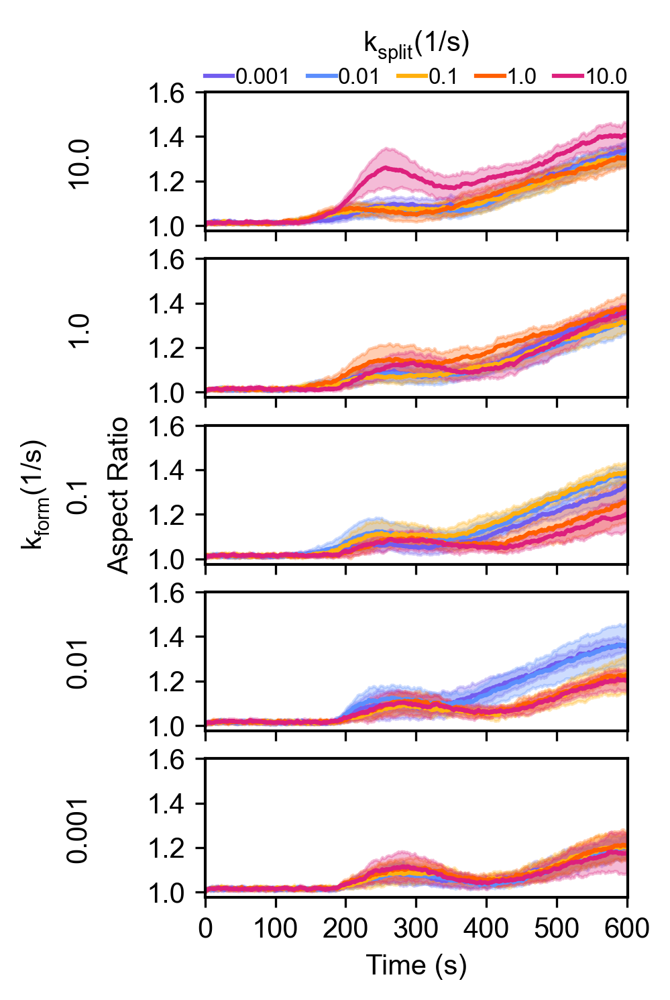

In [40]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']

# Aspect Ratio Figure
nr = 5; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(2.5,5), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
for plotcounter in range(0,nr):
    legcell = []
    for val in range(0,nr):
        Rval = plotcounter*len(ksplitvec) + val
        ax = axvec[nr-plotcounter-1]
        x = ax.plot(Timevec,MeanlistAR[Rval],color=colorlist[val])
        legcell.append(x[0]);
        ax.fill_between(Timevec,MeanlistAR[Rval]-StdlistAR[Rval],MeanlistAR[Rval]+StdlistAR[Rval],color=colorlist[val],alpha=0.3)
plt.text(-0.2, 0.5, 'Aspect Ratio', horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)
axvec[4].set_xlabel('Time (s)') 
axvec[4].set_xlim([0,601]) 
axvec[4].set_xticks([0,100,200,300,400,500,600]) 
axvec[4].set_yticks([1.0,1.2,1.4,1.6]) 
axvec[0].set_ylabel('10.0', labelpad=20) 
axvec[1].set_ylabel('1.0', labelpad=20) 
axvec[2].set_ylabel('0.1', labelpad=20) 
axvec[3].set_ylabel('0.01', labelpad=20) 
axvec[4].set_ylabel('0.001', labelpad=20) 
axvec[0].legend(legcell, ksplitvec,title=r"$k_{split} (1/s)$",
                 ncol=5,fontsize=8,frameon=False, loc='upper center', bbox_to_anchor=(0.5, 1.6), 
                 labelspacing = 0.1, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)
plt.text(-0.4, 0.5, r"$k_{form} (1/s)$", horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_6E.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_6E.pdf', dpi=300, bbox_inches='tight')

# Figure 7

## Figure 7B Data

In [41]:
# Assemble data for figure

# Load all replicates
# Take mean and std
# plot 5 rows 1 column plots
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

# Define power law equation
def power_law(x, a, b):
    return a * np.power(x, b)

jobfoldername = 'inputfiles' 
Diameter = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0]
Nfil = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100]
nTension = [str(2), str(4), str(8)]
lowerAR = 1.5
upperAR = 2.0
Nreps = 10
Dfitdata = []
Nfitdata = []
tensionARfit = []
adata = []
bdata = []
r2data = []

dirpath = 'Figure_7/Figure_7B'
for teniter, tension in enumerate(nTension):
    fitDataAR = []
    for Nfiliter in range (0, len(Nfil)):
        for diter in range (0, len(Diameter)):
            abc = []
            Rval = diter + len(Diameter)*Nfiliter
            for repid in range(0, Nreps):
                fvar = dirpath+'/outputfiles_tension_'+tension+'/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
                df = pd.read_csv(fvar,index_col=0)
                Timevec = df.iloc[0].to_numpy()
                a1 = df.iloc[1].to_numpy()
                a2 = df.iloc[2].to_numpy()
                a3 = df.iloc[3].to_numpy()
                AspectRatio = np.zeros(len(Timevec))
                for time in range(0, len(Timevec)):
                    abc_tmp = np.array([a1[time],a2[time],a3[time]])
                    abc = np.sort(abc_tmp)
                    a = abc[2]
                    b = abc[1]
                    c = abc[0]
                    AspectRatio[time] = a/c
                if AspectRatio[600] >= lowerAR  and AspectRatio[600] <= upperAR:
                    fitDataAR.append([Rval, repid, Nfil[Nfiliter], Diameter[diter], AspectRatio[600]])
                print('R_'+str(Rval)+'_r_'+str(repid))
                print('---')

    fitdf = pd.DataFrame(fitDataAR, columns =  ["Rval", "Replicate", "Nfil", "Diameter", "AspectRatio"])
    fitdf = fitdf.groupby("Diameter").filter(lambda x: len(x) >= 10)
    Dfitdata_tmp = fitdf["Diameter"]
    Dfitdata.append(Dfitdata_tmp)
    Nfitdata_tmp = fitdf["Nfil"]
    Nfitdata.append(Nfitdata_tmp)
    Diameter_Fit = np.linspace(0, 4.5, 451)

    params, pcov, infodict, _, _ = opt.curve_fit(power_law, Dfitdata_tmp, Nfitdata_tmp, full_output=True)
    a, b = params
    adata.append(a)
    bdata.append(b)
        
    fvec = infodict['fvec']
    r2 = 1 - (np.sum(np.square(fvec)))/(np.sum(np.square(Nfitdata_tmp - np.mean(Nfitdata_tmp))))
    r2data.append(r2)
    tensionARfit_tmp = a * Diameter_Fit**b
    tensionARfit.append(tensionARfit_tmp)


R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
R_6_r_0
---
R_6_r_1
---
R_6_r_2
---
R_6_r_3
---
R_6_r_4
---
R_6_r_5
---
R_6_r_6
---
R_6_r_7
---
R_6_r_8
---
R_6_r_9
---
R_7_r_0
---
R_7_r_1
---
R_7_r_2
---
R_7_r_3
---
R_7_r_4
---
R_7_r_5
---
R_7_r_6
---
R_7_r_7
---
R_7_r_8
---
R_7_r_9
---
R_8_r_0
---
R_8_r_1
---
R_8_r_2
---
R_8_

## Plot Figure 7B

Surface Tension =  2
Number of Replicates:  10
Number of Data Points:  146
Power Fit:  y = 0.8337x^(4.2056)
R2:  0.9229612393562607
------------------
Surface Tension =  4
Number of Replicates:  10
Number of Data Points:  165
Power Fit:  y = 3.8509x^(3.2207)
R2:  0.879027402797621
------------------
Surface Tension =  8
Number of Replicates:  10
Number of Data Points:  155
Power Fit:  y = 9.3552x^(2.9160)
R2:  0.7655110919027088
------------------


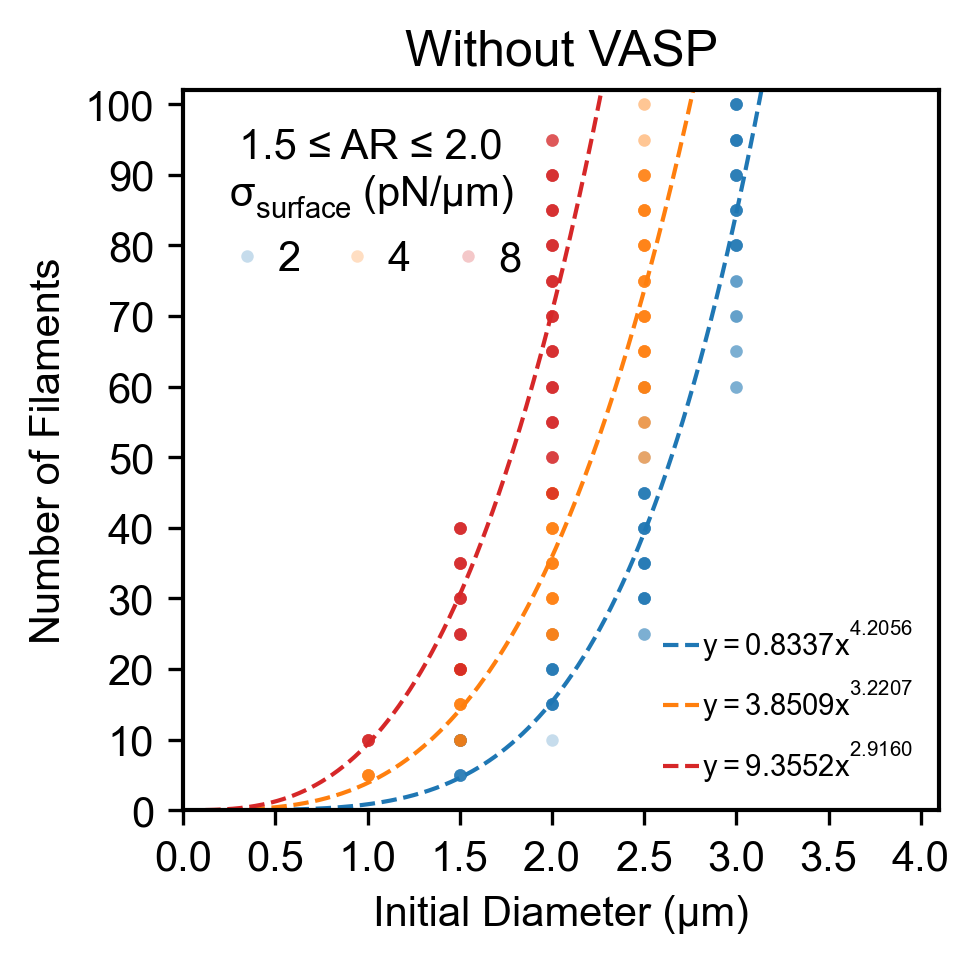

In [42]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['tab:blue', 'tab:orange', 'tab:red']

# Figure
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
for plotcounter in range(0,nr):
    legcell1 = []
    for teniter in range(0, len(nTension)):
        x1=axvec.plot(Dfitdata[teniter],Nfitdata[teniter],marker='.',linewidth=0.0,color=colorlist[teniter],alpha=0.25,markeredgecolor='none', label=f"${nTension[teniter]}$")
        legcell1.append(x1[0]);
    legcell2 = []
    for teniter in range(0, len(nTension)):
        x2=axvec.plot(Diameter_Fit,tensionARfit[teniter],linewidth=1.0,linestyle='dashed',color=colorlist[teniter],alpha=1.0, label=f"$y = {adata[teniter]:.4f} x^{{ {bdata[teniter]:.4f} }}$")
        legcell2.append(x2[0]);
        print("Surface Tension = ",  nTension[teniter])
        print('Number of Replicates: ', Nreps)
        print('Number of Data Points: ', len(Nfitdata[teniter]))
        print('Power Fit: ', f"y = {adata[teniter]:.4f}x^({bdata[teniter]:.4f})")
        print('R2: ', r2data[teniter])
        print('------------------')
axvec.set_xlabel(r"Initial Diameter (µm)")
axvec.set_xlim([0,4.1]) 
axvec.set_ylabel(r"Number of Filaments") 
axvec.set_ylim([0,102]) 

axvec.set_yticks([0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]) 
axvec.set_xticks([0.0,0.5,1,1.5,2,2.5,3,3.5,4]) 

leg1 = fig.legend(handles=legcell1, title = str(lowerAR) + r" ≤ AR ≤ " + str(upperAR) + '\n' + r"$\sigma_{surface} \: (pN/\mu m)$",ncol=3,fontsize=10.0,frameon=False,
                loc='upper left', bbox_to_anchor=(0.15, 0.9), labelspacing=0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)
plt.setp(leg1.get_title(), ha ='center')
leg2 = plt.legend(handles=legcell2, loc='lower right', ncol=1,fontsize=7.0, frameon=False, 
                labelspacing=0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)

plt.title('Without VASP')
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
    
plt.savefig('Figure_7B.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_7B.pdf', dpi=300, bbox_inches='tight')

## Figure 7D Data

In [43]:
def getARdata(sheetname, columnlist, condlist, Ntrials):
    # Path to Excel data
    datafile = 'Source_Data_Fig_7.xlsx'
    # Read Excel file with multiple sheets
    xlsx = pd.read_excel(datafile, sheet_name=['Fig 7D', 'Fig S7C'])
    dataframedict = {}
    Ncond = len(condlist)
    ARData = []
    ARFrac = np.zeros((Ntrials, Ncond))
    ARAvg = np.zeros((Ntrials, Ncond))
    for cond in range(0, Ncond):
        df = xlsx[sheetname]
        df.columns = df.iloc[1]
        df = df[2:]
        df = df.reset_index(drop=True)
        ARData_Reps = []
        colstart = columnlist[cond]
        for trial in range(0, Ntrials):
            col = colstart + trial
            RGGData = df.iloc[:, col]
            RGGData = pd.to_numeric(RGGData, errors='coerce')
            RGGData = RGGData.dropna()
            RGGData = RGGData.loc[RGGData >= 1]
            df_name = f'RGG_Actin_{condlist[cond]}_AR{trial+1}'
            dataframedict[df_name] = RGGData
            # Calculate fraction of condensates with AR > 1.2
            Count = sum(1 for AR in RGGData if AR > 1.2)
            ARFrac[trial, cond] = Count/len(RGGData)
            # Calculate average aspect ratio
            ARAvg[trial, cond] = np.mean(RGGData)
            ARData_Reps.extend(RGGData)
        ARData.append(ARData_Reps)
    return dataframedict, ARFrac, ARAvg, ARData

## Plot Figure 7D

  conc1 conc2  t_statistic   p_value
0   0.0   0.5   -17.888302  0.000057
1   0.0   1.5   -18.579540  0.000049
2   0.5   1.5   -10.800891  0.000417
2.6400000000000006 0.02
2.6400000000000006 0.02
2.6400000000000006 0.02


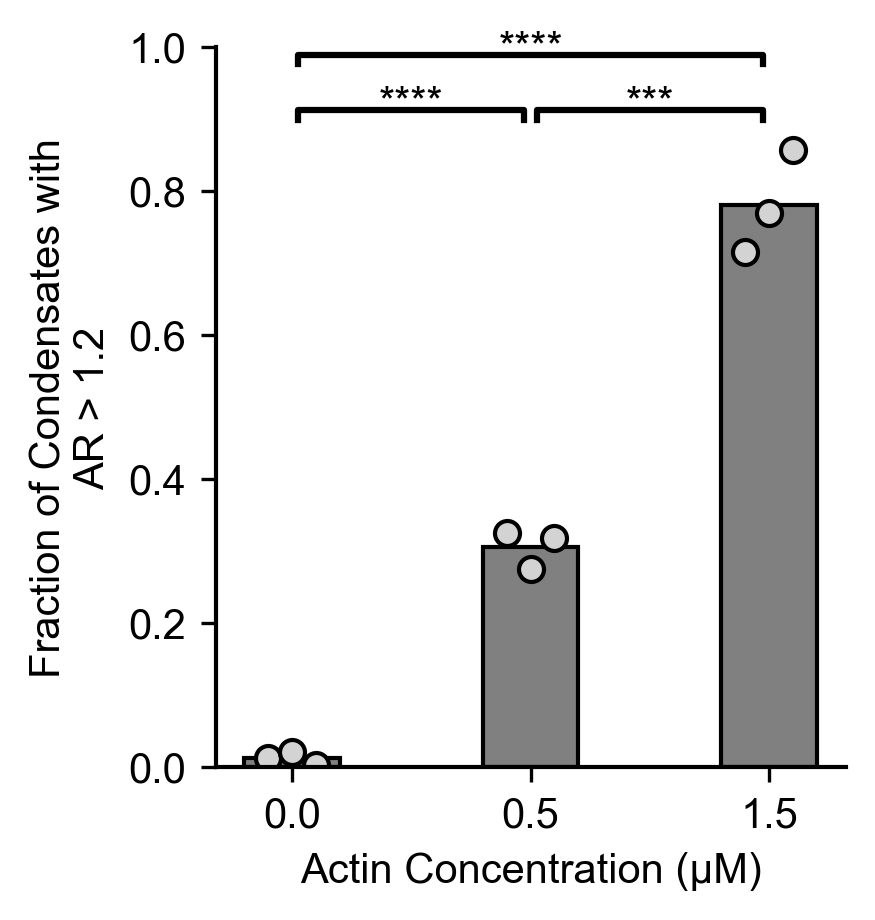

In [44]:
# Get Data
sheetname = 'Fig 7D'
columnlist = [0, 4, 8]
condlist = ['00', '05', '15']
Ntrials = 3
dataframedict, ARFrac, ARAvg, ARData = getARdata(sheetname, columnlist, condlist, Ntrials)

plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
conclist = ['0.0', '0.5', '1.5']
bar_width = 0.4

# Figure Full
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(2.5,3), dpi=300, facecolor='w', edgecolor='k', sharex=False, sharey=False)
for plotcounter in range(0,nr):
    legcell = []
    concvec = []
    pointsvec = []
    meanvec = []
    stdvec = []
    t_test = []
    for cond in range(0, len(conclist)):
        concvec.append([conclist[cond], conclist[cond], conclist[cond]])
        pointsvec.append(ARFrac[:, cond])
        meanvec.append(np.mean(ARFrac[:, cond]))
        stdvec.append(np.std(ARFrac[:, cond]))
    axvec.bar(conclist, meanvec, width=bar_width, capsize=5, color='grey', edgecolor='black', linewidth=1)
    axvec.spines[['right', 'top']].set_visible(False)
    for cond in range(0, len(conclist)):
        x_jitter_means = [cond-0.1, cond, cond+0.1]
        axvec.plot(x_jitter_means, pointsvec[cond], marker='o', linewidth=0.0, color='lightgrey', alpha=1.0, markeredgecolor='black')
        for cond2 in range(0, len(conclist)):
            if cond < cond2:
                t_statistic, p_value = stats.ttest_ind(a=pointsvec[cond], b=pointsvec[cond2], equal_var=True)
                t_test_tmp = {'conc1': conclist[cond], 'conc2': conclist[cond2], 't_statistic': t_statistic, 'p_value': p_value}
                t_test.append(t_test_tmp)
            else:
                continue
    df = pd.DataFrame(t_test)
    print(df)
    df_annotations = df.drop(columns=['t_statistic'])
    annotations = list(df_annotations.itertuples(index=False, name=None))
    starbars.draw_annotation(annotations, ns_show=False, bar_gap=0.0, text_distance=0.01, h_gap=0.02, top_margin=0.03, tip_length=0.015)
    axvec.set_ylabel('Fraction of Condensates with\nAR > 1.2')
    axvec.set_xlabel('Actin Concentration (µM)')
    axvec.set_ylim(0.0, 1.0)

plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.6, 
                    hspace=0.4)
plt.savefig('Figure_7D.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_7D.pdf', dpi=300, bbox_inches='tight')

## Figure 7E Data

In [45]:
# Load all replicates
# Take mean and std
# plot 5 rows 1 column plots
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

jobfoldername = 'inputfiles' 
viscosityvec = [100, 150, 200, 300, 400]
tensionvec = [4, 8, 12, 16, 20]
Nreps = 10
MeanlistAR = []
StdlistAR = []

dirpath = 'Figure_7/Figure_7E'
for visciter in range(0, len(viscosityvec)):
    for tensiter in range(0, len(tensionvec)):
        AspectRatio = []
        Rval = tensiter*len(viscosityvec)+visciter
        for repid in range(0,Nreps):
            fvar = dirpath+'/outputfiles/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df = pd.read_csv(fvar,index_col=0)
            Timevec = df.iloc[0].to_numpy()
            a1 = df.iloc[1].to_numpy()
            a2 = df.iloc[2].to_numpy()
            a3 = df.iloc[3].to_numpy()
            AspectRatio_tmp = np.zeros(len(Timevec))
            for time in range(0,len(Timevec)):
                a = max(a1[time], a2[time], a3[time])
                c = min(a1[time], a2[time], a3[time])
                AspectRatio_tmp[time] = a/c
            AspectRatio.append(AspectRatio_tmp)
            print('R_'+str(Rval)+'_r_'+str(repid))
            if repid == 0:
                print('Aspect Ratio at t=600s for Gallery Snapshot: ',AspectRatio_tmp[600])
            else:
                print('Aspect Ratio at t=600s for Replicate ' + str(repid) + ' : ',AspectRatio_tmp[600])
            print('---')
        AspectRatio = np.array(AspectRatio)
        MeanlistAR.append(np.mean(AspectRatio,0))
        StdlistAR.append(np.std(AspectRatio,0))
        print('R_'+str(Rval)+' - Average Aspect Ratio at t=600s: ',np.mean(AspectRatio,0)[600])
        print('------------------')
Timevec = df.iloc[0].to_numpy()

R_0_r_0
Aspect Ratio at t=600s for Gallery Snapshot:  1.6021219805329494
---
R_0_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.6613884187985037
---
R_0_r_2
Aspect Ratio at t=600s for Replicate 2 :  1.6148375101474326
---
R_0_r_3
Aspect Ratio at t=600s for Replicate 3 :  1.6982845167625809
---
R_0_r_4
Aspect Ratio at t=600s for Replicate 4 :  1.645697027973212
---
R_0_r_5
Aspect Ratio at t=600s for Replicate 5 :  1.5682331107860303
---
R_0_r_6
Aspect Ratio at t=600s for Replicate 6 :  1.6855893029798728
---
R_0_r_7
Aspect Ratio at t=600s for Replicate 7 :  1.6436630497681326
---
R_0_r_8
Aspect Ratio at t=600s for Replicate 8 :  1.6019299162895064
---
R_0_r_9
Aspect Ratio at t=600s for Replicate 9 :  1.6573907510389672
---
R_0 - Average Aspect Ratio at t=600s:  1.6379135585077187
------------------
R_5_r_0
Aspect Ratio at t=600s for Gallery Snapshot:  1.3461964984724217
---
R_5_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.3514541179161337
---
R_5_r_2
Aspect Ratio at t=600s for Repli

## Plot Figure 7E

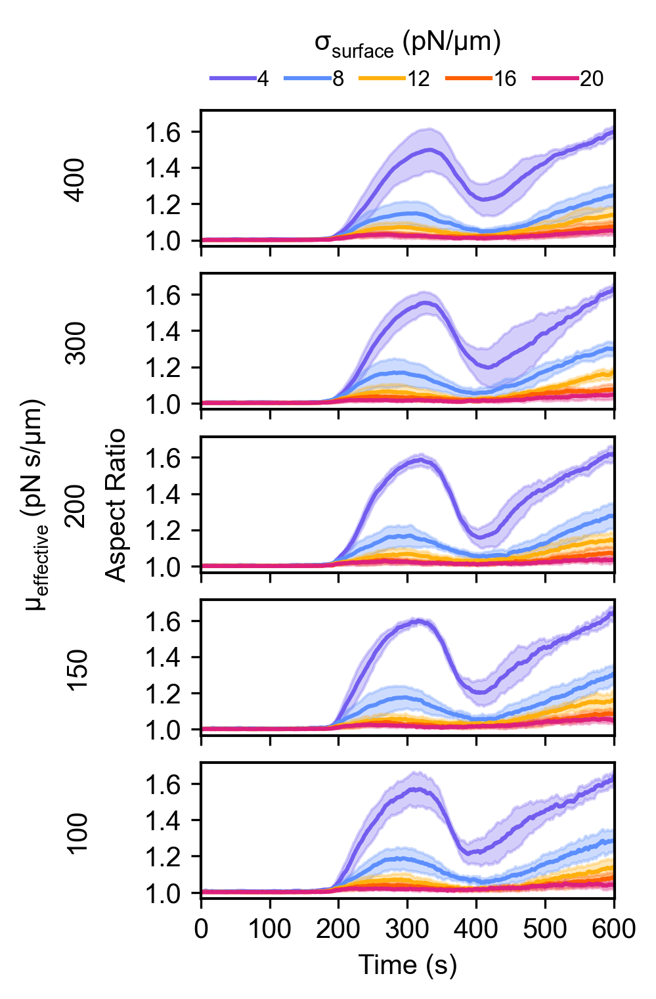

In [46]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']

# Aspect Ratio Figure
nr = 5; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(2.5,5), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
for plotcounter in range(0,nr):
    legcell = []
    for val in range(0,nr):
        Rval = plotcounter*len(viscosityvec) + val
        ax = axvec[nr-plotcounter-1]
        x = ax.plot(Timevec,MeanlistAR[Rval],color=colorlist[val])
        legcell.append(x[0]);
        ax.fill_between(Timevec,MeanlistAR[Rval]-StdlistAR[Rval],MeanlistAR[Rval]+StdlistAR[Rval],color=colorlist[val],alpha=0.3)
plt.text(-0.2, 0.5, 'Aspect Ratio', horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)
axvec[4].set_xlabel('Time (s)') 
axvec[4].set_xlim([0,601]) 
axvec[4].set_yticks([1.0,1.2,1.4,1.6]) 
axvec[4].set_xticks([0,100,200,300,400,500,600]) 
axvec[4].set_ylabel('100', labelpad=20) 
axvec[3].set_ylabel('150', labelpad=20)
axvec[2].set_ylabel('200', labelpad=20)
axvec[1].set_ylabel('300', labelpad=20)
axvec[0].set_ylabel('400', labelpad=20)
plt.text(-0.4, 0.5, r"$\mu_{effective} \: (pN \: s/µm)$", horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)
axvec[0].legend(legcell, tensionvec,title=r"$\sigma_{surface} \: (pN/µm)$",
                 ncol=5,fontsize=8,frameon=False, loc='upper center', bbox_to_anchor=(0.5, 1.75), 
                 labelspacing = 0.5, columnspacing = 0.75, handletextpad = 0.1)
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_7E.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_7E.pdf', dpi=300, bbox_inches='tight')

# Figure 8

## Figure 8A Data

In [47]:
# Load all replicates
# Take mean and std
# plot 5 rows 1 column plots
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

jobfoldername = 'inputfiles' 
ARvec = [1.0, 1.1, 1.2, 1.5, 2.0]
Nreps = 10
spanaMean = []
spanbMean = []
spancMean = []
spanaStd = []
spanbStd = []
spancStd = []
angleList = []
angleMean = []
angleStd = []

dirpath = 'Figure_8/Figure_8A'
for Rval, AR in enumerate (ARvec): 
    spana = []
    spanb = []
    spanc = []
    angle = []
    angleList_tmp = []
    for repid in range(0, Nreps):
        fvar = dirpath+'/outputfiles/'+'EigenvalueOutput'+'/Eigval'+jobfoldername+'R_'+str(Rval)+'_r_'+str(repid)+'.csv'
        df = pd.read_csv(fvar,index_col=0)
        spana_tmp = df.iloc[1].to_numpy()
        spanb_tmp = df.iloc[2].to_numpy()
        spanc_tmp = df.iloc[3].to_numpy()
        angle_tmp = np.arctan(spanc_tmp/spana_tmp)*180/(np.pi)
        spana.append(spana_tmp)
        spanb.append(spanb_tmp)
        spanc.append(spanc_tmp)
        angle.append(angle_tmp)
        angleList_tmp.append(angle_tmp[600])     
        print('R_'+str(Rval)+'_r_'+str(repid))
        print('Alignment Angle: ', angle_tmp[600])
    spana = np.array(spana)
    spanb = np.array(spanb)
    spanc = np.array(spanc)
    angle = np.array(angle)
    spanaMean.append(np.mean(spana,0))
    spanbMean.append(np.mean(spanb,0))
    spancMean.append(np.mean(spanc,0))
    spanaStd.append(np.std(spana,0))
    spanbStd.append(np.std(spanb,0))
    spancStd.append(np.std(spanc,0))
    angleList.append(angleList_tmp)
    angleMean.append(np.mean(angle,0))
    angleStd.append(np.std(angle,0))
    print('Mean Alignment Angle: ', angleMean[Rval][600])
    print('---')

#####################################

plotdf = pd.DataFrame({'spanaMean':spanaMean,
                       'spanbMean':spanbMean,
                       'spancMean':spancMean,
                       'spanaStd':spanaStd,
                       'spanbStd':spanbStd,
                       'spancStd':spancStd,
                       'angleMean':angleMean,
                       'angleStd':angleStd})

R_0_r_0
Alignment Angle:  41.268058392657345
R_0_r_1
Alignment Angle:  38.92152832860971
R_0_r_2
Alignment Angle:  40.89817762267909
R_0_r_3
Alignment Angle:  39.16077829107167
R_0_r_4
Alignment Angle:  40.474058919618486
R_0_r_5
Alignment Angle:  40.79749575652702
R_0_r_6
Alignment Angle:  41.51875240702882
R_0_r_7
Alignment Angle:  41.92752599513128
R_0_r_8
Alignment Angle:  40.943219927127714
R_0_r_9
Alignment Angle:  40.58244930760894
Mean Alignment Angle:  40.64920449480601
---
R_1_r_0
Alignment Angle:  29.66176144822521
R_1_r_1
Alignment Angle:  26.94417378951756
R_1_r_2
Alignment Angle:  30.348778348545174
R_1_r_3
Alignment Angle:  30.728156142751402
R_1_r_4
Alignment Angle:  29.76408663779384
R_1_r_5
Alignment Angle:  29.853130106591255
R_1_r_6
Alignment Angle:  31.03139353247693
R_1_r_7
Alignment Angle:  32.660450217306646
R_1_r_8
Alignment Angle:  30.315894618477095
R_1_r_9
Alignment Angle:  26.313421432759952
Mean Alignment Angle:  29.762124627444507
---
R_2_r_0
Alignment An

## Plot Figure 8A

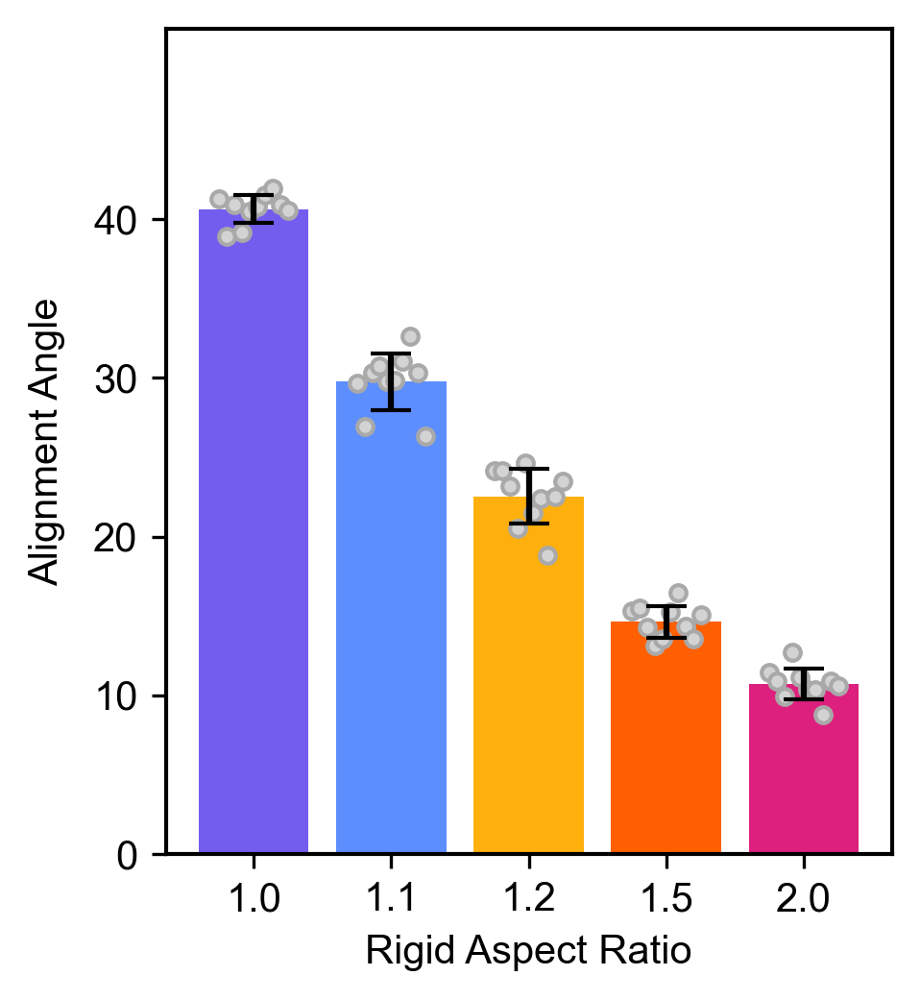

In [48]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']
angleMean = plotdf['angleMean'].values
angleStd = plotdf['angleStd'].values
ARList = ['1.0', '1.1', '1.2', '1.5', '2.0']

# Figure Full
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3.58), dpi=300, facecolor='w', edgecolor='k', sharex=False, sharey=False)
for plotcounter in range(0,nr):
    legcell = []
    anglevec = []
    meanvec = []
    stdvec = []
    for val in range(0, len(ARvec)):
        Rval = plotcounter*len(ARvec)+val
        anglevec.append(angleList[Rval])
        meanvec.append(angleMean[Rval][600])
        stdvec.append(angleStd[Rval][600])
        for x in range(0, len(anglevec[Rval])):
            w = 0.25
            axvec.plot(val - w + (x*2*w/(len(anglevec[Rval])-1)), anglevec[Rval][x], marker='o', markersize=4, color='lightgrey', markeredgecolor='darkgrey')

    axvec.bar(ARList, meanvec, yerr=stdvec, capsize=5, color=colorlist)
    axvec.set_xlabel('Rigid Aspect Ratio')
    axvec.set_ylabel('Alignment Angle', labelpad=7)
    axvec.set_ylim([0,52]) 
    axvec.set_yticks([0, 10, 20, 30, 40]) 
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.6, 
                    hspace=0.4)
plt.savefig('Figure_8A.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_8A.pdf', dpi=300, bbox_inches='tight')

## Figure 8B Data

In [49]:
# Load all replicates
# Take mean and std
# plot 5 rows 1 column plots
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

jobfoldername = 'inputfiles' 
viscosityvec = [100, 150, 200, 300, 400]
tensionvec = [4, 8, 12, 16, 20]
Nreps = 10
timepos = 600
MeanlistAR = []
StdlistAR = []
ARList = []
spanaMean = []
spanbMean = []
spancMean = []
spanaStd = []
spanbStd = []
spancStd = []
angleMean = []
angleStd = []
angleList = []

dirpath = 'Figure_8/Figure_8B'
for tensiter, tension in enumerate(tensionvec):
    for visciter, viscosity in enumerate(viscosityvec):
        AspectRatio = []
        finalAR = []
        spana = []
        spanb = []
        spanc = []
        angle = []
        finalangle = []
        Rval = tensiter*len(viscosityvec)+visciter
        for repid in range(0,Nreps):
            fvar1 = dirpath+'/outputfiles/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df1 = pd.read_csv(fvar1,index_col=0)
            Timevec = df1.iloc[0].to_numpy()
            a1 = df1.iloc[1].to_numpy()
            a2 = df1.iloc[2].to_numpy()
            a3 = df1.iloc[3].to_numpy()
            AspectRatio_tmp = np.zeros(len(Timevec))
            for time in range(0,len(Timevec)):
                a = max(a1[time], a2[time], a3[time])
                c = min(a1[time], a2[time], a3[time])
                AspectRatio_tmp[time] = a/c
            AspectRatio.append(AspectRatio_tmp)
            finalAR.append(AspectRatio_tmp[timepos])
            fvar2 = dirpath+'/outputfiles/'+'EigenvalueOutput'+'/Eigval'+jobfoldername+'R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df2 = pd.read_csv(fvar2,index_col=0)
            spana_tmp = df2.iloc[1].to_numpy()
            spanb_tmp = df2.iloc[2].to_numpy()
            spanc_tmp = df2.iloc[3].to_numpy()
            angle_tmp = np.arctan(spanc_tmp/spana_tmp)*180/(np.pi)
            spana.append(spana_tmp)
            spanb.append(spanb_tmp)
            spanc.append(spanc_tmp)
            angle.append(angle_tmp)
            finalangle.append(angle_tmp[timepos])
            print('R_'+str(Rval)+'_r_'+str(repid))
            print('---')
        AspectRatio = np.array(AspectRatio)
        MeanlistAR.append(np.mean(AspectRatio,0))
        StdlistAR.append(np.std(AspectRatio,0))
        finalAR = np.array(finalAR)
        ARList.append(finalAR)
        spana = np.array(spana)
        spanb = np.array(spanb)
        spanc = np.array(spanc)
        angle = np.array(angle)
        spanaMean.append(np.mean(spana,0))
        spanbMean.append(np.mean(spanb,0))
        spancMean.append(np.mean(spanc,0))
        spanaStd.append(np.std(spana,0))
        spanbStd.append(np.std(spanb,0))
        spancStd.append(np.std(spanc,0))
        angleMean.append(np.mean(angle,0))
        angleStd.append(np.std(angle,0))
        finalangle = np.array(finalangle)
        angleList.append(finalangle)

#####################################

Timevec = df1.iloc[0].to_numpy()
plotdf = pd.DataFrame({'MeanlistAR':MeanlistAR,
                       'StdlistAR':StdlistAR,
                       'ARList':ARList,
                       'spanaMean':spanaMean,
                       'spanbMean':spanbMean,
                       'spancMean':spancMean,
                       'spanaStd':spanaStd,
                       'spanbStd':spanbStd,
                       'spancStd':spancStd,
                       'angleMean':angleMean,
                       'angleStd':angleStd,
                       'angleList':angleList})


R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
R_6_r_0
---
R_6_r_1
---
R_6_r_2
---
R_6_r_3
---
R_6_r_4
---
R_6_r_5
---
R_6_r_6
---
R_6_r_7
---
R_6_r_8
---
R_6_r_9
---
R_7_r_0
---
R_7_r_1
---
R_7_r_2
---
R_7_r_3
---
R_7_r_4
---
R_7_r_5
---
R_7_r_6
---
R_7_r_7
---
R_7_r_8
---
R_7_r_9
---
R_8_r_0
---
R_8_r_1
---
R_8_r_2
---
R_8_

## Plot Figure 8B

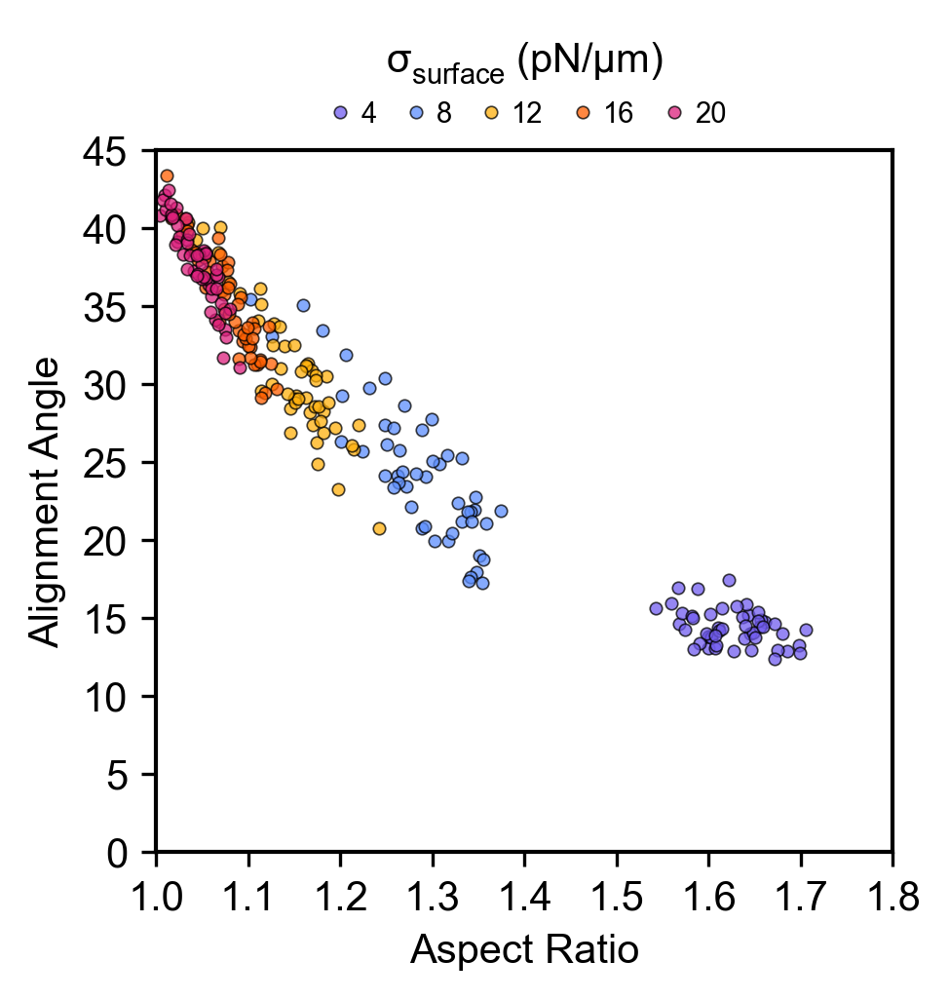

In [50]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']
ARList = plotdf['ARList'].values
angleList = plotdf['angleList'].values
tenslabelvec = ['4', '8', '12', '16', '20']

# Figure 
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
legcell = []
for plotcounter in range(0,5):
    for val in range(0,5):
        Rval = plotcounter*len(viscosityvec) + val
        x = axvec.plot(ARList[Rval],angleList[Rval],marker='.',linewidth=0.0,color=colorlist[plotcounter],alpha=0.75,markeredgecolor='black',markeredgewidth=0.4)
    legcell.append(x[0]);
axvec.set_xlabel('Aspect Ratio') 
axvec.set_xlim([1.0,1.8]) 
axvec.set_xticks([1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8]) 
axvec.set_ylabel('Alignment Angle') 
axvec.set_ylim([0,45]) 
axvec.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40, 45]) 
leg = plt.legend(legcell, tenslabelvec, title = r"$\sigma_{surface} \: (pN/µm)$", ncol=5,fontsize=7.0, frameon=False, 
                  loc='lower center', bbox_to_anchor=(0.5, 0.995), labelspacing=0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)

plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_8B.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_8B.pdf', dpi=300, bbox_inches='tight')

## Plot Figure 8B Inset

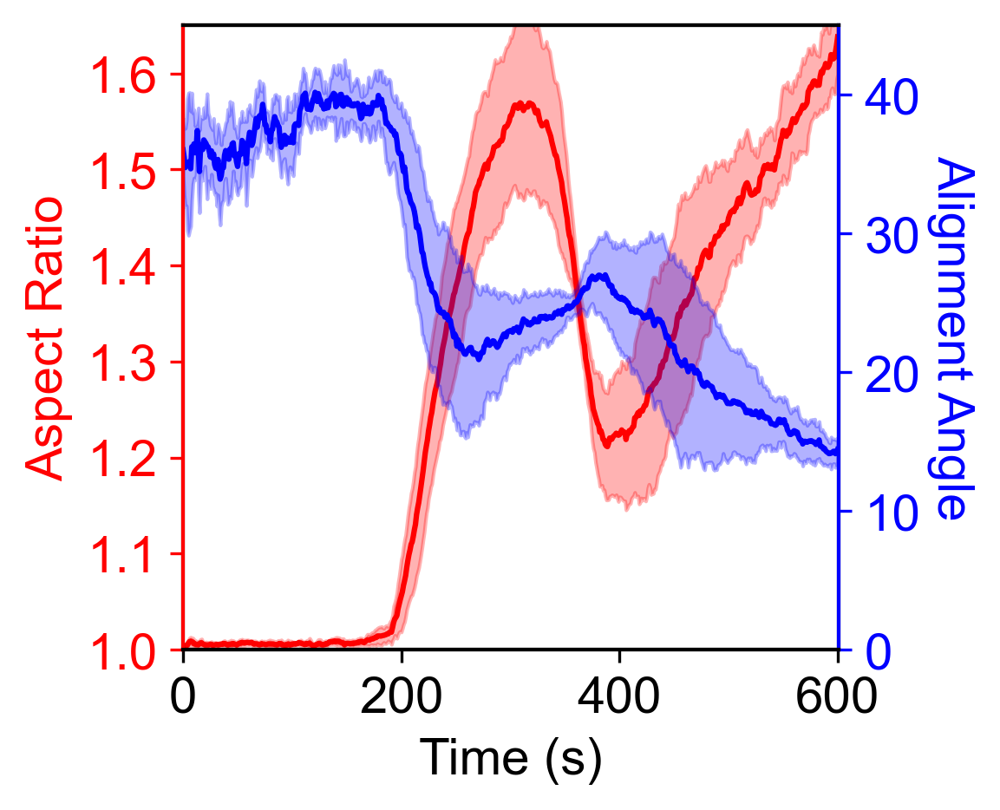

In [51]:
plt.rcParams.update({'font.size': 14, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']
Rval = 0
MeanlistAR = plotdf['MeanlistAR'][Rval]
StdlistAR = plotdf['StdlistAR'][Rval]
angleMean = plotdf['angleMean'][Rval]
angleStd = plotdf['angleStd'][Rval]

# Figure 
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=False, sharey=False)
x = axvec
for plotcounter in range(0,nr):
    legcell = []
    for val in range(0,nc):
        ax1 = axvec
        ax1.plot(Timevec,MeanlistAR,color='red')
        ax1.fill_between(Timevec,MeanlistAR-StdlistAR,MeanlistAR+StdlistAR,color='red',alpha=0.3)
        ax1.set_yticks([1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6])
        ax1.set_ylim([1.0,1.65])
        ax1.set_ylabel('Aspect Ratio', color='red')
        ax1.tick_params(axis='y', colors='red')
        ax2 = ax1.twinx()
        ax2.plot(Timevec,angleMean,color='blue')
        ax2.fill_between(Timevec,angleMean-angleStd,angleMean+angleStd,color='blue',alpha=0.3)
        ax2.set_yticks([0, 10, 20, 30, 40])
        ax2.set_ylim([0,45])
        ax2.set_ylabel('Alignment Angle', rotation=270, labelpad=15, color='blue')
        ax2.tick_params(axis='y', colors='blue')
        ax2.spines['left'].set_color('red')
        ax2.spines['right'].set_color('blue')
        axvec.set_xlabel('Time (s)') 
        axvec.set_xlim([0,601]) 
        axvec.set_xticks([0, 200, 400, 600])
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.6, 
                    hspace=0.4)
plt.savefig('Figure_8B_Inset.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_8B_Inset.pdf', dpi=300, bbox_inches='tight')

## Figure 8C-D Data

In [52]:
# Load all replicates
# Take mean and std
# plot 5 rows 1 column plots
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

jobfoldername = 'inputfiles' 
kformvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
ksplitvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
Nreps = 10
timepos = 600
MeanlistAR = []
StdlistAR = []
ARList = []
spanaMean = []
spanbMean = []
spancMean = []
spanaStd = []
spanbStd = []
spancStd = []
angleMean = []
angleStd = []
angleList = []

dirpath = 'Figure_8/Figure_8C-D'
for kformiter, kform in enumerate(kformvec):
    for ksplititer, ksplit in enumerate(ksplitvec):
        AspectRatio = []
        finalAR = []
        spana = []
        spanb = []
        spanc = []
        angle = []
        finalangle = []
        Rval = kformiter*len(ksplitvec)+ksplititer
        for repid in range(0,Nreps):
            fvar1 = dirpath+'/outputfiles/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df1 = pd.read_csv(fvar1,index_col=0)
            Timevec = df1.iloc[0].to_numpy()
            a1 = df1.iloc[1].to_numpy()
            a2 = df1.iloc[2].to_numpy()
            a3 = df1.iloc[3].to_numpy()
            AspectRatio_tmp = np.zeros(len(Timevec))
            for time in range(0,len(Timevec)):
                a = max(a1[time], a2[time], a3[time])
                c = min(a1[time], a2[time], a3[time])
                AspectRatio_tmp[time] = a/c
            AspectRatio.append(AspectRatio_tmp)
            finalAR.append(AspectRatio_tmp[timepos])
            fvar2 = dirpath+'/outputfiles/'+'EigenvalueOutput'+'/Eigval'+jobfoldername+'R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df2 = pd.read_csv(fvar2,index_col=0)
            spana_tmp = df2.iloc[1].to_numpy()
            spanb_tmp = df2.iloc[2].to_numpy()
            spanc_tmp = df2.iloc[3].to_numpy()
            angle_tmp = np.arctan(spanc_tmp/spana_tmp)*180/(np.pi)
            spana.append(spana_tmp)
            spanb.append(spanb_tmp)
            spanc.append(spanc_tmp)
            angle.append(angle_tmp)
            finalangle.append(angle_tmp[timepos])
            print('R_'+str(Rval)+'_r_'+str(repid))
            print('---')
        AspectRatio = np.array(AspectRatio)
        MeanlistAR.append(np.mean(AspectRatio,0))
        StdlistAR.append(np.std(AspectRatio,0))
        finalAR = np.array(finalAR)
        ARList.append(finalAR)
        spana = np.array(spana)
        spanb = np.array(spanb)
        spanc = np.array(spanc)
        angle = np.array(angle)
        spanaMean.append(np.mean(spana,0))
        spanbMean.append(np.mean(spanb,0))
        spancMean.append(np.mean(spanc,0))
        spanaStd.append(np.std(spana,0))
        spanbStd.append(np.std(spanb,0))
        spancStd.append(np.std(spanc,0))
        angleMean.append(np.mean(angle,0))
        angleStd.append(np.std(angle,0))
        finalangle = np.array(finalangle)
        angleList.append(finalangle)

#####################################

Timevec = df1.iloc[0].to_numpy()
plotdf = pd.DataFrame({'MeanlistAR':MeanlistAR,
                       'StdlistAR':StdlistAR,
                       'ARList':ARList,
                       'spanaMean':spanaMean,
                       'spanbMean':spanbMean,
                       'spancMean':spancMean,
                       'spanaStd':spanaStd,
                       'spanbStd':spanbStd,
                       'spancStd':spancStd,
                       'angleMean':angleMean,
                       'angleStd':angleStd,
                       'angleList':angleList})


R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
R_6_r_0
---
R_6_r_1
---
R_6_r_2
---
R_6_r_3
---
R_6_r_4
---
R_6_r_5
---
R_6_r_6
---
R_6_r_7
---
R_6_r_8
---
R_6_r_9
---
R_7_r_0
---
R_7_r_1
---
R_7_r_2
---
R_7_r_3
---
R_7_r_4
---
R_7_r_5
---
R_7_r_6
---
R_7_r_7
---
R_7_r_8
---
R_7_r_9
---
R_8_r_0
---
R_8_r_1
---
R_8_r_2
---
R_8_

## Plot Figure 8C

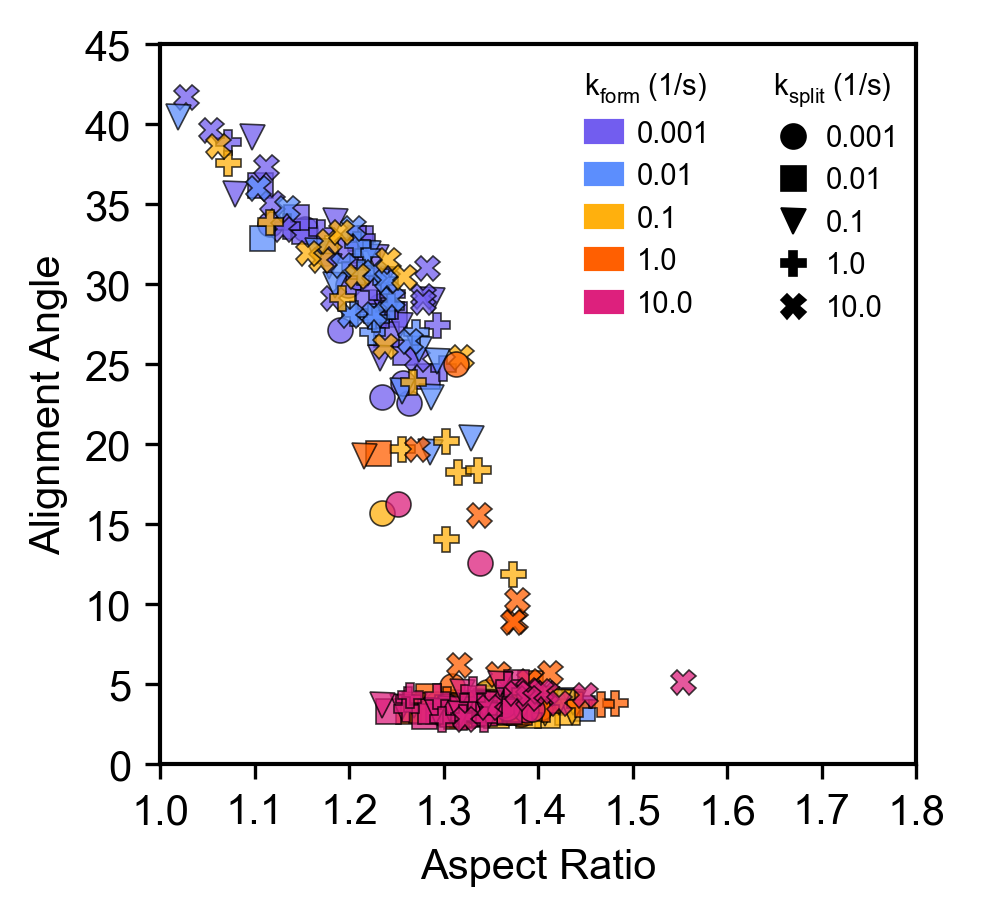

In [53]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']
ARList = plotdf['ARList'].values
angleList = plotdf['angleList'].values
labelvec = ['0.001', '0.01', '0.1', '1.0', '10.0']
markerlist = ['o', 's', 'v', 'P', 'X']

# Figure
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
legcell1 = []
legcell2 = []
for plotcounter in range(0,5):
    for val in range(0,5):
        Rval = plotcounter*len(ksplitvec) + val
        x = axvec.plot(ARList[Rval],angleList[Rval],marker=markerlist[val],linewidth=0.0,color=colorlist[plotcounter],alpha=0.75,markeredgecolor='black',markeredgewidth=0.4)
        legcell1.append(x[0]);
    legcell2.append(x[0]);
axvec.set_xlabel('Aspect Ratio') 
axvec.set_xlim([1.0,1.8]) 
axvec.set_xticks([1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8]) 
axvec.set_ylabel('Alignment Angle') 
axvec.set_ylim([0,45]) 
axvec.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40, 45]) 
kform_colors = [mpatches.Patch(color=colorlist[i]) for i in range(len(kformvec))]
ksplit_shapes = [plt.plot([], [], markerlist[i], markerfacecolor='black', markeredgecolor='black',markeredgewidth=0.4)[0] for i in range(len(ksplitvec))]
title1, = axvec.plot([], [], ' ')
title2, = axvec.plot([], [], ' ')
new_handles = [title1, kform_colors[0], kform_colors[1], kform_colors[2], kform_colors[3], kform_colors[4],
               title2, ksplit_shapes[0], ksplit_shapes[1], ksplit_shapes[2], ksplit_shapes[3], ksplit_shapes[4]]
new_labels = [r"$k_{form} \: (1/s)$", labelvec[0], labelvec[1], labelvec[2], labelvec[3], labelvec[4], 
              r"$k_{split} \: (1/s)$", labelvec[0], labelvec[1], labelvec[2], labelvec[3], labelvec[4]]
leg = axvec.legend(new_handles, new_labels, ncol=2, fontsize=7.0, frameon=False, 
                  loc='upper center', bbox_to_anchor=(0.8, 1.0), labelspacing=0.5, columnspacing = 0.5, handletextpad = 0.5, handlelength = 1.25)
for item, label in zip(leg.legend_handles, leg.texts):
    if label._text  in [r"$k_{form} \: (1/s)$", r"$k_{split} \: (1/s)$"]:
        width=item.get_window_extent(fig.canvas.get_renderer()).width
        label.set_ha('left')
        label.set_position((-6*width,0))

plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_8C.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_8C.pdf', dpi=300, bbox_inches='tight')

## Plot Figure 8D

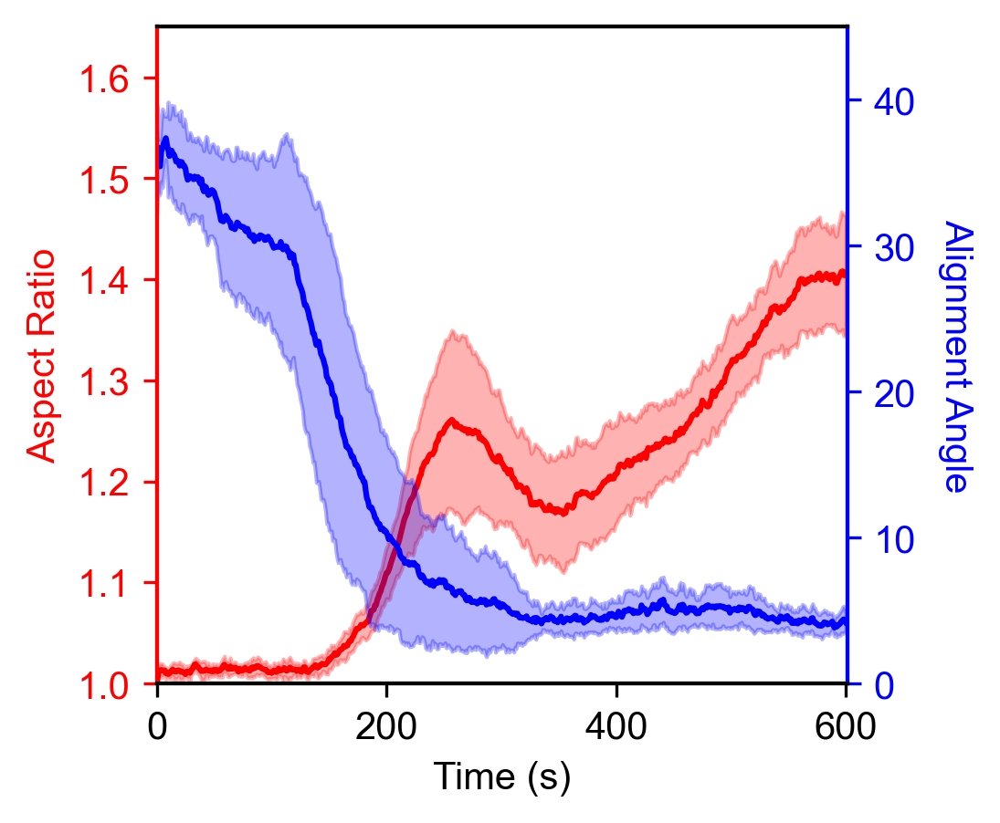

In [54]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']
Rval = 24
MeanlistAR = plotdf['MeanlistAR'][Rval]
StdlistAR = plotdf['StdlistAR'][Rval]
angleMean = plotdf['angleMean'][Rval]
angleStd = plotdf['angleStd'][Rval]

# Figure 
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=False, sharey=False)
x = axvec
for plotcounter in range(0,nr):
    legcell = []
    for val in range(0,nc):
        ax1 = axvec
        ax1.plot(Timevec,MeanlistAR,color='red')
        ax1.fill_between(Timevec,MeanlistAR-StdlistAR,MeanlistAR+StdlistAR,color='red',alpha=0.3)
        ax1.set_yticks([1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6])
        ax1.set_ylim([1.0,1.65])
        ax1.set_ylabel('Aspect Ratio', color='red')
        ax1.tick_params(axis='y', colors='red')
        ax2 = ax1.twinx()
        ax2.plot(Timevec,angleMean,color='blue')
        ax2.fill_between(Timevec,angleMean-angleStd,angleMean+angleStd,color='blue',alpha=0.3)
        ax2.set_yticks([0, 10, 20, 30, 40])
        ax2.set_ylim([0,45])
        ax2.set_ylabel('Alignment Angle', rotation=270, labelpad=15, color='blue')
        ax2.tick_params(axis='y', colors='blue')
        ax2.spines['left'].set_color('red')
        ax2.spines['right'].set_color('blue')
        axvec.set_xlabel('Time (s)') 
        axvec.set_xlim([startpos,endpos]) 
        axvec.set_xticks([0, 200, 400, 600])
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.6, 
                    hspace=0.4)
plt.savefig('Figure_8D.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_8D.pdf', dpi=300, bbox_inches='tight')

## Figure 8E-F Data

In [55]:
# Load all replicates
# Take mean and std
# plot 5 rows 1 column plots
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

jobfoldername = 'inputfiles' 
kbindvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
kunbindvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
Nreps = 10
timepos = 600
MeanlistAR = []
StdlistAR = []
ARList = []
spanaMean = []
spanbMean = []
spancMean = []
spanaStd = []
spanbStd = []
spancStd = []
angleMean = []
angleStd = []
angleList = []

dirpath = 'Figure_8/Figure_8E-F'
for koniter, kbind in enumerate(kbindvec):
    for koffiter, kunbind in enumerate(kunbindvec):
        AspectRatio = []
        finalAR = []
        spana = []
        spanb = []
        spanc = []
        angle = []
        finalangle = []
        Rval = koniter*len(kunbindvec)+koffiter
        for repid in range(0,Nreps):
            fvar1 = dirpath+'/outputfiles/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df1 = pd.read_csv(fvar1,index_col=0)
            Timevec = df1.iloc[0].to_numpy()
            a1 = df1.iloc[1].to_numpy()
            a2 = df1.iloc[2].to_numpy()
            a3 = df1.iloc[3].to_numpy()
            AspectRatio_tmp = np.zeros(len(Timevec))
            for time in range(0,len(Timevec)):
                a = max(a1[time], a2[time], a3[time])
                c = min(a1[time], a2[time], a3[time])
                AspectRatio_tmp[time] = a/c
            AspectRatio.append(AspectRatio_tmp)
            finalAR.append(AspectRatio_tmp[timepos])
            fvar2 = dirpath+'/outputfiles/'+'EigenvalueOutput'+'/Eigval'+jobfoldername+'R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df2 = pd.read_csv(fvar2,index_col=0)
            spana_tmp = df2.iloc[1].to_numpy()
            spanb_tmp = df2.iloc[2].to_numpy()
            spanc_tmp = df2.iloc[3].to_numpy()
            angle_tmp = np.arctan(spanc_tmp/spana_tmp)*180/(np.pi)
            spana.append(spana_tmp)
            spanb.append(spanb_tmp)
            spanc.append(spanc_tmp)
            angle.append(angle_tmp)
            finalangle.append(angle_tmp[timepos])
            print('R_'+str(Rval)+'_r_'+str(repid))
            print('---')
        AspectRatio = np.array(AspectRatio)
        MeanlistAR.append(np.mean(AspectRatio,0))
        StdlistAR.append(np.std(AspectRatio,0))
        finalAR = np.array(finalAR)
        ARList.append(finalAR)
        spana = np.array(spana)
        spanb = np.array(spanb)
        spanc = np.array(spanc)
        angle = np.array(angle)
        spanaMean.append(np.mean(spana,0))
        spanbMean.append(np.mean(spanb,0))
        spancMean.append(np.mean(spanc,0))
        spanaStd.append(np.std(spana,0))
        spanbStd.append(np.std(spanb,0))
        spancStd.append(np.std(spanc,0))
        angleMean.append(np.mean(angle,0))
        angleStd.append(np.std(angle,0))
        finalangle = np.array(finalangle)
        angleList.append(finalangle)

#####################################

Timevec = df1.iloc[0].to_numpy()
plotdf = pd.DataFrame({'MeanlistAR':MeanlistAR,
                       'StdlistAR':StdlistAR,
                       'ARList':ARList,
                       'spanaMean':spanaMean,
                       'spanbMean':spanbMean,
                       'spancMean':spancMean,
                       'spanaStd':spanaStd,
                       'spanbStd':spanbStd,
                       'spancStd':spancStd,
                       'angleMean':angleMean,
                       'angleStd':angleStd,
                       'angleList':angleList})


R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
R_6_r_0
---
R_6_r_1
---
R_6_r_2
---
R_6_r_3
---
R_6_r_4
---
R_6_r_5
---
R_6_r_6
---
R_6_r_7
---
R_6_r_8
---
R_6_r_9
---
R_7_r_0
---
R_7_r_1
---
R_7_r_2
---
R_7_r_3
---
R_7_r_4
---
R_7_r_5
---
R_7_r_6
---
R_7_r_7
---
R_7_r_8
---
R_7_r_9
---
R_8_r_0
---
R_8_r_1
---
R_8_r_2
---
R_8_

## Plot Figure 8E

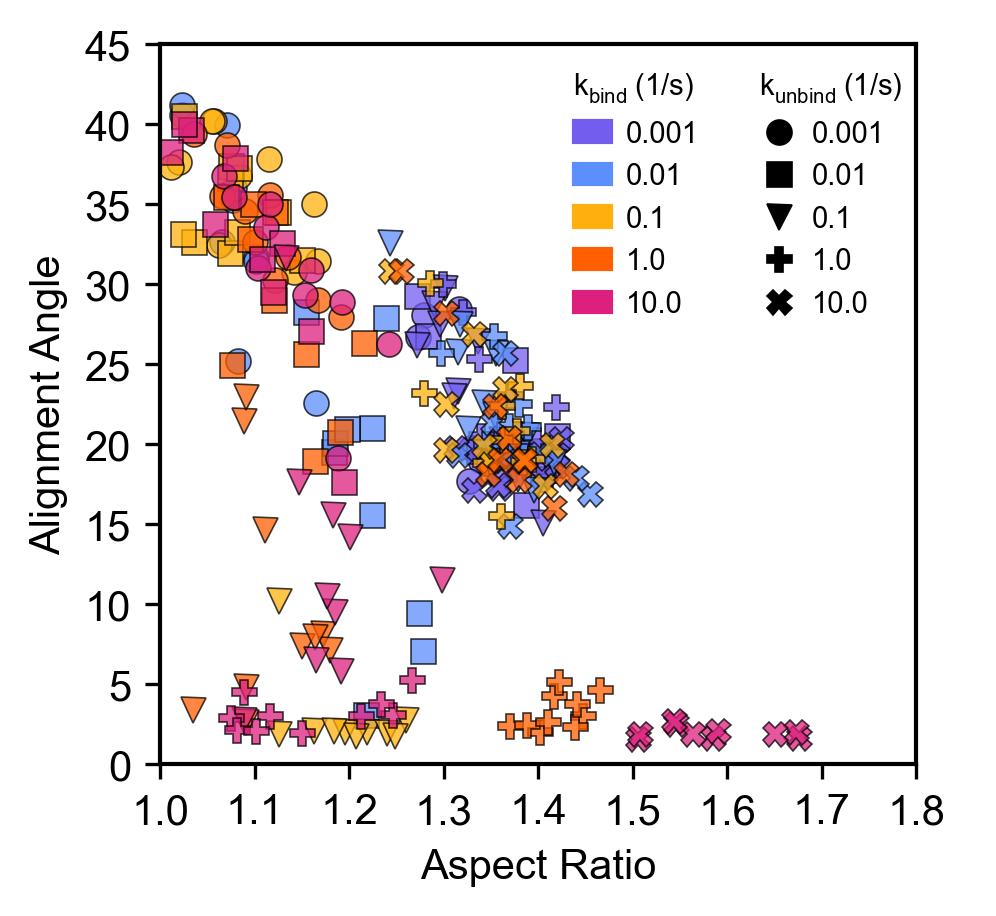

In [56]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']
ARList = plotdf['ARList'].values
angleList = plotdf['angleList'].values
labelvec = ['0.001', '0.01', '0.1', '1.0', '10.0']
markerlist = ['o', 's', 'v', 'P', 'X']

# Figure
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
legcell1 = []
legcell2 = []
for plotcounter in range(0,5):
    for val in range(0,5):
        Rval = plotcounter*len(kunbindvec) + val
        x = axvec.plot(ARList[Rval],angleList[Rval],marker=markerlist[val],linewidth=0.0,color=colorlist[plotcounter],alpha=0.75,markeredgecolor='black',markeredgewidth=0.4)
        legcell1.append(x[0]);
    legcell2.append(x[0]);
axvec.set_xlabel('Aspect Ratio') 
axvec.set_xlim([1.0,1.8]) 
axvec.set_xticks([1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8]) 
axvec.set_ylabel('Alignment Angle') 
axvec.set_ylim([0,45]) 
axvec.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40, 45]) 
kbind_colors = [mpatches.Patch(color=colorlist[i]) for i in range(len(kbindvec))]
kunbind_shapes = [plt.plot([], [], markerlist[i], markerfacecolor='black', markeredgecolor='black',markeredgewidth=0.4)[0] for i in range(len(kunbindvec))]
title1, = axvec.plot([], [], ' ')
title2, = axvec.plot([], [], ' ')
new_handles = [title1, kbind_colors[0], kbind_colors[1], kbind_colors[2], kbind_colors[3], kbind_colors[4],
               title2, kunbind_shapes[0], kunbind_shapes[1], kunbind_shapes[2], kunbind_shapes[3], kunbind_shapes[4]]
new_labels = [r"$k_{bind} \: (1/s)$", labelvec[0], labelvec[1], labelvec[2], labelvec[3], labelvec[4], 
              r"$k_{unbind} \: (1/s)$", labelvec[0], labelvec[1], labelvec[2], labelvec[3], labelvec[4]]
leg = axvec.legend(new_handles, new_labels, ncol=2, fontsize=7.0, frameon=False, 
                  loc='upper center', bbox_to_anchor=(0.8, 1.0), labelspacing=0.5, columnspacing = 0.5, handletextpad = 0.5, handlelength = 1.25)
for item, label in zip(leg.legend_handles, leg.texts):
    if label._text  in [r"$k_{bind} \: (1/s)$", r"$k_{unbind} \: (1/s)$"]:
        width=item.get_window_extent(fig.canvas.get_renderer()).width
        label.set_ha('left')
        label.set_position((-6*width,0))

plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_8E.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_8E.pdf', dpi=300, bbox_inches='tight')

## Plot Figure 8F

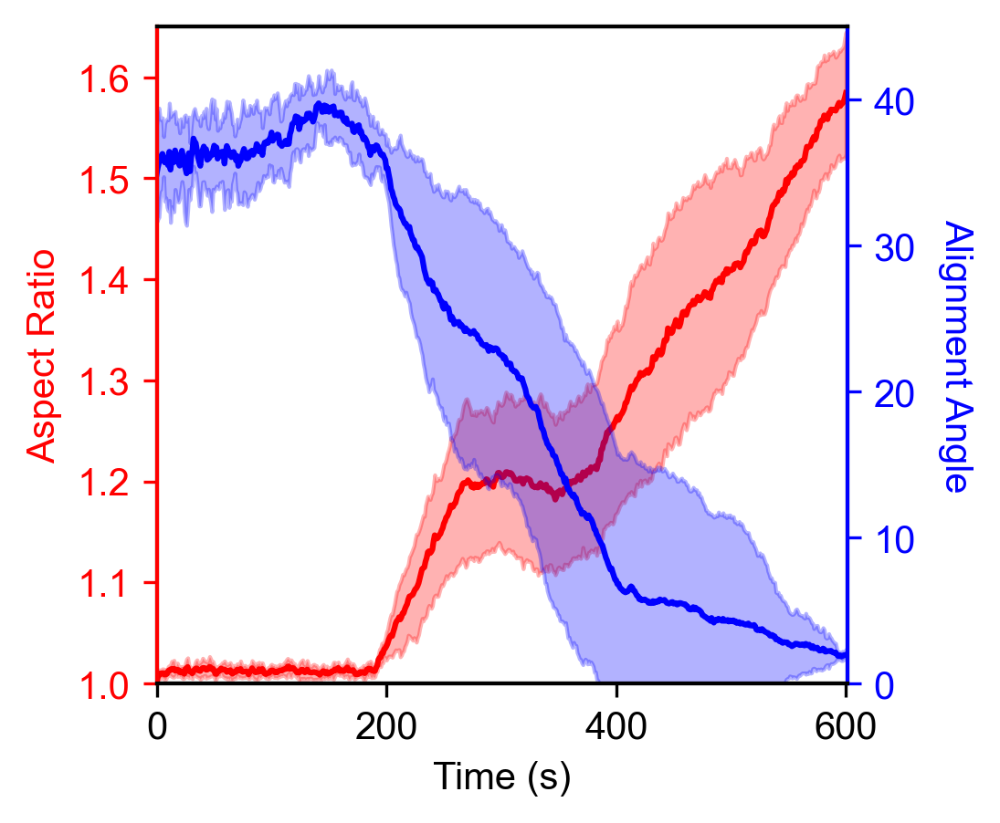

In [57]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']
Rval = 24
MeanlistAR = plotdf['MeanlistAR'][Rval]
StdlistAR = plotdf['StdlistAR'][Rval]
angleMean = plotdf['angleMean'][Rval]
angleStd = plotdf['angleStd'][Rval]

# Figure 
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=False, sharey=False)
x = axvec
for plotcounter in range(0,nr):
    legcell = []
    for val in range(0,nc):
        ax1 = axvec
        ax1.plot(Timevec,MeanlistAR,color='red')
        ax1.fill_between(Timevec,MeanlistAR-StdlistAR,MeanlistAR+StdlistAR,color='red',alpha=0.3)
        ax1.set_yticks([1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6])
        ax1.set_ylim([1.0,1.65])
        ax1.set_ylabel('Aspect Ratio', color='red')
        ax1.tick_params(axis='y', colors='red')
        ax2 = ax1.twinx()
        ax2.plot(Timevec,angleMean,color='blue')
        ax2.fill_between(Timevec,angleMean-angleStd,angleMean+angleStd,color='blue',alpha=0.3)
        ax2.set_yticks([0, 10, 20, 30, 40])
        ax2.set_ylim([0,45])
        ax2.set_ylabel('Alignment Angle', rotation=270, labelpad=15, color='blue')
        ax2.tick_params(axis='y', colors='blue')
        ax2.spines['left'].set_color('red')
        ax2.spines['right'].set_color('blue')
        axvec.set_xlabel('Time (s)') 
        axvec.set_xlim([startpos,endpos]) 
        axvec.set_xticks([0, 200, 400, 600])
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.6, 
                    hspace=0.4)
plt.savefig('Figure_8F.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_8F.pdf', dpi=300, bbox_inches='tight')

# Figure S1

## Figure S1A Data

In [58]:
# Load all replicates
# Take mean and std
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

jobfoldername = 'inputfiles' 
BRepulsion = ['100', '200', '400']
Nreps = 10
MeanlistAR = []
StdlistAR = []

dirpath = 'Figure_S1/Figure_S1A'
for Rval in range(0, len(BRepulsion)):
        AspectRatio = []
        for repid in range(0,Nreps):
            fvar = dirpath+'/outputfiles/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df = pd.read_csv(fvar,index_col=0)
            Timevec = df.iloc[0].to_numpy()
            a1 = df.iloc[1].to_numpy()
            a2 = df.iloc[2].to_numpy()
            a3 = df.iloc[3].to_numpy()
            AspectRatio_tmp = np.zeros(len(Timevec))
            for time in range(0,len(Timevec)):
                a = max(a1[time], a2[time], a3[time])
                c = min(a1[time], a2[time], a3[time])
                AspectRatio_tmp[time] = a/c
            AspectRatio.append(AspectRatio_tmp)
            print('R_'+str(Rval)+'_r_'+str(repid))
            print('Aspect Ratio at t=600s for Replicate ' + str(repid) + ' : ',AspectRatio_tmp[600])
            print('---')
        AspectRatio = np.array(AspectRatio)
        MeanlistAR.append(np.mean(AspectRatio,0))
        StdlistAR.append(np.std(AspectRatio,0))
        print('R_'+str(Rval)+' - Average Aspect Ratio at t=600s: ',np.mean(AspectRatio,0)[600])
        print('------------------')
Timevec = df.iloc[0].to_numpy()

R_0_r_0
Aspect Ratio at t=600s for Replicate 0 :  1.1912799054252887
---
R_0_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.2108816956411783
---
R_0_r_2
Aspect Ratio at t=600s for Replicate 2 :  1.1110723740377133
---
R_0_r_3
Aspect Ratio at t=600s for Replicate 3 :  1.2096521119656618
---
R_0_r_4
Aspect Ratio at t=600s for Replicate 4 :  1.2032779363784665
---
R_0_r_5
Aspect Ratio at t=600s for Replicate 5 :  1.1097212678345938
---
R_0_r_6
Aspect Ratio at t=600s for Replicate 6 :  1.2240855212141353
---
R_0_r_7
Aspect Ratio at t=600s for Replicate 7 :  1.1734086548569505
---
R_0_r_8
Aspect Ratio at t=600s for Replicate 8 :  1.1791608375090321
---
R_0_r_9
Aspect Ratio at t=600s for Replicate 9 :  1.22922230844191
---
R_0 - Average Aspect Ratio at t=600s:  1.1841762613304931
------------------
R_1_r_0
Aspect Ratio at t=600s for Replicate 0 :  1.471109182103469
---
R_1_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.410455717187979
---
R_1_r_2
Aspect Ratio at t=600s for Replicate 2 :  1

## Plot Figure S1A

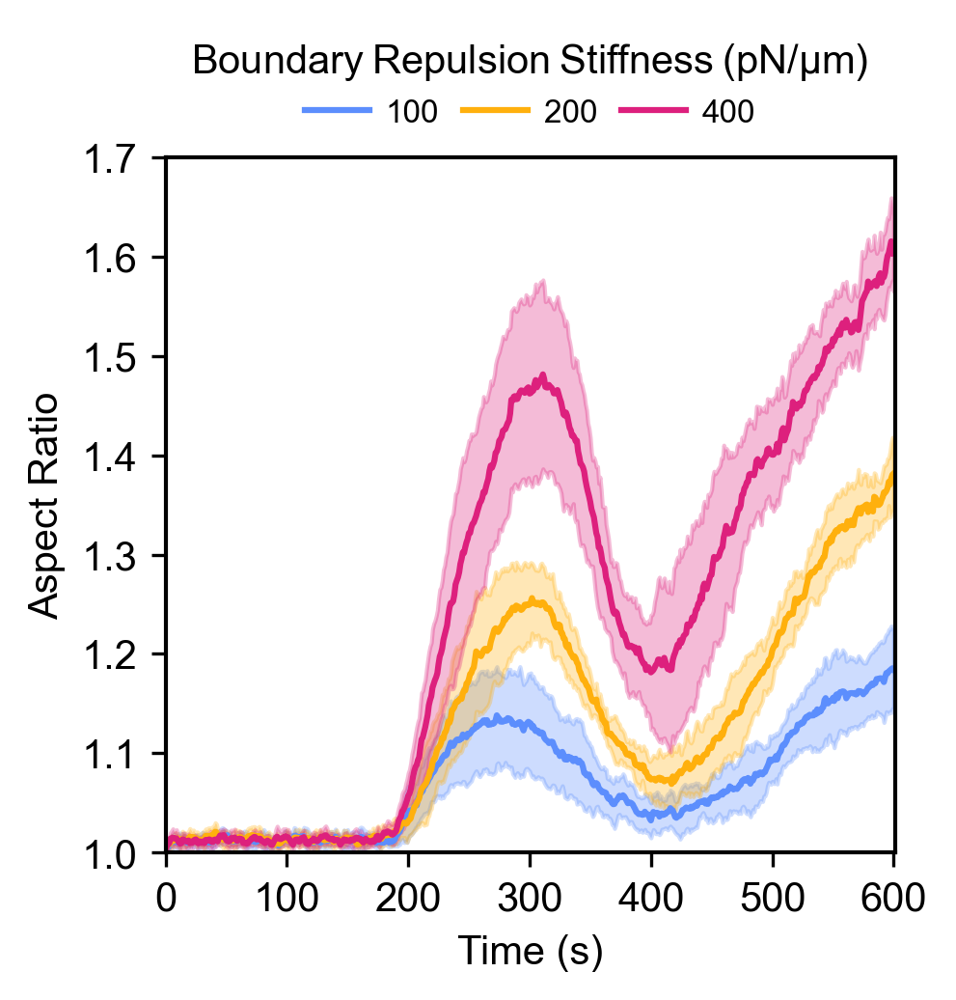

In [59]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#5C8EFD', '#FFB00D', '#DD207D'] 
BRepulsion = ['100', '200', '400']

# Aspect Ratio Figure
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
for plotcounter in range(0,nr):
    legcell = []
    for val in range(0,len(BRepulsion)):
        x = axvec.plot(Timevec,MeanlistAR[val],color=colorlist[val])
        legcell.append(x[0]);
        axvec.fill_between(Timevec,MeanlistAR[val]-StdlistAR[val],MeanlistAR[val]+StdlistAR[val],color=colorlist[val],alpha=0.3)
axvec.set_xlabel('Time (s)') 
axvec.set_xlim([0,601])
axvec.set_xticks([0,100,200,300,400,500,600])  
axvec.set_ylabel('Aspect Ratio') 
axvec.set_ylim([1.0,1.7]) 
leg = fig.legend(legcell, BRepulsion,title=r"$Boundary \: Repulsion \: Stiffness \: (pN/µm)$",ncol=3,fontsize=8,frameon=False,
                loc='lower center', bbox_transform=axvec.transAxes, bbox_to_anchor=(0.5, 1.0), 
                labelspacing = 0.5, columnspacing = 0.75, handletextpad = 0.5, handlelength = 2.0)
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_S1A.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_S1A.pdf', dpi=300, bbox_inches='tight')

## Figure S1B Data

In [60]:
# Load all replicates
# Take mean and std
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

jobfoldername = 'inputfiles' 
BRepulsion = ['100', '200', '400']
Nreps = 10
MeanlistAR = []
StdlistAR = []

dirpath = 'Figure_S1/Figure_S1B'
for Rval in range(0, len(BRepulsion)):
        AspectRatio = []
        for repid in range(0,Nreps):
            fvar = dirpath+'/outputfiles/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df = pd.read_csv(fvar,index_col=0)
            Timevec = df.iloc[0].to_numpy()
            a1 = df.iloc[1].to_numpy()
            a2 = df.iloc[2].to_numpy()
            a3 = df.iloc[3].to_numpy()
            AspectRatio_tmp = np.zeros(len(Timevec))
            for time in range(0,len(Timevec)):
                a = max(a1[time], a2[time], a3[time])
                c = min(a1[time], a2[time], a3[time])
                AspectRatio_tmp[time] = a/c
            AspectRatio.append(AspectRatio_tmp)
            print('R_'+str(Rval)+'_r_'+str(repid))
            print('Aspect Ratio at t=600s for Replicate ' + str(repid) + ' : ',AspectRatio_tmp[600])
            print('---')
        AspectRatio = np.array(AspectRatio)
        MeanlistAR.append(np.mean(AspectRatio,0))
        StdlistAR.append(np.std(AspectRatio,0))
        print('R_'+str(Rval)+' - Average Aspect Ratio at t=600s: ',np.mean(AspectRatio,0)[600])
        print('------------------')
Timevec = df.iloc[0].to_numpy()

R_0_r_0
Aspect Ratio at t=600s for Replicate 0 :  1.0968344860120127
---
R_0_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.1675292727657471
---
R_0_r_2
Aspect Ratio at t=600s for Replicate 2 :  1.1989678551630807
---
R_0_r_3
Aspect Ratio at t=600s for Replicate 3 :  1.0293240208312384
---
R_0_r_4
Aspect Ratio at t=600s for Replicate 4 :  1.0255948593453
---
R_0_r_5
Aspect Ratio at t=600s for Replicate 5 :  1.0797612926995281
---
R_0_r_6
Aspect Ratio at t=600s for Replicate 6 :  1.1178959245627704
---
R_0_r_7
Aspect Ratio at t=600s for Replicate 7 :  1.0298118907379437
---
R_0_r_8
Aspect Ratio at t=600s for Replicate 8 :  1.11990660427379
---
R_0_r_9
Aspect Ratio at t=600s for Replicate 9 :  1.1942861307645842
---
R_0 - Average Aspect Ratio at t=600s:  1.1059912337155997
------------------
R_1_r_0
Aspect Ratio at t=600s for Replicate 0 :  1.0360399039508346
---
R_1_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.0256720309817673
---
R_1_r_2
Aspect Ratio at t=600s for Replicate 2 :  1.

## Plot Figure S1B

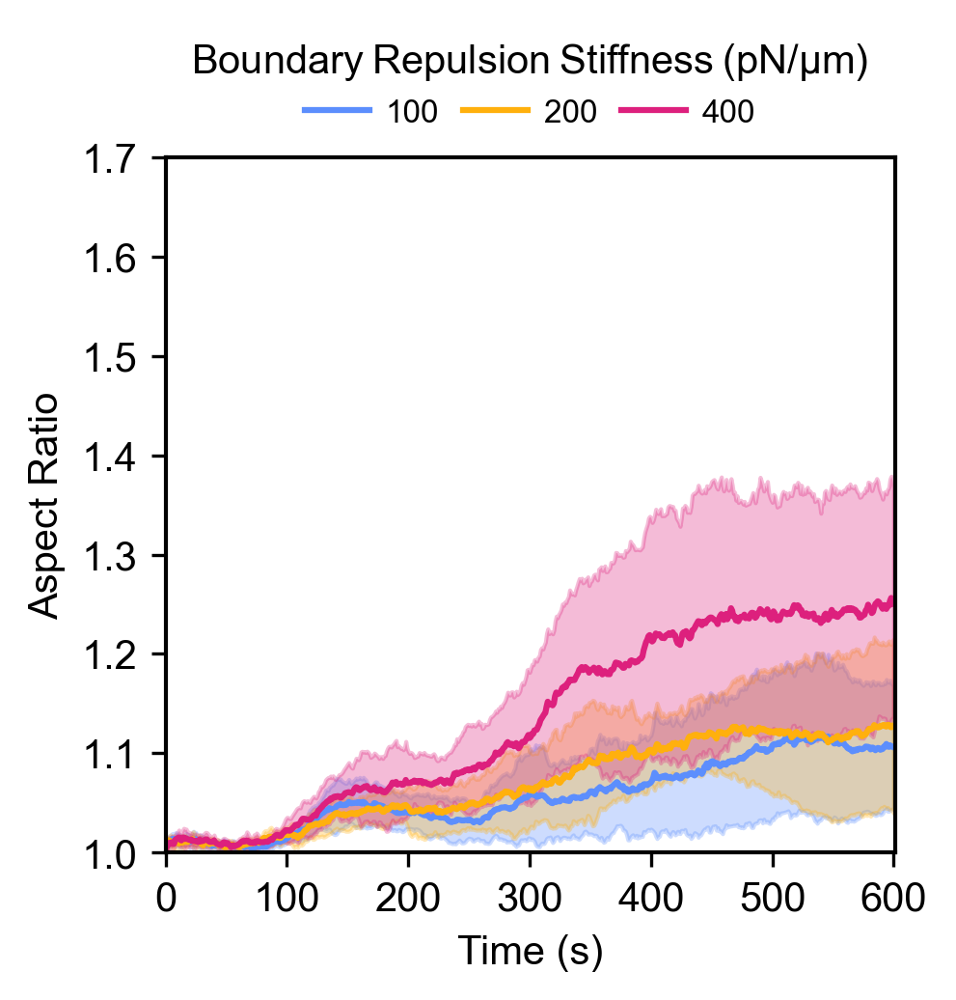

In [61]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#5C8EFD', '#FFB00D', '#DD207D'] 
BRepulsion_Reduced = ['100', '200', '400']

# Aspect Ratio Figure
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(3,3), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
for plotcounter in range(0,nr):
    legcell = []
    for val in range(0,len(BRepulsion_Reduced)):
        x = axvec.plot(Timevec,MeanlistAR[val],color=colorlist[val])
        legcell.append(x[0]);
        axvec.fill_between(Timevec,MeanlistAR[val]-StdlistAR[val],MeanlistAR[val]+StdlistAR[val],color=colorlist[val],alpha=0.3)
axvec.set_xlabel('Time (s)') 
axvec.set_ylabel('Aspect Ratio') 
axvec.set_xlim([0,601]) 
axvec.set_ylim([1.0,1.7]) 
axvec.set_xticks([0,100,200,300,400,500,600]) 
leg = fig.legend(legcell, BRepulsion_Reduced,title=r"$Boundary \: Repulsion \: Stiffness \: (pN/µm)$",ncol=3,fontsize=8,frameon=False,
                loc='lower center', bbox_transform=axvec.transAxes, bbox_to_anchor=(0.5, 1.0), 
                labelspacing = 0.5, columnspacing = 0.75, handletextpad = 0.5, handlelength = 2.0)
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_S1B.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_S1B.pdf', dpi=300, bbox_inches='tight')

# Figure S2

## Figure S2B Data

Actin-Covered Surface Area Fraction Time Series for Tetravalent Crosslinkers

In [62]:
# Assemble data for figure

# Load all replicates
# Take mean and std
# Row 0 - Time
# Row 1 - fraction of occupied triangles 
jobfoldername = 'inputfiles' 
kbindvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1] 
kunbindvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
Nreps = 10
Meanlist = []
Stdlist = []
dirpath = 'Figure_S2'
for koniter, kbind in enumerate(kbindvec):
    for koffiter, kunbind in enumerate (kunbindvec):
        Row1 = []
        Rval = (koniter)*len(kunbindvec)+(koffiter)
        for repid in range(0, Nreps):
            fvar = dirpath+'/outputfiles/FO_Output'+'/FO_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df = pd.read_csv(fvar, index_col = 0)
            datavec = df.iloc[1].to_numpy()
            Row1.append(datavec)
            print('R_'+str(Rval)+'_r_'+str(repid))
            print('---')
        Row1 = np.array(Row1)
        Meanlist.append(np.mean(Row1, 0))
        Stdlist.append(np.std(Row1, 0))
Timevec = df.iloc[0].to_numpy()

R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
R_6_r_0
---
R_6_r_1
---
R_6_r_2
---
R_6_r_3
---
R_6_r_4
---
R_6_r_5
---
R_6_r_6
---
R_6_r_7
---
R_6_r_8
---
R_6_r_9
---
R_7_r_0
---
R_7_r_1
---
R_7_r_2
---
R_7_r_3
---
R_7_r_4
---
R_7_r_5
---
R_7_r_6
---
R_7_r_7
---
R_7_r_8
---
R_7_r_9
---
R_8_r_0
---
R_8_r_1
---
R_8_r_2
---
R_8_

## Plot Figure S2B

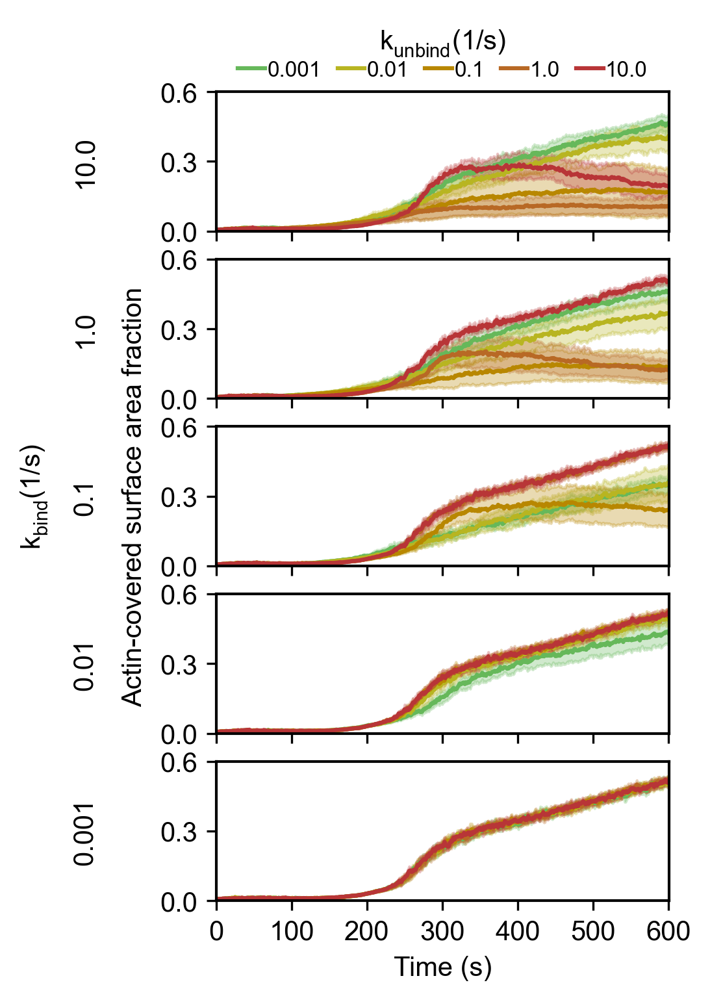

In [63]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#66B85A','#B8B521','#B88700','#B86925','#B83537']
labelvec = ['0.001', '0.01', '0.1', '1.0', '10.0'] 

nr = 5; nc = 1
fig, axvec = plt.subplots(nrows = nr, ncols = nc, figsize = (2.5, 5.0), 
                          dpi = 300, facecolor = 'w', edgecolor = 'k', sharex = False, sharey = False)

# Figure S2B
for plotcounter in range(0, nr):
    legcell = []
    for val in range(0, nr):
        Rval = plotcounter*len(kunbindvec) + val
        ax = axvec[nr-plotcounter-1]
        x = ax.plot(Timevec, Meanlist[Rval], color = colorlist[val])
        legcell.append(x[0]);
        ax.fill_between(Timevec, Meanlist[Rval]-Stdlist[Rval], Meanlist[Rval]+Stdlist[Rval], 
                        color = colorlist[val], alpha = 0.3)
        ax.set_xlim([0, 601])
        ax.set_ylim([0, 0.6])
        ax.set_xticks([0, 100, 200, 300, 400, 500, 600])
        ax.set_yticks([0, 0.3, 0.6])
        if plotcounter > 0:
            ax.set_xticklabels([])
plt.text(-0.18, 0.5, 'Actin-covered surface area fraction', horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)

axvec[0].legend(legcell, labelvec, title=r"$k_{unbind} (1/s)$",
                 ncol=5, fontsize=8, frameon=False, loc='upper center', bbox_to_anchor=(0.5, 1.6), 
                 labelspacing = 0.1, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)

axvec[4].set_xlabel('Time (s)') 
axvec[0].set_ylabel('10.0', labelpad=23) 
axvec[1].set_ylabel('1.0', labelpad=23) 
axvec[2].set_ylabel('0.1', labelpad=23) 
axvec[3].set_ylabel('0.01', labelpad=23) 
axvec[4].set_ylabel('0.001', labelpad=23) 
plt.text(-0.4, 0.5, r"$k_{bind} (1/s)$", horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)

plt.subplots_adjust(left = 0.05,
                    right = 0.98,
                    bottom = 0.05, 
                    top = 0.88,
                    wspace = 0.25, 
                    hspace = 0.2)

# SAVE FIGURE
plt.savefig('Figure_S2B.png', dpi = 300, bbox_inches = 'tight')
fig.savefig('Figure_S2B.pdf', bbox_inches = 'tight')

## Figure S2C Data

Fraction of Tetravalent Crosslinkers Bound to 0, 1, 2, 3, or 4 Actin Filaments 

In [64]:
# Function to Process Data

def VASP_Fraction(filename, Nreps, *args):
    if len(args):
        tv = args[0]
    # KEY
    # Row 0 Time
    # Row 1 Number of bound crosslinkers MEAN
    # Row 2 Number of bound crosslinkers STD
    # Row 3 Number of filaments per crosslinker MEAN
    # Row 4 Number of filaments per crosslinker STD
    # Row 5 Number of UNIQIUE filaments per crosslinker MEAN
    # Row 6 Number of UNIQUE filaments per crosslinker STD
    # Row 7 Last 5% data Row 5 MEAN
    # Row 8 Last 5% data Row 5 STD
    # Row 9 Number of crosslinkers bound to 1 filament MEAN
    # Row 10 Number of crosslinkers bound to 1 filament STD
    # Row 11 Number of crosslinkers bound to 2 filaments MEAN
    # Row 12 Number of crosslinkers bound to 2 filaments STD
    # Row 13 Number of crosslinkers bound to 3 filaments MEAN (Not Used for mini-Lpd)
    # Row 14 Number of crosslinkers bound to 3 filaments STD (Not Used for mini-Lpd)
    # Row 15 Number of crosslinkers bound to 4 filaments MEAN (Not Used for mini-Lpd)
    # Row 16 Number of crosslinkers bound to 4 filaments STD (Not Used for mini-Lpd)
    # Row 17 5% data Number of crosslinkers bound to N \in [1, 4] filaments MEAN
    # Row 18 5% data  Number of crosslinkers bound to N \in [1, 4] filaments STD
    
    Row1 = []
    Row2 = []
    Row3 = []
    Row4 = []
    Row5 = []
    Row6 = []
    Row7 = []
    Row8 = []
    Row17 = []
    Row18 = []
    bar_data_1 = np.array([])
    bar_data_2 = np.array([])
    bar_data_3 = np.array([])
    bar_data_4 = np.array([])

    dirpath = 'Figure_S2'
    for repid in range(0, Nreps):
        print('R_'+str(Rval)+'_r_'+str(repid))
        print('---')
        fvar = dirpath+filename+str(repid)+'.csv'
        df = pd.read_csv(fvar, index_col = 0)
            
        Row1.append(df.iloc[1].to_numpy())
        Row2.append(df.iloc[2].to_numpy())
        Row3.append(df.iloc[3].to_numpy())
        Row4.append(df.iloc[4].to_numpy())
        Row5.append(df.iloc[5].to_numpy())
        Row6.append(df.iloc[6].to_numpy())
        Row7.append(df.iloc[7].to_numpy())
        Row8.append(df.iloc[8].to_numpy())
        Row9 = df.iloc[9].to_numpy()
        Row11 = df.iloc[11].to_numpy()
        Row13 = df.iloc[13].to_numpy()
        Row15 = df.iloc[15].to_numpy()
        startpos = int(0.95*len(Row9))
        endpos = int(len(Row9))
        bar_data_1 = np.append(bar_data_1, (Row9[startpos:endpos]/tv))
        bar_data_2 = np.append(bar_data_2, (Row11[startpos:endpos]/tv))
        bar_data_3 = np.append(bar_data_3, (Row13[startpos:endpos]/tv))
        bar_data_4 = np.append(bar_data_4, (Row15[startpos:endpos]/tv))
        Row17.append(df.iloc[17].to_numpy())
        Row18.append(df.iloc[18].to_numpy())
 
    # Get the number of crosslinkers that are free
    bar_data_0 = 1-bar_data_1-bar_data_2-bar_data_3-bar_data_4
    Mean_0_fil = np.mean(bar_data_0, 0)
    Mean_1_fil = np.mean(bar_data_1, 0)
    Mean_2_fil = np.mean(bar_data_2, 0)
    Mean_3_fil = np.mean(bar_data_3, 0)
    Mean_4_fil = np.mean(bar_data_4, 0)
    Std_0_fil = np.std(bar_data_0, 0)
    Std_1_fil = np.std(bar_data_1, 0)
    Std_2_fil = np.std(bar_data_2, 0)
    Std_3_fil = np.std(bar_data_3, 0)
    Std_4_fil = np.std(bar_data_4, 0)
    return [Mean_0_fil, Mean_1_fil, Mean_2_fil, Mean_3_fil, Mean_4_fil, Std_0_fil, Std_1_fil, Std_2_fil, Std_3_fil, Std_4_fil] 

############################################################################################

# Assemble data for figure

kbindvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1] 
kunbindvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1] 
Nreps = 10
Mean_0_fil = []
Mean_1_fil = []
Mean_2_fil = []
Mean_3_fil = []
Mean_4_fil = []
Std_0_fil = []
Std_1_fil = []
Std_2_fil = []
Std_3_fil = []
Std_4_fil = []
kbindlist = []
kunbindlist = []
jobfoldername = 'inputfiles' 
for kbinditer, kbind in enumerate(kbindvec):
    for kunbinditer, kunbind in enumerate (kunbindvec):
        kbindlist.append(kbind)
        kunbindlist.append(kunbind)
        Rval = (kbinditer)*len(kunbindvec)+(kunbinditer) 
        filename = '/outputfiles/CrosslinkOutput/'+'Crosslink_'+jobfoldername+'_R_'+str(Rval)+'_r_'
        outputlist = VASP_Fraction(filename, Nreps, 1000)
        Mean_0_fil.append(outputlist[0])
        Mean_1_fil.append(outputlist[1])
        Mean_2_fil.append(outputlist[2])
        Mean_3_fil.append(outputlist[3])
        Mean_4_fil.append(outputlist[4])
        Std_0_fil.append(outputlist[5]) 
        Std_1_fil.append(outputlist[6]) 
        Std_2_fil.append(outputlist[7]) 
        Std_3_fil.append(outputlist[8]) 
        Std_4_fil.append(outputlist[9]) 

bardf = pd.DataFrame({'kbind':kbindlist, 'kunbind':kunbindlist,
                        '0':Mean_0_fil, '1':Mean_1_fil,
                        '2':Mean_2_fil, '3':Mean_3_fil,
                        '4':Mean_4_fil}) 
stddf = pd.DataFrame({'kbind':kbindlist, 'kunbind':kunbindlist,
                        '0':Std_0_fil, '1':Std_1_fil,
                        '2':Std_2_fil, '3':Std_3_fil,
                        '4':Std_4_fil}) 

cumarray = np.zeros((10, len(Mean_0_fil))) 
cumarray[0][:] = Mean_0_fil[:]
cumarray[1][:] = cumarray[0][:]+Mean_1_fil
cumarray[2][:] = cumarray[1][:]+Mean_2_fil
cumarray[3][:] = cumarray[2][:]+Mean_3_fil
cumarray[4][:] = cumarray[3][:]+Mean_4_fil

R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
R_6_r_0
---
R_6_r_1
---
R_6_r_2
---
R_6_r_3
---
R_6_r_4
---
R_6_r_5
---
R_6_r_6
---
R_6_r_7
---
R_6_r_8
---
R_6_r_9
---
R_7_r_0
---
R_7_r_1
---
R_7_r_2
---
R_7_r_3
---
R_7_r_4
---
R_7_r_5
---
R_7_r_6
---
R_7_r_7
---
R_7_r_8
---
R_7_r_9
---
R_8_r_0
---
R_8_r_1
---
R_8_r_2
---
R_8_

## Plot Figure S2C

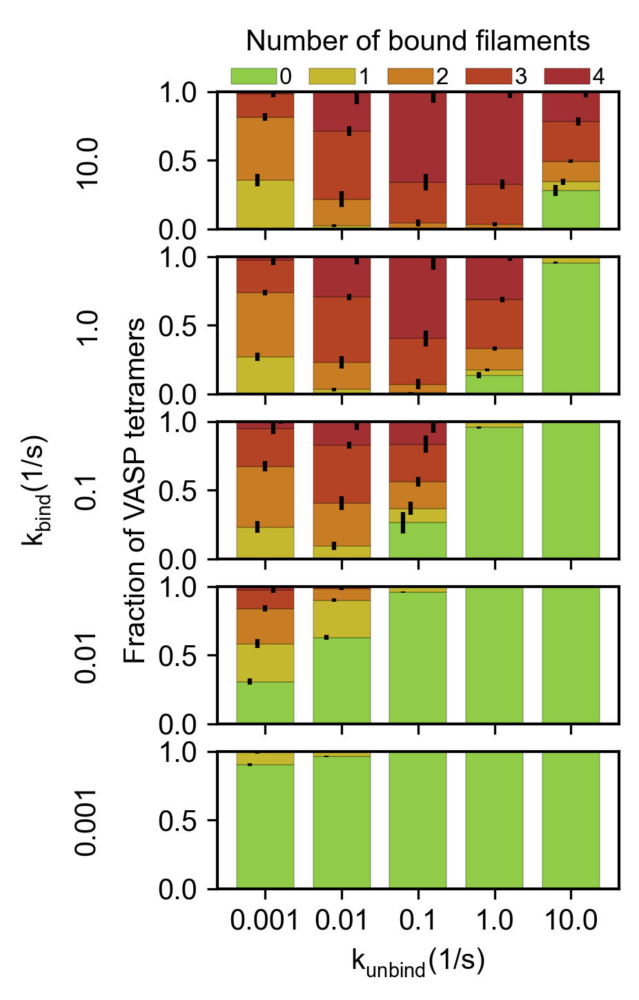

In [65]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
new_cmap = mpl.colors.LinearSegmentedColormap.from_list("", ['#90CC47', '#D7B226', '#BA4820', "#a22f31"])
labelvec = ['0.001', '0.01', '0.1', '1.0', '10.0'] 

# Get figure
nr = 5; nc = 1
fig, axvec = plt.subplots(nrows = nr, ncols = nc, figsize = (2.5, 5.0), 
                          dpi = 300, facecolor = 'w', edgecolor = 'k', sharex = False, sharey = False)

# Figure S2C
for plotcounter in range(0, nr):
    legcell = []
    df = pd.DataFrame()
    stddatavec = []
    Nvalency = 4 
    for val in range(0, len(kunbindvec)):
        Rval = plotcounter*len(kunbindvec)+val
        stddatavec.append(np.array([val-0.2, cumarray[0][Rval], Std_0_fil[Rval]]))
        offset = -0.1
        for pos in range(0, Nvalency):
            if pos == 0:
                stddatavec.append(np.array([val+offset, cumarray[pos+1][Rval], Std_1_fil[Rval]]))
            elif pos == 1:
                stddatavec.append(np.array([val+offset, cumarray[pos+1][Rval], Std_2_fil[Rval]]))
            elif pos == 2:
                stddatavec.append(np.array([val+offset, cumarray[pos+1][Rval], Std_3_fil[Rval]]))
            elif pos == 3:
                stddatavec.append(np.array([val+offset, cumarray[pos+1][Rval], Std_4_fil[Rval]]))
            offset = offset + 0.1
    df = bardf[bardf["kbind"] == kbindvec[plotcounter]].drop(columns = "kbind")
    stddatavec = pd.DataFrame(np.array(stddatavec), columns = ['x', 'mean', 'std'])
    
    # PLOT
    ax = axvec[nr-plotcounter-1]
    df.plot(ax = ax, x = 'kunbind', kind = 'bar', stacked = True, legend = False, 
            width = 0.75,
            cmap = new_cmap, edgecolor = "black", linewidth = 0.1)
    ax.errorbar(stddatavec['x'], stddatavec['mean'], yerr = stddatavec['std'], 
                fmt = 'o', markersize = 0, ecolor = 'black')
    
    # Beautify
    ax.set_xticklabels(labelvec, rotation = 0)
    ax.set_ylim([0, 1])
    ax.set_yticks([0, 0.5, 1.0])
    if plotcounter > 0:
        ax.set_xticklabels([])

axvec[0].legend(['0', '1', '2', '3', '4'], title = 'Number of bound filaments', 
                 ncol=5, fontsize=8, frameon=False, loc='upper center', bbox_to_anchor=(0.5, 1.6), 
                 labelspacing = 0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 2)

plt.text(-0.2, 0.5, 'Fraction of VASP tetramers', horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)
axvec[nr-1].set_xlabel(r"$k_{unbind} (1/s)$")
axvec[1].set_xlabel('')
axvec[0].set_xlabel('')
axvec[0].set_ylabel('10.0', labelpad=20) 
axvec[1].set_ylabel('1.0', labelpad=20) 
axvec[2].set_ylabel('0.1', labelpad=20) 
axvec[3].set_ylabel('0.01', labelpad=20) 
axvec[4].set_ylabel('0.001', labelpad=20) 
plt.text(-0.45, 0.5, r"$k_{bind} (1/s)$", horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)

# SAVE FIGURE
plt.savefig('Figure_S2C.png', dpi = 300, bbox_inches = 'tight')
fig.savefig('Figure_S2C.pdf', bbox_inches = 'tight')

# Figure S3

## Figure S3 Data

Requires the data file "Figure_2D-E_Data.csv" which is generated in the "Figure 2D-E Data" block

## Plot Figure S3

Explained Varience Ratio
[0.66633478 0.24826146 0.04540965 0.03432841 0.0056657 ]
Cumulative Explained Varience Ratio
[0.66633478 0.91459623 0.96000589 0.9943343  1.        ]
Varimax Loadings
[[ 0.96  0.18 -0.09]
 [ 0.21  0.97 -0.03]
 [ 0.13  0.83  0.51]
 [-0.37  0.19  0.9 ]
 [-0.84 -0.19  0.42]]


Silhoutte coefficient
[0.5372404554151644, 0.6811547369841594, 0.7141403204563781, 0.6966692262390607, 0.6623848556980308, 0.6429623717519639, 0.6440470714043501, 0.6610911511188302, 0.5093775608813861]


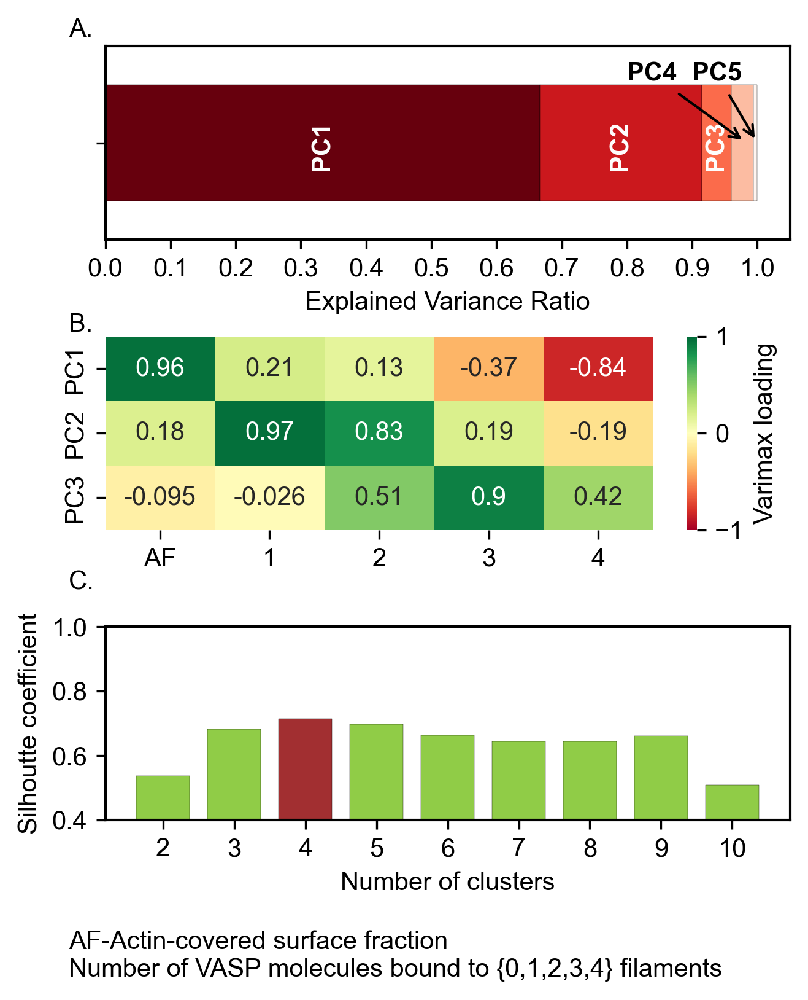

In [66]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})

fig, axvec = plt.subplots(nrows=3, ncols=1,figsize=(4.0,5.0), 
                          dpi=300, facecolor='w', edgecolor='k', sharex=False, sharey=False)

plt.subplots_adjust(left=0.05,
                    right=0.98,
                    bottom=0.15, 
                    top=0.99,
                    wspace=0.2, 
                    hspace=0.5)

pcadf = pd.read_csv('Figure_2D-E_Data.csv',index_col=0)

# Perform PCA on Raw data
pca = PCA()
pca.fit_transform(input_features)

# Get the PCA data 
pcadf = pd.DataFrame(pipe2["preprocessor"].transform(input_features),
                     columns=["component_1", "component_2", "component_3"])

# Plot Figure S3A

print('Explained Varience Ratio')
eratio = pca.explained_variance_ratio_
print(eratio)

print('Cumulative Explained Varience Ratio')
cumeratio = np.cumsum(eratio)
print(np.cumsum(eratio))
locpos = [cumeratio[0]/2, (cumeratio[0]+cumeratio[1])/2, (cumeratio[1]+cumeratio[2])/2]

df = pd.DataFrame(eratio,index=['PC1','PC2','PC3','PC4','PC5'])
df = df.transpose()

ax = axvec[0]

df.plot(ax=ax,kind='barh', stacked=True,legend=False, 
        width = 0.75, cmap='Reds_r',
        edgecolor = "black", linewidth=0.1)
y_offset = 0.1

for i, total in enumerate(locpos):
  ax.text(total, -0.15, 'PC'+str(i+1), ha='center',
          weight='bold',rotation=90, color='white')

ax.annotate('PC4', xy=(0.983,0.0), xytext=(0.8, 0.4), weight='bold',
            arrowprops=dict(facecolor='black', arrowstyle="->"))
ax.annotate('PC5', xy=(1.0,0.0), xytext=(0.9, 0.4), weight='bold',
            arrowprops=dict(facecolor='black', arrowstyle="->"))

ax.set_xlabel('Explained Variance Ratio')
ax.set_xticks(0.1*np.arange(0,11))
ax.set_yticklabels('')

# Plot Figure S3B

ax1 = axvec[1]

from factor_analyzer import FactorAnalyzer
fa = FactorAnalyzer(n_factors=3, method='principal', rotation="varimax")
fa.fit(input_features)

print('Varimax Loadings')
Loadings = fa.loadings_
print(Loadings.round(2))

df = pd.DataFrame(fa.loadings_.T,index=['PC1','PC2','PC3'], columns=['AF','1','2','3','4'])

fig.text(0.0,0.01,'AF-Actin-covered surface fraction')
fig.text(0.0,-0.02,'Number of VASP molecules bound to {0,1,2,3,4} filaments')

sns.heatmap(df, annot=True, cmap='RdYlGn', vmin=-1.0, vmax=1.0, ax=ax1,
    cbar_kws={'label': 'Varimax loading'})

# Plot Figure S3C

silhouette_scores = []
pipe2["preprocessor"]["pca"].n_components = 3
for n in range(2, 11):
    # This set the number of components for pca, but leaves other steps unchanged
    pipe2["clusterer"]["kmeans"].n_clusters = n
    pipe2.fit(input_features)
    model = pipe2.steps
    silhouette_coef = silhouette_score(pipe2["preprocessor"].transform(input_features),
                                       pipe2["clusterer"]["kmeans"].labels_)
    silhouette_scores.append(silhouette_coef)

print('Silhoutte coefficient')
print(silhouette_scores)

ax2 = axvec[2]
ax2.bar(range(2,11),silhouette_scores, 
            color=['#90CC47','#90CC47',"#A22F31",'#90CC47','#90CC47','#90CC47','#90CC47','#90CC47','#90CC47','#90CC47',],
            width = 0.75, edgecolor = "black", linewidth=0.1)
ax2.set_xticks(np.arange(2,11))
ax2.set_ylim([0.4,1.0])
ax2.set_ylabel('Silhoutte coefficient')
ax2.set_xlabel('Number of clusters')

fig.text(0.0,1.0,'A.')
fig.text(0.0,0.68,'B.')
fig.text(0.0,0.4,'C.')

# SAVE FIGURE
plt.savefig('Figure_S3.png', dpi=300, bbox_inches='tight')
fig.savefig('Figure_S3.pdf', bbox_inches='tight')

## Data for Supplementary Table 3

In [67]:
df = pd.read_csv('Figure_2D-E_Data.csv', index_col=0)
for clusterid in range(0,4):
    print('Cluster id = '+str(clusterid))
    X = df.loc[df["Predicted Cluster"] == clusterid]
    Y = (X.loc[:, ["tag"]]).to_numpy()
    Z = [];
    for yiter, y in enumerate(Y):
        a = y[0]
        b = a.split(",")
        Z.append([b[0][1:], b[1][:]])
    if Z:
        Z = np.asarray(Z)
        unique_rows, counts = np.unique(Z, axis=0, return_counts=True)
        result = pd.DataFrame({'kbind': unique_rows[:,0],
                        'kunbind':unique_rows[:,1],
                        'Probability':counts})
        probvec = []
        for index, row in result.iterrows():
            kunbind = float(row['kunbind'])
            Nreps = 10
            Nsnaps = 5
            probvec.append(row['Probability']/(Nreps*Nsnaps))
        result['Probability'] = probvec
        print(result)
        print('------------------')

Cluster id = 0
    kbind kunbind  Probability
0   0.001   0.001          1.0
1   0.001    0.01          1.0
2   0.001     0.1          1.0
3   0.001     1.0          1.0
4   0.001    10.0          1.0
5    0.01    0.01          0.8
6    0.01     0.1          1.0
7    0.01     1.0          1.0
8    0.01    10.0          1.0
9     0.1     1.0          1.0
10    0.1    10.0          1.0
11    1.0    10.0          1.0
------------------
Cluster id = 1
  kbind kunbind  Probability
0  0.01    0.01          0.2
1   0.1     0.1          1.0
2   1.0    0.01          0.1
3   1.0     0.1          1.0
4   1.0     1.0          1.0
5  10.0     0.1          0.9
6  10.0     1.0          1.0
7  10.0    10.0          1.0
------------------
Cluster id = 2
  kbind kunbind  Probability
0  0.01   0.001          0.1
1   0.1   0.001          0.2
2   0.1    0.01          1.0
3   1.0    0.01          0.9
4  10.0    0.01          1.0
5  10.0     0.1          0.1
------------------
Cluster id = 3
  kbind kunbind 

# Figure S4

## Figure S4B Data

In [68]:
# Assemble data for figure

# Load all replicates
# Take mean and std
# Row 0 - Time
# Row 1 - fraction of occupied triangles 
jobfoldername = 'inputfiles'
tensionvec = [4, 8, 12, 16, 20]
viscosityvec = [100, 150, 200, 300, 400]
Nreps = 10
Meanlist = []
Stdlist = []
dirpath = 'Figure_S4'
for tensiter in range(0, len(tensionvec)):
    for visciter in range(0, len(viscosityvec)):
        Row1 = []
        Rval = tensiter*len(viscosityvec)+visciter
        for repid in range(0, Nreps):
            fvar = dirpath+'/outputfiles/FO_Output'+'/FO_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df = pd.read_csv(fvar, index_col = 0)
            datavec = df.iloc[1].to_numpy()
            Row1.append(datavec)
            print('R_'+str(Rval)+'_r_'+str(repid))
            print('---')
        Row1 = np.array(Row1)
        Meanlist.append(np.mean(Row1, 0))
        Stdlist.append(np.std(Row1, 0))
Timevec = df.iloc[0].to_numpy()

R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
R_6_r_0
---
R_6_r_1
---
R_6_r_2
---
R_6_r_3
---
R_6_r_4
---
R_6_r_5
---
R_6_r_6
---
R_6_r_7
---
R_6_r_8
---
R_6_r_9
---
R_7_r_0
---
R_7_r_1
---
R_7_r_2
---
R_7_r_3
---
R_7_r_4
---
R_7_r_5
---
R_7_r_6
---
R_7_r_7
---
R_7_r_8
---
R_7_r_9
---
R_8_r_0
---
R_8_r_1
---
R_8_r_2
---
R_8_

## Plot Figure S4B

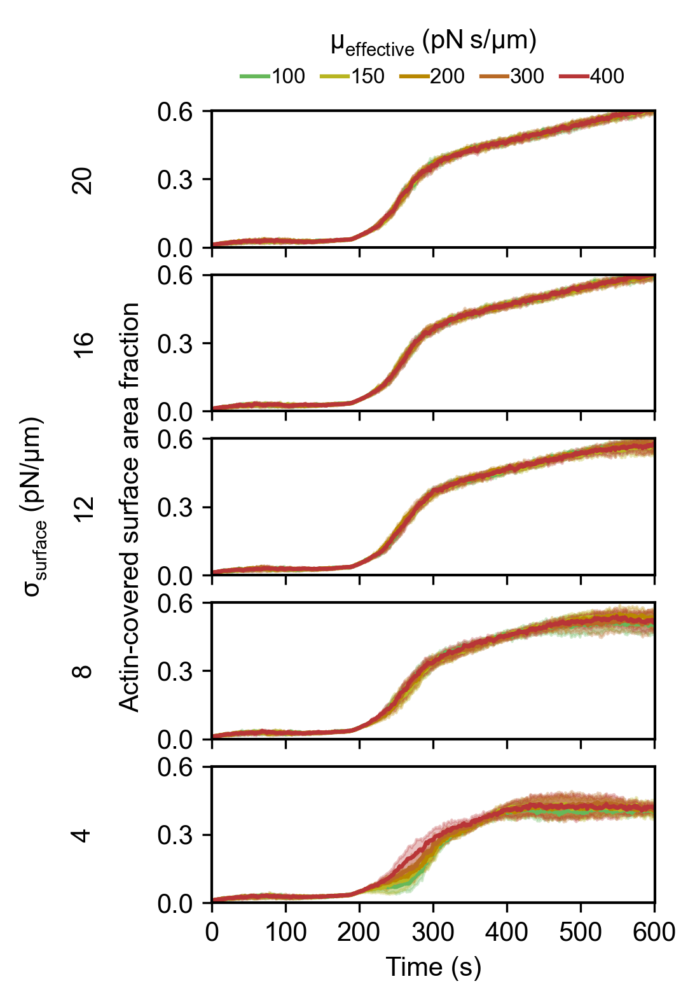

In [69]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#66B85A','#B8B521','#B88700','#B86925','#B83537']
labelvec = ['100', '150', '200', '300', '400'] 

nr = 5; nc = 1
fig, axvec = plt.subplots(nrows = nr, ncols = nc, figsize = (2.5, 5.0), 
                          dpi = 300, facecolor = 'w', edgecolor = 'k', sharex = False, sharey = False)

# Figure S2B
for plotcounter in range(0, nr):
    legcell = []
    for val in range(0, nr):
        Rval = plotcounter*len(kunbindvec) + val
        ax = axvec[nr-plotcounter-1]
        x = ax.plot(Timevec, Meanlist[Rval], color = colorlist[val])
        legcell.append(x[0]);
        ax.fill_between(Timevec, Meanlist[Rval]-Stdlist[Rval], Meanlist[Rval]+Stdlist[Rval], 
                        color = colorlist[val], alpha = 0.3)
        ax.set_xlim([0, 601])
        ax.set_ylim([0, 0.6])
        ax.set_xticks([0, 100, 200, 300, 400, 500, 600])
        ax.set_yticks([0, 0.3, 0.6])
        if plotcounter > 0:
            ax.set_xticklabels([])
plt.text(-0.18, 0.5, 'Actin-covered surface area fraction', horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)

axvec[0].legend(legcell, labelvec, title=r"$\mu_{effective} \: (pN \: s/µm)$",
                 ncol=5, fontsize=8, frameon=False, loc='upper center', bbox_to_anchor=(0.5, 1.75), 
                 labelspacing = 0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)

axvec[4].set_xlabel('Time (s)') 
axvec[0].set_ylabel('20', labelpad=23) 
axvec[1].set_ylabel('16', labelpad=23) 
axvec[2].set_ylabel('12', labelpad=23) 
axvec[3].set_ylabel('8', labelpad=23) 
axvec[4].set_ylabel('4', labelpad=23) 
plt.text(-0.4, 0.5, r"$\sigma_{surface} \: (pN/µm)$", horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)

plt.subplots_adjust(left = 0.05,
                    right = 0.98,
                    bottom = 0.05, 
                    top = 0.88,
                    wspace = 0.25, 
                    hspace = 0.2)

# SAVE FIGURE
plt.savefig('Figure_S4B.png', dpi = 300, bbox_inches = 'tight')
fig.savefig('Figure_S4B.pdf', bbox_inches = 'tight')

## Figure S4C Data

In [70]:
# Load all replicates
# Take mean and std
# plot 5 rows 1 column plots
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

jobfoldername = 'inputfiles' 
viscosityvec = [100, 150, 200, 300, 400]
tensionvec = [4, 8, 12, 16, 20]
Nreps = 10
MeanlistAR = []
StdlistAR = []

dirpath = 'Figure_S4'
for visciter in range(0, len(viscosityvec)):
    for tensiter in range(0, len(tensionvec)):
        AspectRatio = []
        Rval = tensiter*len(viscosityvec)+visciter
        for repid in range(0,Nreps):
            fvar = dirpath+'/outputfiles/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df = pd.read_csv(fvar,index_col=0)
            Timevec = df.iloc[0].to_numpy()
            a1 = df.iloc[1].to_numpy()
            a2 = df.iloc[2].to_numpy()
            a3 = df.iloc[3].to_numpy()
            AspectRatio_tmp = np.zeros(len(Timevec))
            for time in range(0,len(Timevec)):
                a = max(a1[time], a2[time], a3[time])
                c = min(a1[time], a2[time], a3[time])
                AspectRatio_tmp[time] = a/c
            AspectRatio.append(AspectRatio_tmp)
            print('R_'+str(Rval)+'_r_'+str(repid))
            if repid == 0:
                print('Aspect Ratio at t=600s for Gallery Snapshot: ',AspectRatio_tmp[600])
            else:
                print('Aspect Ratio at t=600s for Replicate ' + str(repid) + ' : ',AspectRatio_tmp[600])
            print('---')
        AspectRatio = np.array(AspectRatio)
        MeanlistAR.append(np.mean(AspectRatio,0))
        StdlistAR.append(np.std(AspectRatio,0))
        print('R_'+str(Rval)+' - Average Aspect Ratio at t=600s: ',np.mean(AspectRatio,0)[600])
        print('------------------')
Timevec = df.iloc[0].to_numpy()

R_0_r_0
Aspect Ratio at t=600s for Gallery Snapshot:  1.6654051773791851
---
R_0_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.666480277410815
---
R_0_r_2
Aspect Ratio at t=600s for Replicate 2 :  1.6405144245050585
---
R_0_r_3
Aspect Ratio at t=600s for Replicate 3 :  1.7018062520103945
---
R_0_r_4
Aspect Ratio at t=600s for Replicate 4 :  1.6777347305623393
---
R_0_r_5
Aspect Ratio at t=600s for Replicate 5 :  1.6213985421647785
---
R_0_r_6
Aspect Ratio at t=600s for Replicate 6 :  1.640940983360333
---
R_0_r_7
Aspect Ratio at t=600s for Replicate 7 :  1.7170129179320919
---
R_0_r_8
Aspect Ratio at t=600s for Replicate 8 :  1.5635880767189911
---
R_0_r_9
Aspect Ratio at t=600s for Replicate 9 :  1.6458589101898196
---
R_0 - Average Aspect Ratio at t=600s:  1.6540740292233806
------------------
R_5_r_0
Aspect Ratio at t=600s for Gallery Snapshot:  1.2579550860386148
---
R_5_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.3375313808017453
---
R_5_r_2
Aspect Ratio at t=600s for Replic

## Plot Figure S4C

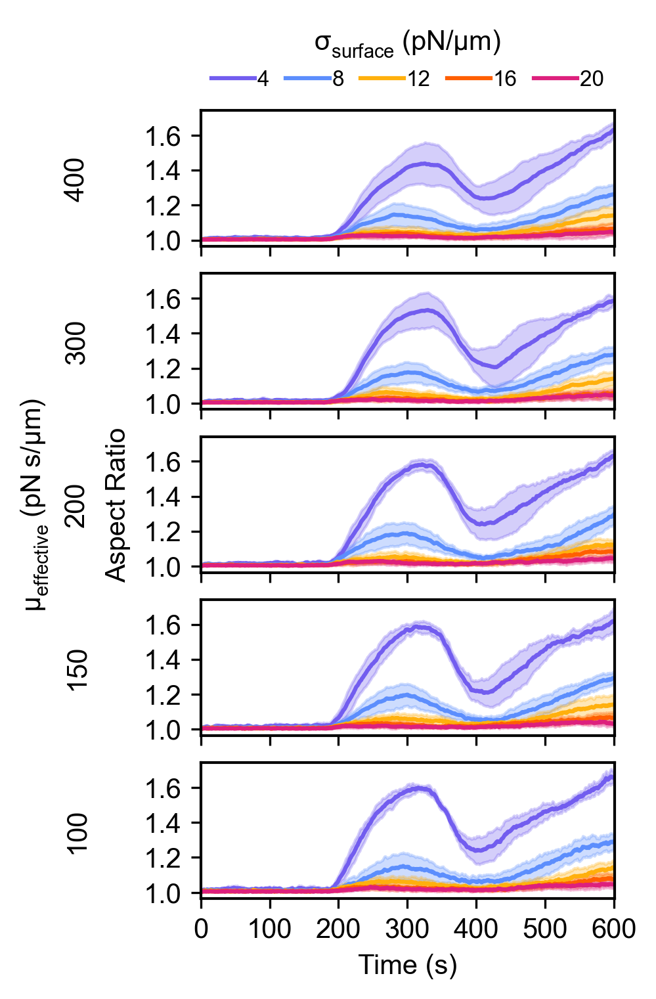

In [71]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']

# Aspect Ratio Figure
nr = 5; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(2.5,5), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
for plotcounter in range(0,nr):
    legcell = []
    for val in range(0,nr):
        Rval = plotcounter*len(viscosityvec) + val
        ax = axvec[nr-plotcounter-1]
        x = ax.plot(Timevec,MeanlistAR[Rval],color=colorlist[val])
        legcell.append(x[0]);
        ax.fill_between(Timevec,MeanlistAR[Rval]-StdlistAR[Rval],MeanlistAR[Rval]+StdlistAR[Rval],color=colorlist[val],alpha=0.3)
plt.text(-0.2, 0.5, 'Aspect Ratio', horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)
axvec[4].set_xlabel('Time (s)') 
axvec[4].set_xlim([0,601]) 
axvec[4].set_yticks([1.0,1.2,1.4,1.6]) 
axvec[4].set_xticks([0,100,200,300,400,500,600]) 
axvec[4].set_ylabel('100', labelpad=20) 
axvec[3].set_ylabel('150', labelpad=20)
axvec[2].set_ylabel('200', labelpad=20)
axvec[1].set_ylabel('300', labelpad=20)
axvec[0].set_ylabel('400', labelpad=20)
plt.text(-0.4, 0.5, r"$\mu_{effective} \: (pN \: s/µm)$", horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)
axvec[0].legend(legcell, tensionvec,title=r"$\sigma_{surface} \: (pN/µm)$",
                 ncol=5,fontsize=8,frameon=False, loc='upper center', bbox_to_anchor=(0.5, 1.75), 
                 labelspacing = 0.5, columnspacing = 0.75, handletextpad = 0.1)
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_S4C.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_S4C.pdf', dpi=300, bbox_inches='tight')

# Figure S5

## Figure S5B Data

In [72]:
# Assemble data for figure

# Load all replicates
# Take mean and std
# Row 0 - Time
# Row 1 - Filament length distribution
jobfoldername = 'inputfiles' 
kcapvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1] 
kuncapvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1] 
Meanlist = []
Stdlist = []
lengthList = []
dirpath = 'Figure_S5/Figure_S5B-C'
for kcapiter, kcap in enumerate(kcapvec):
    for kuncapiter, kuncap in enumerate (kuncapvec):
        Row1 = []
        Rval = (kcapiter)*len(kuncapvec)+(kuncapiter)
        fvar = dirpath+'/outputfiles/FilLengthOutput'+'/Fillength_dist_'+jobfoldername+'R_'+str(Rval)+'.csv'
        df = pd.read_csv(fvar, index_col = 0)
        datavec = df.iloc[-1].to_numpy()
        Row1.append(datavec)
        print('R_'+str(Rval))
        print('---')
        Row1 = np.array(Row1)
        lengthList.append(Row1)
Timevec = np.linspace(0, 600, 601)
Lengthvec = np.linspace(0, 6.5, len(Row1[0])+1)
Lengthvec = Lengthvec[:-1] + (6.5/len(Row1[0]))/2

R_0
---
R_1
---
R_2
---
R_3
---
R_4
---
R_5
---
R_6
---
R_7
---
R_8
---
R_9
---
R_10
---
R_11
---
R_12
---
R_13
---
R_14
---
R_15
---
R_16
---
R_17
---
R_18
---
R_19
---
R_20
---
R_21
---
R_22
---
R_23
---
R_24
---


## Plot Figure S5B

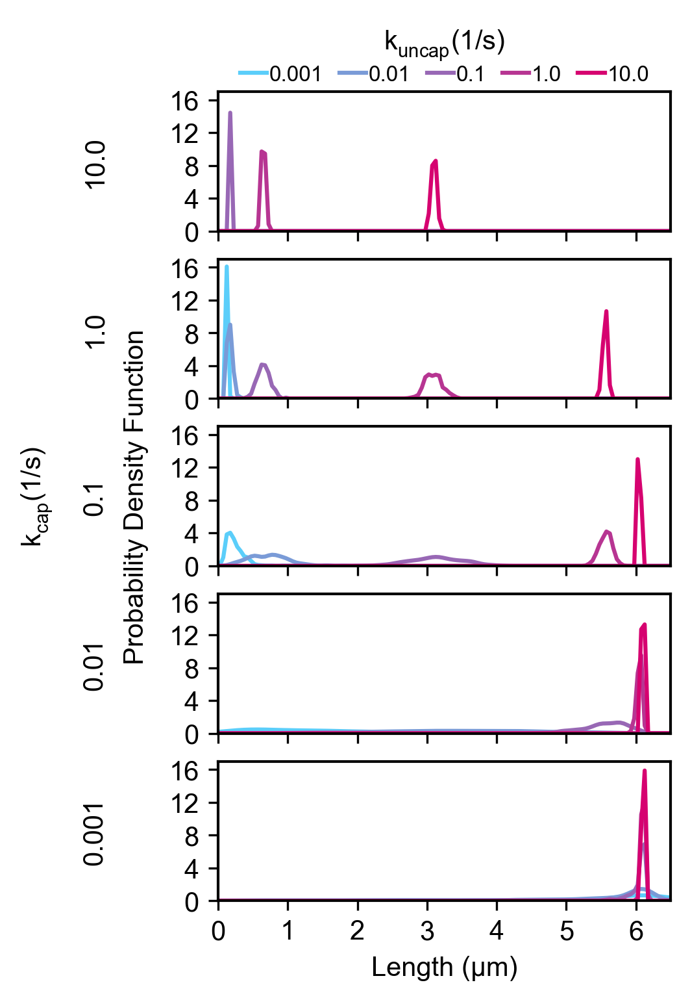

In [73]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
labelvec = ['0.001', '0.01', '0.1', '1.0', '10.0'] 

def colorFader(c1,c2,mix=0): #fade (linear interpolate) from color c1 to color c2
    c1=np.array(mpl.colors.to_rgb(c1))
    c2=np.array(mpl.colors.to_rgb(c2))
    return mpl.colors.to_hex((1-mix)*c1 + mix*c2)

c1 = '#5BCEFA'
c2 = '#D60270'

color_indices = np.linspace(0, 1, len(kcapvec))
colorlist = []
for n in color_indices:
    colorlist.append(colorFader(c1,c2,n))

# Get figure
nr = 5; nc = 1
fig, axvec = plt.subplots(nrows = nr, ncols = nc, figsize = (2.5, 5.0), 
                          dpi = 300, facecolor = 'w', edgecolor = 'k', sharex = False, sharey = False)

# Figure S5B
for plotcounter in range(0, nr):
    legcell = []
    for val in range(0, nr):
        Rval = plotcounter*len(kuncapvec) + val
        ax = axvec[nr-plotcounter-1]
        x = ax.plot(Lengthvec, lengthList[Rval][0], color = colorlist[val])
        legcell.append(x[0]);
        ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7])
        ax.set_yticks([0, 4, 8, 12, 16])
        ax.set_xlim([0, 6.5])
        ax.set_ylim([0, 17])
        if plotcounter > 0:
            ax.set_xticklabels([])
plt.text(-0.18, 0.5, 'Probability Density Function', horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)
axvec[0].legend(legcell, labelvec, title=r"$k_{uncap} (1/s)$",
                 ncol=5, fontsize=8, frameon=False, loc='upper center', bbox_to_anchor=(0.5, 1.6), 
                 labelspacing = 0.1, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)

axvec[4].set_xlabel('Length (µm)') 
axvec[0].set_ylabel('10.0', labelpad=23) 
axvec[1].set_ylabel('1.0', labelpad=23) 
axvec[2].set_ylabel('0.1', labelpad=23) 
axvec[3].set_ylabel('0.01', labelpad=23) 
axvec[4].set_ylabel('0.001', labelpad=23) 
plt.text(-0.4, 0.5, r"$k_{cap} (1/s)$", horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)

plt.subplots_adjust(left = 0.05,
                    right = 0.98,
                    bottom = 0.05, 
                    top = 0.88,
                    wspace = 0.25, 
                    hspace = 0.2)

# SAVE FIGURE
plt.savefig('Figure_S5B.png', dpi = 300, bbox_inches = 'tight')
fig.savefig('Figure_S5B.pdf', bbox_inches = 'tight')

## Figure S5C Data

In [74]:
# Function to Process Data

def VASP_Fraction(filename, Nreps, *args):
    if len(args):
        tv = args[0]
    # KEY
    # Row 0 Time
    # Row 1 Number of bound crosslinkers MEAN
    # Row 2 Number of bound crosslinkers STD
    # Row 3 Number of filaments per crosslinker MEAN
    # Row 4 Number of filaments per crosslinker STD
    # Row 5 Number of UNIQIUE filaments per crosslinker MEAN
    # Row 6 Number of UNIQUE filaments per crosslinker STD
    # Row 7 Last 5% data Row 5 MEAN
    # Row 8 Last 5% data Row 5 STD
    # Row 9 Number of crosslinkers bound to 1 filament MEAN
    # Row 10 Number of crosslinkers bound to 1 filament STD
    # Row 11 Number of crosslinkers bound to 2 filaments MEAN
    # Row 12 Number of crosslinkers bound to 2 filaments STD
    # Row 13 Number of crosslinkers bound to 3 filaments MEAN (Not Used for mini-Lpd)
    # Row 14 Number of crosslinkers bound to 3 filaments STD (Not Used for mini-Lpd)
    # Row 15 Number of crosslinkers bound to 4 filaments MEAN (Not Used for mini-Lpd)
    # Row 16 Number of crosslinkers bound to 4 filaments STD (Not Used for mini-Lpd)
    # Row 17 5% data Number of crosslinkers bound to N \in [1, 4] filaments MEAN
    # Row 18 5% data  Number of crosslinkers bound to N \in [1, 4] filaments STD

    Row1 = []
    Row2 = []
    Row3 = []
    Row4 = []
    Row5 = []
    Row6 = []
    Row7 = []
    Row8 = []
    Row17 = []
    Row18 = []
    bar_data_1 = np.array([])
    bar_data_2 = np.array([])
    bar_data_3 = np.array([])
    bar_data_4 = np.array([])

    dirpath = 'Figure_S5/Figure_S5B-C'
    for repid in range(0, Nreps):
        print('R_'+str(Rval)+'_r_'+str(repid))
        print('---')
        fvar = dirpath+filename+str(repid)+'.csv'
        df = pd.read_csv(fvar, index_col = 0)
            
        Row1.append(df.iloc[1].to_numpy())
        Row2.append(df.iloc[2].to_numpy())
        Row3.append(df.iloc[3].to_numpy())
        Row4.append(df.iloc[4].to_numpy())
        Row5.append(df.iloc[5].to_numpy())
        Row6.append(df.iloc[6].to_numpy())
        Row7.append(df.iloc[7].to_numpy())
        Row8.append(df.iloc[8].to_numpy())
        Row9 = df.iloc[9].to_numpy()
        Row11 = df.iloc[11].to_numpy()
        Row13 = df.iloc[13].to_numpy()
        Row15 = df.iloc[15].to_numpy()
        startpos = int(0.95*len(Row9))
        endpos = int(len(Row9))
        bar_data_1 = np.append(bar_data_1, (Row9[startpos:endpos]/tv))
        bar_data_2 = np.append(bar_data_2, (Row11[startpos:endpos]/tv))
        bar_data_3 = np.append(bar_data_3, (Row13[startpos:endpos]/tv))
        bar_data_4 = np.append(bar_data_4, (Row15[startpos:endpos]/tv))
        Row17.append(df.iloc[17].to_numpy())
        Row18.append(df.iloc[18].to_numpy())
 
    # Get the number of crosslinkers that are free
    bar_data_0 = 1-bar_data_1-bar_data_2-bar_data_3-bar_data_4
    Mean_0_fil = np.mean(bar_data_0, 0)
    Mean_1_fil = np.mean(bar_data_1, 0)
    Mean_2_fil = np.mean(bar_data_2, 0)
    Mean_3_fil = np.mean(bar_data_3, 0)
    Mean_4_fil = np.mean(bar_data_4, 0)
    Std_0_fil = np.std(bar_data_0, 0)
    Std_1_fil = np.std(bar_data_1, 0)
    Std_2_fil = np.std(bar_data_2, 0)
    Std_3_fil = np.std(bar_data_3, 0)
    Std_4_fil = np.std(bar_data_4, 0)
    return [Mean_0_fil, Mean_1_fil, Mean_2_fil, Mean_3_fil, Mean_4_fil, Std_0_fil, Std_1_fil, Std_2_fil, Std_3_fil, Std_4_fil] 

############################################################################################

# Assemble data for figure

kcapvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1] 
kuncapvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
Nreps = 10
Mean_0_fil = []
Mean_1_fil = []
Mean_2_fil = []
Mean_3_fil = []
Mean_4_fil = []
Std_0_fil = []
Std_1_fil = []
Std_2_fil = []
Std_3_fil = []
Std_4_fil = []
kcaplist = []
kuncaplist = []
jobfoldername = 'inputfiles' 
for kcapiter, kcap in enumerate(kcapvec):
    for kuncapiter, kuncap in enumerate (kuncapvec):
        kcaplist.append(kcap)
        kuncaplist.append(kuncap)
        Rval = (kcapiter)*len(kuncapvec)+(kuncapiter) 
        filename = '/outputfiles/CrosslinkOutput/'+'Crosslink_'+jobfoldername+'_R_'+str(Rval)+'_r_'
        outputlist = VASP_Fraction(filename, Nreps, 1000)
        Mean_0_fil.append(outputlist[0])
        Mean_1_fil.append(outputlist[1])
        Mean_2_fil.append(outputlist[2])
        Mean_3_fil.append(outputlist[3])
        Mean_4_fil.append(outputlist[4])
        Std_0_fil.append(outputlist[5]) 
        Std_1_fil.append(outputlist[6]) 
        Std_2_fil.append(outputlist[7]) 
        Std_3_fil.append(outputlist[8]) 
        Std_4_fil.append(outputlist[9]) 

bardf = pd.DataFrame({'kcap':kcaplist, 'kuncap':kuncaplist,
                        '0':Mean_0_fil, '1':Mean_1_fil,
                        '2':Mean_2_fil, '3':Mean_3_fil,
                        '4':Mean_4_fil}) 
stddf = pd.DataFrame({'kcap':kcaplist, 'kuncap':kuncaplist,
                        '0':Std_0_fil, '1':Std_1_fil,
                        '2':Std_2_fil, '3':Std_3_fil,
                        '4':Std_4_fil}) 

cumarray = np.zeros((10, len(Mean_0_fil))) 
cumarray[0][:] = Mean_0_fil[:]
cumarray[1][:] = cumarray[0][:]+Mean_1_fil
cumarray[2][:] = cumarray[1][:]+Mean_2_fil
cumarray[3][:] = cumarray[2][:]+Mean_3_fil
cumarray[4][:] = cumarray[3][:]+Mean_4_fil

R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
R_6_r_0
---
R_6_r_1
---
R_6_r_2
---
R_6_r_3
---
R_6_r_4
---
R_6_r_5
---
R_6_r_6
---
R_6_r_7
---
R_6_r_8
---
R_6_r_9
---
R_7_r_0
---
R_7_r_1
---
R_7_r_2
---
R_7_r_3
---
R_7_r_4
---
R_7_r_5
---
R_7_r_6
---
R_7_r_7
---
R_7_r_8
---
R_7_r_9
---
R_8_r_0
---
R_8_r_1
---
R_8_r_2
---
R_8_

## Plot Figure S5C

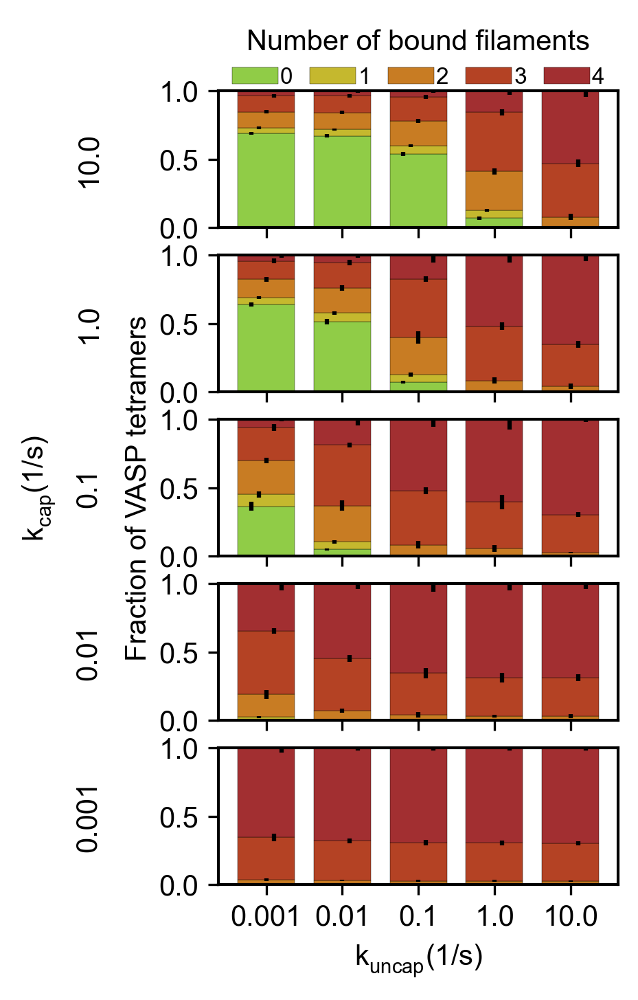

In [75]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
new_cmap = mpl.colors.LinearSegmentedColormap.from_list("", ['#90CC47', '#D7B226', '#BA4820', "#a22f31"])
labelvec = ['0.001', '0.01', '0.1', '1.0', '10.0'] 

# Get figure
nr = 5; nc = 1
fig, axvec = plt.subplots(nrows = nr, ncols = nc, figsize = (2.5, 5.0), 
                          dpi = 300, facecolor = 'w', edgecolor = 'k', sharex = False, sharey = False)

# Figure S5C
for plotcounter in range(0, nr):
    legcell = []
    df = pd.DataFrame()
    stddatavec = []
    Nvalency = 4 
    for val in range(0, len(kuncapvec)):
        Rval = plotcounter*len(kuncapvec)+val
        stddatavec.append(np.array([val-0.2, cumarray[0][Rval], Std_0_fil[Rval]]))
        offset = -0.1
        for pos in range(0, Nvalency):
            if pos == 0:
                stddatavec.append(np.array([val+offset, cumarray[pos+1][Rval], Std_1_fil[Rval]]))
            elif pos == 1:
                stddatavec.append(np.array([val+offset, cumarray[pos+1][Rval], Std_2_fil[Rval]]))
            elif pos == 2:
                stddatavec.append(np.array([val+offset, cumarray[pos+1][Rval], Std_3_fil[Rval]]))
            elif pos == 3:
                stddatavec.append(np.array([val+offset, cumarray[pos+1][Rval], Std_4_fil[Rval]]))
            offset = offset + 0.1
    df = bardf[bardf["kcap"] == kbindvec[plotcounter]].drop(columns = "kcap")
    stddatavec = pd.DataFrame(np.array(stddatavec), columns = ['x', 'mean', 'std'])
    
    # PLOT
    ax = axvec[nr-plotcounter-1]
    df.plot(ax = ax, x = 'kuncap', kind = 'bar', stacked = True, legend = False, 
            width = 0.75,
            cmap = new_cmap, edgecolor = "black", linewidth = 0.1)
    ax.errorbar(stddatavec['x'], stddatavec['mean'], yerr = stddatavec['std'], 
                fmt = 'o', markersize = 0, ecolor = 'black')
    
    # Beautify
    ax.set_xticklabels(labelvec, rotation = 0)
    ax.set_ylim([0, 1])
    ax.set_yticks([0, 0.5, 1.0])
    if plotcounter > 0:
        ax.set_xticklabels([])

axvec[0].legend(['0', '1', '2', '3', '4'], title = 'Number of bound filaments', 
                 ncol=5, fontsize=8, frameon=False, loc='upper center', bbox_to_anchor=(0.5, 1.6), 
                 labelspacing = 0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 2)

plt.text(-0.2, 0.5, 'Fraction of VASP tetramers', horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)
axvec[nr-1].set_xlabel(r"$k_{uncap} (1/s)$")
axvec[1].set_xlabel('')
axvec[0].set_xlabel('')
axvec[0].set_ylabel('10.0', labelpad=20) 
axvec[1].set_ylabel('1.0', labelpad=20) 
axvec[2].set_ylabel('0.1', labelpad=20) 
axvec[3].set_ylabel('0.01', labelpad=20) 
axvec[4].set_ylabel('0.001', labelpad=20) 
plt.text(-0.45, 0.5, r"$k_{cap} (1/s)$", horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)

# SAVE FIGURE
plt.savefig('Figure_S5C.png', dpi = 300, bbox_inches = 'tight')
fig.savefig('Figure_S5C.pdf', bbox_inches = 'tight')

## Figure S5D Data

In [76]:
# Assemble data for figure

# Load all replicates
# Take mean and std
# Row 0 - Time
# Row 1 - Filament length distribution 
jobfoldername = 'inputfiles' 
Meanlist = []
Stdlist = []
lengthList = []
dirpath = 'Figure_S5/Figure_S5D'
for Rval in range(0, 15):
        Row1 = []
        fvar = dirpath+'/outputfiles/FilLengthOutput'+'/Fillength_dist_'+jobfoldername+'R_'+str(Rval)+'.csv'
        df = pd.read_csv(fvar, index_col = 0)
        datavec = df.iloc[-1].to_numpy()
        Row1.append(datavec)
        print('R_'+str(Rval))
        print('---')
        Row1 = np.array(Row1)
        lengthList.append(Row1)

Timevec = np.linspace(0, 600, 601)
Lengthvec = np.linspace(0, 6.5, len(Row1[0])+1)
Lengthvec = Lengthvec[:-1] + (6.5/len(Row1[0]))/2

R_0
---
R_1
---
R_2
---
R_3
---
R_4
---
R_5
---
R_6
---
R_7
---
R_8
---
R_9
---
R_10
---
R_11
---
R_12
---
R_13
---
R_14
---


## Plot Figure S5D

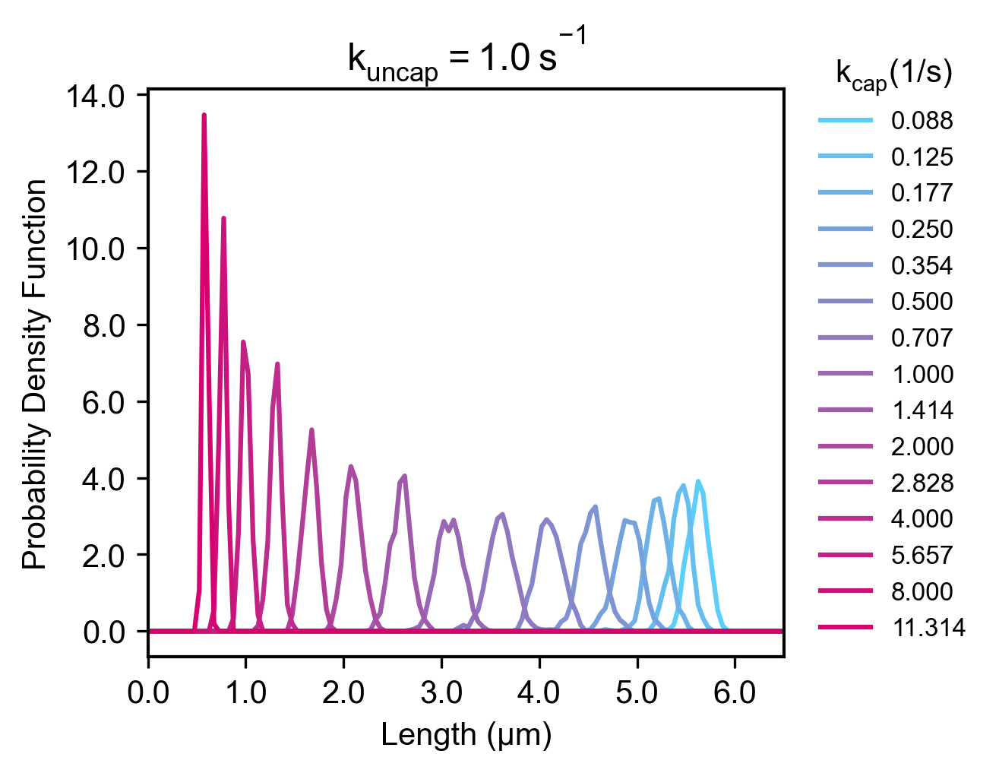

In [77]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
labelvec = ['100', '150', '200', '300', '400'] 
cappingratefinesweep = [2**-3.5, 2**-3, 2**-2.5, 2**-2, 2**-1.5, 2**-1, 2**-0.5, 2**0, 2**0.5, 2**1, 2**1.5, 2**2, 2**2.5, 2**3, 2**3.5]
kcapvec = [ '%.3f' % n for n in cappingratefinesweep ]

def colorFader(c1,c2,mix=0): # Linear interpolation from color c1 to color c2
    c1=np.array(mpl.colors.to_rgb(c1))
    c2=np.array(mpl.colors.to_rgb(c2))
    return mpl.colors.to_hex((1-mix)*c1 + mix*c2)

c1 = '#5BCEFA'
c2 = '#D60270'

color_indices = np.linspace(0, 1, len(kcapvec))
colorlist = []
for n in color_indices:
    colorlist.append(colorFader(c1,c2,n))

# Get figure
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows = nr, ncols = nc, figsize = (3.0, 3.0), 
                          dpi = 300, facecolor = 'w', edgecolor = 'k', sharex = False, sharey = False)

# Figure S5D
for plotcounter in range(0, nr):
    legcell = []
    for Rval in range(0, len(kcapvec)): 
        x = axvec.plot(Lengthvec, lengthList[Rval][0], color = colorlist[Rval])
        legcell.append(x[0]);

leg = fig.legend(legcell, kcapvec,title=r"$k_{cap} (1/s)$",ncol=1,fontsize=8,frameon=False,
                loc='center left', bbox_to_anchor=(1.0, 0.5), labelspacing=0.5)
formatter = ticker.FormatStrFormatter(f'%.{1}f')
axvec.yaxis.set_major_formatter(formatter)
axvec.xaxis.set_major_formatter(formatter)
axvec.set_xticks([0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0])
axvec.set_xlim([0, 6.5])
axvec.set_xlabel('Length (µm)') 
axvec.set_yticks([0.0, 2.0, 4.0, 6.0, 8.0, 10.0, 12.0, 14.0])
axvec.set_ylabel('Probability Density Function') 
plt.title(r"$k_{uncap} = 1.0 \: s^{-1}$")

plt.subplots_adjust(left = 0.05,
                    right = 0.98,
                    bottom = 0.05, 
                    top = 0.88,
                    wspace = 0.25, 
                    hspace = 0.2)

# SAVE FIGURE
plt.savefig('Figure_S5D.png', dpi = 300, bbox_inches = 'tight')
fig.savefig('Figure_S5D.pdf', bbox_inches = 'tight')

# Figure S6

## Figure S6A Data

In [78]:
# Assemble data for figure

# Load all replicates
# Take mean and std
# Row 0 - Time
# Row 1 - Fraction of occupied triangles 
jobfoldername = 'inputfiles' 
kformvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1] 
ksplitvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1] 
Nreps = 10
Meanlist = []
Stdlist = []
dirpath = 'Figure_S6'
for kformiter, kform in enumerate(kformvec):
    for ksplititer, ksplit in enumerate (ksplitvec):
        Row1 = []
        Rval = (kformiter)*len(ksplitvec)+(ksplititer)
        for repid in range(0, Nreps):
            fvar = dirpath+'/outputfiles/FO_Output'+'/FO_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df = pd.read_csv(fvar, index_col = 0)
            datavec = df.iloc[1].to_numpy()
            Row1.append(datavec)
            print('R_'+str(Rval)+'_r_'+str(repid))
            print('---')
        Row1 = np.array(Row1)
        Meanlist.append(np.mean(Row1, 0))
        Stdlist.append(np.std(Row1, 0))
Timevec = df.iloc[0].to_numpy()

R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
R_6_r_0
---
R_6_r_1
---
R_6_r_2
---
R_6_r_3
---
R_6_r_4
---
R_6_r_5
---
R_6_r_6
---
R_6_r_7
---
R_6_r_8
---
R_6_r_9
---
R_7_r_0
---
R_7_r_1
---
R_7_r_2
---
R_7_r_3
---
R_7_r_4
---
R_7_r_5
---
R_7_r_6
---
R_7_r_7
---
R_7_r_8
---
R_7_r_9
---
R_8_r_0
---
R_8_r_1
---
R_8_r_2
---
R_8_

## Plot Figure S6A

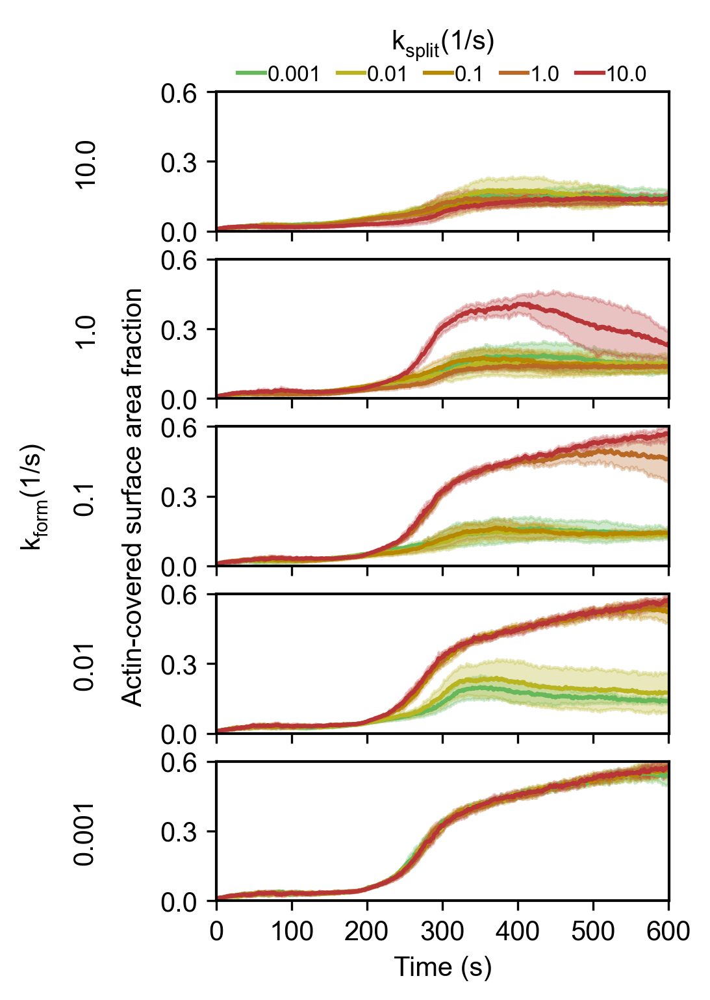

In [79]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#66B85A','#B8B521','#B88700','#B86925','#B83537']
labelvec = ['0.001', '0.01', '0.1', '1.0', '10.0'] 

nr = 5; nc = 1
fig, axvec = plt.subplots(nrows = nr, ncols = nc, figsize = (2.5, 5.0), 
                          dpi = 300, facecolor = 'w', edgecolor = 'k', sharex = False, sharey = False)

# Figure 2B
for plotcounter in range(0, nr):
    legcell = []
    for val in range(0, nr):
        Rval = plotcounter*len(ksplitvec) + val
        ax = axvec[nr-plotcounter-1]
        x = ax.plot(Timevec, Meanlist[Rval], color = colorlist[val])
        legcell.append(x[0]);
        ax.fill_between(Timevec, Meanlist[Rval]-Stdlist[Rval], Meanlist[Rval]+Stdlist[Rval], 
                        color = colorlist[val], alpha = 0.3)
        ax.set_xlim([0, 601])
        ax.set_ylim([0, 0.6])
        ax.set_xticks([0, 100, 200, 300, 400, 500, 600])
        ax.set_yticks([0, 0.3, 0.6])
        if plotcounter > 0:
            ax.set_xticklabels([])
plt.text(-0.18, 0.5, 'Actin-covered surface area fraction', horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)

axvec[0].legend(legcell, labelvec, title=r"$k_{split} (1/s)$",
                 ncol=5, fontsize=8, frameon=False, loc='upper center', bbox_to_anchor=(0.5, 1.6), 
                 labelspacing = 0.1, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)

axvec[4].set_xlabel('Time (s)') 
axvec[0].set_ylabel('10.0', labelpad=23) 
axvec[1].set_ylabel('1.0', labelpad=23) 
axvec[2].set_ylabel('0.1', labelpad=23) 
axvec[3].set_ylabel('0.01', labelpad=23) 
axvec[4].set_ylabel('0.001', labelpad=23) 
plt.text(-0.4, 0.5, r"$k_{form} (1/s)$", horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)

plt.subplots_adjust(left = 0.05,
                    right = 0.98,
                    bottom = 0.05, 
                    top = 0.88,
                    wspace = 0.25, 
                    hspace = 0.2)

# SAVE FIGURE
plt.savefig('Figure_S6A.png', dpi = 300, bbox_inches = 'tight')
fig.savefig('Figure_S6A.pdf', bbox_inches = 'tight')

## Figure S6B Data

In [80]:
# Function to Process Data

def Monomer_Fraction(filename, Nreps, *args):
    if len(args):
        tv = (args[0])
        print(tv)
    # KEY
    # Row 0 Time
    # Row 1 Bound Monomer 0
    # Row 2 Bound Monomer 1
    # Row 3 Bound Monomer 2
    # Row 4 Free Monomer 0
    # Row 5 Free Monomer 1
    # Row 6 Free Monomer 2

    Row1 = []
    Row2 = []
    Row3 = []
    Row4 = []
    Row5 = []
    Row6 = []

    bar_data_bm0 = np.array([])
    bar_data_bm1 = np.array([])
    bar_data_bm2 = np.array([])

    bar_data_fm0 = np.array([])
    bar_data_fm1 = np.array([])
    bar_data_fm2 = np.array([])

    dirpath = 'Figure_S6'
    for repid in range(0, Nreps):
        print('R_'+str(Rval)+'_r_'+str(repid))
        print('---')
        fvar = dirpath+filename+str(repid)+'.csv'
        df = pd.read_csv(fvar, index_col = 0)

        Row1 = df.iloc[1].to_numpy()
        Row2 = df.iloc[2].to_numpy()
        Row3 = df.iloc[3].to_numpy()

        Row4 = df.iloc[4].to_numpy()
        Row5 = df.iloc[5].to_numpy()
        Row6 = df.iloc[6].to_numpy()

        startpos = int(0.95*len(Row1))
        endpos = int(len(Row1))

        bar_data_bm0 = np.append(bar_data_bm0, (Row1[startpos:endpos]/tv))
        bar_data_bm1 = np.append(bar_data_bm1, (Row2[startpos:endpos]/tv))
        bar_data_bm2 = np.append(bar_data_bm2, (Row3[startpos:endpos]/tv))

        bar_data_fm0 = np.append(bar_data_fm0, (Row4[startpos:endpos]/tv))
        bar_data_fm1 = np.append(bar_data_fm1, (Row5[startpos:endpos]/tv))
        bar_data_fm2 = np.append(bar_data_fm2, (Row6[startpos:endpos]/tv))
  
    Mean_bar_data_bm0 = np.mean(bar_data_bm0, 0)
    Mean_bar_data_bm1 = np.mean(bar_data_bm1, 0)
    Mean_bar_data_bm2 = np.mean(bar_data_bm2, 0)

    Mean_bar_data_fm0 = np.mean(bar_data_fm0, 0)
    Mean_bar_data_fm1 = np.mean(bar_data_fm1, 0)
    Mean_bar_data_fm2 = np.mean(bar_data_fm2, 0)

    Std_bar_data_bm0 = np.std(bar_data_bm0, 0)
    Std_bar_data_bm1 = np.std(bar_data_bm1, 0)
    Std_bar_data_bm2 = np.std(bar_data_bm2, 0)

    Std_bar_data_fm0 = np.std(bar_data_fm0, 0)
    Std_bar_data_fm1 = np.std(bar_data_fm1, 0)
    Std_bar_data_fm2 = np.std(bar_data_fm2, 0)

    return [Mean_bar_data_bm0, Mean_bar_data_bm1, Mean_bar_data_bm2, Mean_bar_data_fm0, Mean_bar_data_fm1, Mean_bar_data_fm2, 
            Std_bar_data_bm0, Std_bar_data_bm1, Std_bar_data_bm2, Std_bar_data_fm0, Std_bar_data_fm1, Std_bar_data_fm2]

############################################################################################

# Assemble data for figure

kformvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
ksplitvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
Nreps = 10

Mean_bar_data_bm0 = []
Mean_bar_data_bm1 = []
Mean_bar_data_bm2 = []

Mean_bar_data_fm0 = []
Mean_bar_data_fm1 = []
Mean_bar_data_fm2 = []

Std_bar_data_bm0 = []
Std_bar_data_bm1 = []
Std_bar_data_bm2 = []

Std_bar_data_fm0 = []
Std_bar_data_fm1 = []
Std_bar_data_fm2 = []

kformlist = []
ksplitlist = []
jobfoldername = 'inputfiles' 
for kformiter, kform in enumerate(kformvec):
    for ksplititer, ksplit in enumerate (ksplitvec):
        kformlist.append(kform)
        ksplitlist.append(ksplit)
        Rval = (kformiter)*len(ksplitvec)+(ksplititer)
        filename = '/outputfiles/'+'CrosslinkOutput/'+'Crosslink_'+jobfoldername+'_R_'+str(Rval)+'_r_'
        outputlist = Monomer_Fraction(filename, Nreps, 2000)

        Mean_bar_data_bm0.append(outputlist[0])
        Mean_bar_data_bm1.append(outputlist[1])
        Mean_bar_data_bm2.append(outputlist[2])

        Mean_bar_data_fm0.append(outputlist[3])
        Mean_bar_data_fm1.append(outputlist[4])
        Mean_bar_data_fm2.append(outputlist[5])

        Std_bar_data_bm0.append(outputlist[6])
        Std_bar_data_bm1.append(outputlist[7])
        Std_bar_data_bm2.append(outputlist[8])

        Std_bar_data_fm0.append(outputlist[9])
        Std_bar_data_fm1.append(outputlist[10])
        Std_bar_data_fm2.append(outputlist[11])

bardf = pd.DataFrame({'kform':kformlist, 'ksplit':ksplitlist,
                        'FM0':Mean_bar_data_fm0, 'BM0':Mean_bar_data_bm0,
                        'FM1':Mean_bar_data_fm1, 'BM1':Mean_bar_data_bm1,
                        'FM2':Mean_bar_data_fm2, 'BM2':Mean_bar_data_bm2}) 
stddf = pd.DataFrame({'kform':kformlist, 'ksplit':ksplitlist,
                        'FM0':Std_bar_data_fm0, 'BM0':Std_bar_data_bm0,
                        'FM1':Std_bar_data_fm1, 'BM1':Std_bar_data_bm1,
                        'FM2':Std_bar_data_fm2, 'BM2':Std_bar_data_bm2}) 

cumarray = np.zeros((6, len(Mean_bar_data_bm2)))
cumarray[0][:] = Mean_bar_data_fm0[:]
cumarray[1][:] = cumarray[0][:]+Mean_bar_data_bm0[:]
cumarray[2][:] = cumarray[1][:]+Mean_bar_data_fm1[:]
cumarray[3][:] = cumarray[2][:]+Mean_bar_data_bm1[:]
cumarray[4][:] = cumarray[3][:]+Mean_bar_data_fm2[:]
cumarray[5][:] = cumarray[4][:]+Mean_bar_data_bm2[:]

2000
R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
2000
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
2000
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
2000
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
2000
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
2000
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
2000
R_6_r_0
---
R_6_r_1
---
R_6_r_2
---
R_6_r_3
---
R_6_r_4
---
R_6_r_5
---
R_6_r_6
---
R_6_r_7
---
R_6_r_8
---
R_6_r_9
---
2000
R_7_r_0
---
R_7_r_1
---
R_7_r_2
---
R_7_r_3
---
R_7_r_4
---
R_7_r_5
---
R_7_r_6
---
R_7_r_7
---
R_7_r_8
---
R_7_r_9
---


## Plot Figure S6B

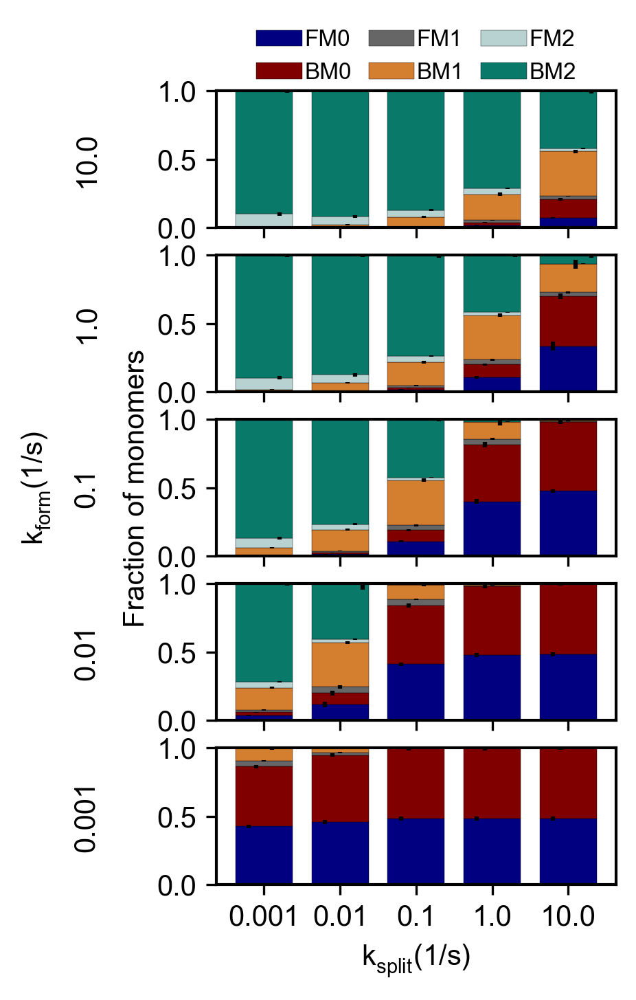

In [81]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
new_cmap = mpl.colors.LinearSegmentedColormap.from_list("", ['#010080', '#800000', '#666666', '#d47e30', '#B8D2D2', '#097969'])
labelvec = ['0.001', '0.01', '0.1', '1.0', '10.0']

# Get figure
nr = 5; nc = 1
fig, axvec = plt.subplots(nrows = nr, ncols = nc, figsize = (2.5, 5.0), 
                          dpi = 300, facecolor = 'w', edgecolor = 'k', sharex = False, sharey = False)

# Figure S6B
for plotcounter in range(0, nr):
    legcell = []
    df = pd.DataFrame()
    stddatavec = []
    Nstates = 6 
    for val in range(0, len(kformvec)):
        Rval = plotcounter*len(ksplitvec)+val
        stddatavec.append(np.array([val-0.2, cumarray[0][Rval], Std_bar_data_fm0[Rval]]))
        offset = -0.1
        for pos in range(0, Nstates):
            if pos == 0:
                stddatavec.append(np.array([val+offset, cumarray[pos+1][Rval], Std_bar_data_bm0[Rval]]))
            elif pos == 1:
                stddatavec.append(np.array([val+offset, cumarray[pos+1][Rval], Std_bar_data_fm1[Rval]]))
            elif pos == 2:
                stddatavec.append(np.array([val+offset, cumarray[pos+1][Rval], Std_bar_data_bm1[Rval]]))
            elif pos == 3:
                stddatavec.append(np.array([val+offset, cumarray[pos+1][Rval], Std_bar_data_fm2[Rval]]))
            elif pos == 4:
                stddatavec.append(np.array([val+offset, cumarray[pos+1][Rval], Std_bar_data_bm2[Rval]]))
            offset = offset + 0.1
    df = bardf[bardf["kform"] == kformvec[plotcounter]].drop(columns = "kform")
    stddatavec = pd.DataFrame(np.array(stddatavec), columns = ['x', 'mean', 'std'])
    
    # PLOT
    ax = axvec[nr-plotcounter-1]
    df.plot(ax = ax, x = 'ksplit', kind = 'bar', stacked = True, legend = False, 
            width = 0.75,
            cmap = new_cmap, edgecolor = "black", linewidth = 0.1)
    ax.errorbar(stddatavec['x'], stddatavec['mean'], yerr = stddatavec['std'], 
                fmt = 'o', markersize = 0, ecolor = 'black')
    
    # Beautify
    ax.set_xticklabels(labelvec, rotation = 0)
    ax.set_ylim([0, 1.0])
    ax.set_yticks([0, 0.5, 1.0])

    if plotcounter > 0:
            ax.set_xticklabels([])

axvec[0].legend(['FM0', 'BM0', 'FM1', 'BM1', 'FM2', 'BM2'],
                 ncol=3, fontsize=8, frameon=False, loc='upper center', bbox_to_anchor=(0.5, 1.6), 
                 labelspacing = 0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 2)

plt.figtext(-0.2, 0.5, 'Fraction of monomers', horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)
axvec[nr-1].set_xlabel(r"$k_{split} (1/s)$")
axvec[1].set_xlabel('')
axvec[0].set_xlabel('')
axvec[0].set_ylabel('10.0', labelpad=20) 
axvec[1].set_ylabel('1.0', labelpad=20) 
axvec[2].set_ylabel('0.1', labelpad=20) 
axvec[3].set_ylabel('0.01', labelpad=20) 
axvec[4].set_ylabel('0.001', labelpad=20) 
plt.text(-0.45, 0.5, r"$k_{form} (1/s)$", horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)

# SAVE FIGURE
plt.savefig('Figure_S6B.png', dpi = 300, bbox_inches = 'tight')
fig.savefig('Figure_S6B.pdf', bbox_inches = 'tight')

## Figure S6C Data

In [82]:
# Function to Process Data

def Multimer_Lengths(filename, Nreps, *args):
    if len(args):
        tv = (args[0])
        print(tv)
    length_df_list = []
    length_df_counts_list = []
    dirpath = 'Figure_S6'
    for repid in range(0, Nreps):
        print('R_'+str(Rval)+'_r_'+str(repid))
        print('---')
        fvar = dirpath+filename+str(repid)+'.csv'
        df = pd.read_csv(fvar, index_col = 0)

        length_monomers = df.mul(df.index, axis = 0)
            
        col_sums = length_monomers.sum(axis = 0)
        length_1_values = tv - col_sums
        length_monomers.loc[1] = length_1_values
        length_monomers = length_monomers.sort_index()

        length_df_counts_tmp = length_monomers.iloc[:, -30:]
        length_df_counts_list.append(length_df_counts_tmp)

        length_df_tmp = length_monomers.iloc[:, -30:]
        length_df_tmp = length_df_tmp/tv
        length_df_list.append(length_df_tmp)

    # Determine the union of all indices
    all_indices = sorted(set().union(*(df.index for df in length_df_list)))

    # Reindex all DataFrames using the union of indices
    df_list_reindexed = [df.reindex(all_indices, fill_value = 0) for df in length_df_list]

    length_df = pd.concat(df_list_reindexed, axis = 1)
    length_df.dropna(how = 'all', inplace = True)
    Mean_length_df = length_df.mean(axis = 1)
    Mean_length_data = Mean_length_df.values
    Std_length_df = length_df.std(axis = 1)
    Std_length_data = Std_length_df.values
    Lengthvec = length_df.index.to_list()

    all_indices_counts = sorted(set().union(*(df.index for df in length_df_counts_list)))
    df_list_counts_reindexed = [df.reindex(all_indices_counts, fill_value = 0) for df in length_df_counts_list]
    length_counts_df = pd.concat(df_list_counts_reindexed, axis = 1)
    length_counts_df.dropna(how = 'all', inplace = True)
    length_counts = length_counts_df.sum(axis = 1)

    return [Mean_length_data, Std_length_data, Lengthvec, length_counts]

############################################################################################

# Assemble data for figure

kformvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
ksplitvec = [1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
Nreps = 10

Mean_length_data = []
Std_length_data = []
Lengthvec_data = []
Lengthcounts_data = []

kformlist = []
ksplitlist = []
jobfoldername = 'inputfiles' 
for kformiter, kform in enumerate(kformvec):
    for ksplititer, ksplit in enumerate (ksplitvec):
        kformlist.append(kform)
        ksplitlist.append(ksplit)
        Rval = (kformiter)*len(ksplitvec)+(ksplititer)
        filename = '/outputfiles/'+'LengthFreqOutput/'+'Length_Freq_'+jobfoldername+'_R_'+str(Rval)+'_r_'
        outputlist = Multimer_Lengths(filename, Nreps, 2000)
        Mean_length_data.append(outputlist[0])
        Std_length_data.append(outputlist[1])
        Lengthvec_data.append(outputlist[2])
        Lengthcounts_data.append(outputlist[3])

2000
R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
2000
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
2000
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
2000
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
2000
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
2000
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
2000
R_6_r_0
---
R_6_r_1
---
R_6_r_2
---
R_6_r_3
---
R_6_r_4
---
R_6_r_5
---
R_6_r_6
---
R_6_r_7
---
R_6_r_8
---
R_6_r_9
---
2000
R_7_r_0
---
R_7_r_1
---
R_7_r_2
---
R_7_r_3
---
R_7_r_4
---
R_7_r_5
---
R_7_r_6
---
R_7_r_7
---
R_7_r_8
---
R_7_r_9
---


## Plot Figure S6C

/var/folders/gf/v4v81q2j7hldvhlfh55d_2mc0000gq/T/ipykernel_40172/3303608535.py:17: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  bplot = sns.violinplot(data = [bplot_data[0], bplot_data[1], bplot_data[2], bplot_data[3], bplot_data[4]],
/var/folders/gf/v4v81q2j7hldvhlfh55d_2mc0000gq/T/ipykernel_40172/3303608535.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['0.001', '0.01', '0.1', '1.0', '10.0'])
/var/folders/gf/v4v81q2j7hldvhlfh55d_2mc0000gq/T/ipykernel_40172/3303608535.py:17: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  bplot = sns.violinplot(data = [bplot_data[0], bplot_data[1], bplot_data[2], bplot_data[3], bplot_data[4]],
/var/folders/gf/v4v81q2j7hldvhlfh55d_2mc0000gq/T/ipykernel_40172/3303

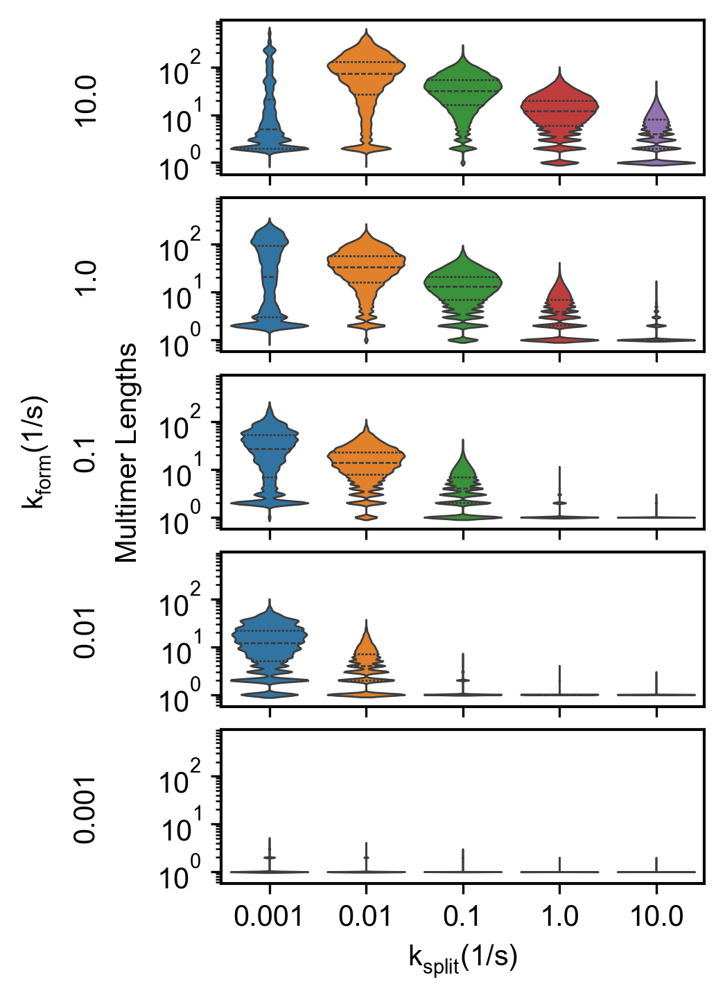

In [83]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})

# Get figure
nr = 5; nc = 1 
fig, axvec = plt.subplots(nrows = nr, ncols = nc, figsize = (2.5, 5.0), 
                          dpi = 300, facecolor = 'w', edgecolor = 'k', sharex = False, sharey = True)

for plotcounter in range(0, nr):
    legcell = []
    bplot_data = []
    for val in range(0, len(ksplitvec)):
        Rval = plotcounter*len(ksplitvec) + val
        length = Lengthcounts_data[Rval].index.to_list()
        freq = Lengthcounts_data[Rval].values
        bplot_data.append(np.repeat(length, freq))
    ax = axvec[nr-plotcounter-1]
    bplot = sns.violinplot(data = [bplot_data[0], bplot_data[1], bplot_data[2], bplot_data[3], bplot_data[4]], 
                           inner = 'quartile', ax = ax, log_scale = True, scale = 'width', linewidth=0.66)
    if plotcounter > 0:
        ax.set_xticklabels([])
    if plotcounter == 0:
        ax.set_xticklabels(['0.001', '0.01', '0.1', '1.0', '10.0'])

plt.text(-0.19, 0.5, 'Multimer Lengths', horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)
axvec[0].set_ylabel('10.0', labelpad=20) 
axvec[1].set_ylabel('1.0', labelpad=20) 
axvec[2].set_ylabel('0.1', labelpad=20) 
axvec[3].set_ylabel('0.01', labelpad=20) 
axvec[4].set_ylabel('0.001', labelpad=20) 
plt.text(-0.38, 0.5, r"$k_{form} (1/s)$", horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)
axvec[4].set_xlabel(r"$k_{split} (1/s)$") 

plt.subplots_adjust(left = 0.05,
                    right = 0.98,
                    bottom = 0.05, 
                    top = 0.88,
                    wspace = 0.2, 
                    hspace = 0.15)

# SAVE FIGURE
plt.savefig('Figure_S6C.png', dpi = 300, bbox_inches = 'tight')
fig.savefig('Figure_S6C.pdf', bbox_inches = 'tight')

## Figure S6D Data

In [84]:
# Load all replicates
# Take mean and std
# plot 5 rows 1 column plots
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

jobfoldername = 'inputfiles' 
kformvec =[1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
ksplitvec =[1e-3, 1e-2, 1e-1, 1e+0, 1e+1]
Nreps = 10
MeanlistAR = []
StdlistAR = []

dirpath = 'Figure_S6'
for kformiter, kform in enumerate(kformvec):
    for ksplititer, ksplit in enumerate (ksplitvec):
        AspectRatio = []
        Rval = kformiter*len(ksplitvec)+ksplititer
        for repid in range(0,Nreps):
            fvar = dirpath+'/outputfiles/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df = pd.read_csv(fvar,index_col=0)
            Timevec = df.iloc[0].to_numpy()
            a1 = df.iloc[1].to_numpy()
            a2 = df.iloc[2].to_numpy()
            a3 = df.iloc[3].to_numpy()
            AspectRatio_tmp = np.zeros(len(Timevec))
            for time in range(0,len(Timevec)):
                a = max(a1[time], a2[time], a3[time])
                c = min(a1[time], a2[time], a3[time])
                AspectRatio_tmp[time] = a/c
            AspectRatio.append(AspectRatio_tmp)
            print('R_'+str(Rval)+'_r_'+str(repid))
            if repid == 0:
                print('Aspect Ratio at t=600s for Gallery Snapshot: ',AspectRatio_tmp[600])
            else:
                print('Aspect Ratio at t=600s for Replicate ' + str(repid) + ' : ',AspectRatio_tmp[600])
            print('---')
        AspectRatio = np.array(AspectRatio)
        MeanlistAR.append(np.mean(AspectRatio,0))
        StdlistAR.append(np.std(AspectRatio,0))
        print('R_'+str(Rval)+' - Average Aspect Ratio at t=600s: ',np.mean(AspectRatio,0)[600])
        print('------------------')
Timevec = df.iloc[0].to_numpy()

R_0_r_0
Aspect Ratio at t=600s for Gallery Snapshot:  1.1753700832869192
---
R_0_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.1538739836624332
---
R_0_r_2
Aspect Ratio at t=600s for Replicate 2 :  1.1158983872964907
---
R_0_r_3
Aspect Ratio at t=600s for Replicate 3 :  1.2630865518620125
---
R_0_r_4
Aspect Ratio at t=600s for Replicate 4 :  1.1984648435997605
---
R_0_r_5
Aspect Ratio at t=600s for Replicate 5 :  1.2345503717177928
---
R_0_r_6
Aspect Ratio at t=600s for Replicate 6 :  1.2099498120128782
---
R_0_r_7
Aspect Ratio at t=600s for Replicate 7 :  1.1904147916871686
---
R_0_r_8
Aspect Ratio at t=600s for Replicate 8 :  1.257177405028109
---
R_0_r_9
Aspect Ratio at t=600s for Replicate 9 :  1.2330773710279899
---
R_0 - Average Aspect Ratio at t=600s:  1.2031863601181554
------------------
R_1_r_0
Aspect Ratio at t=600s for Gallery Snapshot:  1.2594989811818291
---
R_1_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.2827946012337799
---
R_1_r_2
Aspect Ratio at t=600s for Repli

## Plot Figure S6D

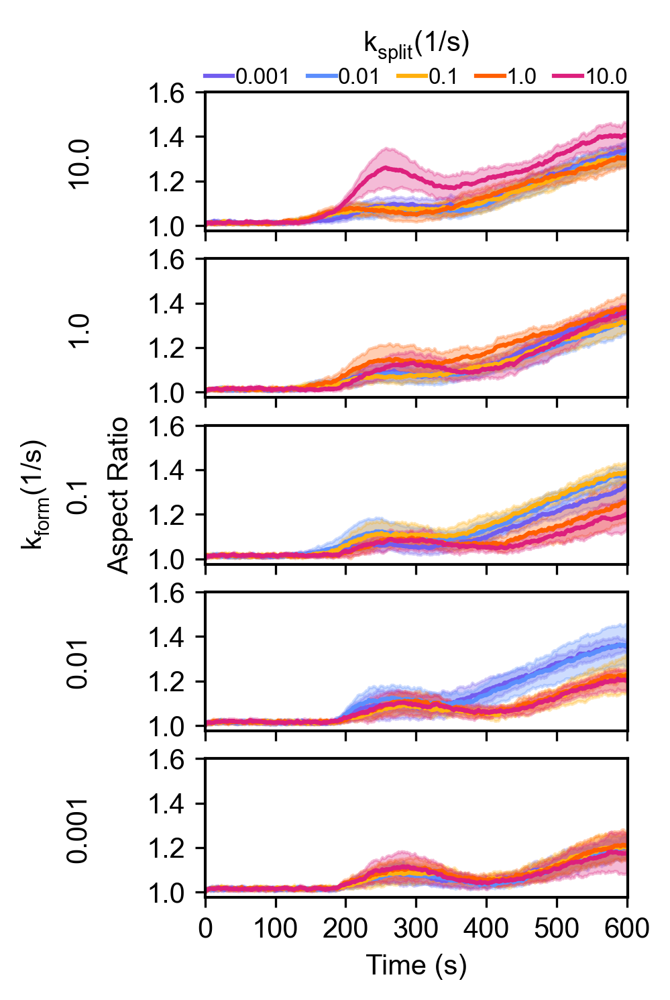

In [85]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']

# Aspect Ratio Figure
nr = 5; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(2.5,5), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
for plotcounter in range(0,nr):
    legcell = []
    for val in range(0,nr):
        Rval = plotcounter*len(ksplitvec) + val
        ax = axvec[nr-plotcounter-1]
        x = ax.plot(Timevec,MeanlistAR[Rval],color=colorlist[val])
        legcell.append(x[0]);
        ax.fill_between(Timevec,MeanlistAR[Rval]-StdlistAR[Rval],MeanlistAR[Rval]+StdlistAR[Rval],color=colorlist[val],alpha=0.3)
plt.text(-0.2, 0.5, 'Aspect Ratio', horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)
axvec[4].set_xlabel('Time (s)') 
axvec[4].set_xlim([0,601]) 
axvec[4].set_xticks([0,100,200,300,400,500,600]) 
axvec[4].set_yticks([1.0,1.2,1.4,1.6]) 
axvec[0].set_ylabel('10.0', labelpad=20) 
axvec[1].set_ylabel('1.0', labelpad=20) 
axvec[2].set_ylabel('0.1', labelpad=20) 
axvec[3].set_ylabel('0.01', labelpad=20) 
axvec[4].set_ylabel('0.001', labelpad=20) 
axvec[0].legend(legcell, ksplitvec,title=r"$k_{split} (1/s)$",
                 ncol=5,fontsize=8,frameon=False, loc='upper center', bbox_to_anchor=(0.5, 1.6), 
                 labelspacing = 0.1, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)
plt.text(-0.4, 0.5, r"$k_{form} (1/s)$", horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_S6D.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_S6D.pdf', dpi=300, bbox_inches='tight')

# Figure S7

## Figure S7A Data

In [86]:
# Assemble data for figure

# Load all replicates
# Take mean and std
# Row 0 - Time
# Row 1 - fraction of occupied triangles 
jobfoldername = 'inputfiles'
tensionvec = [4, 8, 12, 16, 20]
viscosityvec = [100, 150, 200, 300, 400]
Nreps = 10
Meanlist = []
Stdlist = []
dirpath = 'Figure_S7'
for tensiter in range(0, len(tensionvec)):
    for visciter in range(0, len(viscosityvec)):
        Row1 = []
        Rval = tensiter*len(viscosityvec)+visciter
        for repid in range(0, Nreps):
            fvar = dirpath+'/outputfiles/FO_Output'+'/FO_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df = pd.read_csv(fvar, index_col = 0)
            datavec = df.iloc[1].to_numpy()
            Row1.append(datavec)
            print('R_'+str(Rval)+'_r_'+str(repid))
            print('---')
        Row1 = np.array(Row1)
        Meanlist.append(np.mean(Row1, 0))
        Stdlist.append(np.std(Row1, 0))
Timevec = df.iloc[0].to_numpy()

R_0_r_0
---
R_0_r_1
---
R_0_r_2
---
R_0_r_3
---
R_0_r_4
---
R_0_r_5
---
R_0_r_6
---
R_0_r_7
---
R_0_r_8
---
R_0_r_9
---
R_1_r_0
---
R_1_r_1
---
R_1_r_2
---
R_1_r_3
---
R_1_r_4
---
R_1_r_5
---
R_1_r_6
---
R_1_r_7
---
R_1_r_8
---
R_1_r_9
---
R_2_r_0
---
R_2_r_1
---
R_2_r_2
---
R_2_r_3
---
R_2_r_4
---
R_2_r_5
---
R_2_r_6
---
R_2_r_7
---
R_2_r_8
---
R_2_r_9
---
R_3_r_0
---
R_3_r_1
---
R_3_r_2
---
R_3_r_3
---
R_3_r_4
---
R_3_r_5
---
R_3_r_6
---
R_3_r_7
---
R_3_r_8
---
R_3_r_9
---
R_4_r_0
---
R_4_r_1
---
R_4_r_2
---
R_4_r_3
---
R_4_r_4
---
R_4_r_5
---
R_4_r_6
---
R_4_r_7
---
R_4_r_8
---
R_4_r_9
---
R_5_r_0
---
R_5_r_1
---
R_5_r_2
---
R_5_r_3
---
R_5_r_4
---
R_5_r_5
---
R_5_r_6
---
R_5_r_7
---
R_5_r_8
---
R_5_r_9
---
R_6_r_0
---
R_6_r_1
---
R_6_r_2
---
R_6_r_3
---
R_6_r_4
---
R_6_r_5
---
R_6_r_6
---
R_6_r_7
---
R_6_r_8
---
R_6_r_9
---
R_7_r_0
---
R_7_r_1
---
R_7_r_2
---
R_7_r_3
---
R_7_r_4
---
R_7_r_5
---
R_7_r_6
---
R_7_r_7
---
R_7_r_8
---
R_7_r_9
---
R_8_r_0
---
R_8_r_1
---
R_8_r_2
---
R_8_

## Plot Figure S7A

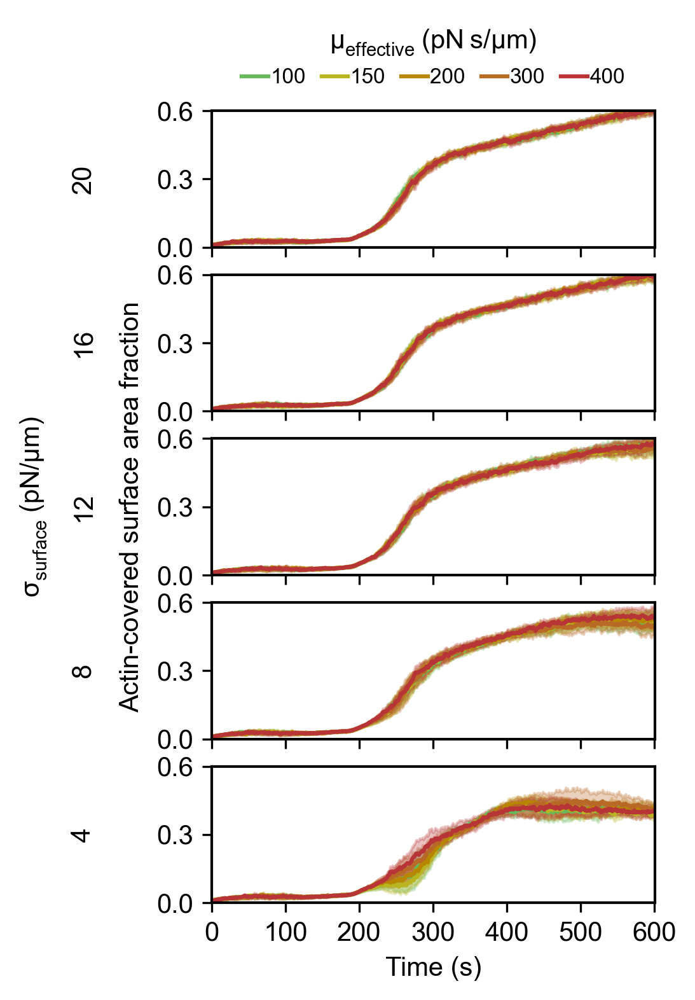

In [87]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#66B85A','#B8B521','#B88700','#B86925','#B83537']
labelvec = ['100', '150', '200', '300', '400'] 

nr = 5; nc = 1
fig, axvec = plt.subplots(nrows = nr, ncols = nc, figsize = (2.5, 5.0), 
                          dpi = 300, facecolor = 'w', edgecolor = 'k', sharex = False, sharey = False)

# Figure S7A
for plotcounter in range(0, nr):
    legcell = []
    for val in range(0, nr):
        Rval = plotcounter*len(kunbindvec) + val
        ax = axvec[nr-plotcounter-1]
        x = ax.plot(Timevec, Meanlist[Rval], color = colorlist[val])
        legcell.append(x[0]);
        ax.fill_between(Timevec, Meanlist[Rval]-Stdlist[Rval], Meanlist[Rval]+Stdlist[Rval], 
                        color = colorlist[val], alpha = 0.3)
        ax.set_xlim([0, 601])
        ax.set_ylim([0, 0.6])
        ax.set_xticks([0, 100, 200, 300, 400, 500, 600])
        ax.set_yticks([0, 0.3, 0.6])
        if plotcounter > 0:
            ax.set_xticklabels([])
plt.text(-0.18, 0.5, 'Actin-covered surface area fraction', horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)

axvec[0].legend(legcell, labelvec, title=r"$\mu_{effective} \: (pN \: s/µm)$",
                 ncol=5, fontsize=8, frameon=False, loc='upper center', bbox_to_anchor=(0.5, 1.75), 
                 labelspacing = 0.5, columnspacing = 0.75, handletextpad = 0.1, handlelength = 1.25)

axvec[4].set_xlabel('Time (s)') 
axvec[0].set_ylabel('20', labelpad=23) 
axvec[1].set_ylabel('16', labelpad=23) 
axvec[2].set_ylabel('12', labelpad=23) 
axvec[3].set_ylabel('8', labelpad=23) 
axvec[4].set_ylabel('4', labelpad=23) 
plt.text(-0.4, 0.5, r"$\sigma_{surface} \: (pN/µm)$", horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)

plt.subplots_adjust(left = 0.05,
                    right = 0.98,
                    bottom = 0.05, 
                    top = 0.88,
                    wspace = 0.25, 
                    hspace = 0.2)

# SAVE FIGURE
plt.savefig('Figure_S7A.png', dpi = 300, bbox_inches = 'tight')
fig.savefig('Figure_S7A.pdf', bbox_inches = 'tight')

## Figure S7B Data

In [88]:
# Load all replicates
# Take mean and std
# plot 5 rows 1 column plots
# Row 0 - Time
# Row 1 - a1
# Row 2 - a2
# Row 3 - a3 

jobfoldername = 'inputfiles' 
viscosityvec = [100, 150, 200, 300, 400]
tensionvec = [4, 8, 12, 16, 20]
Nreps = 10
MeanlistAR = []
StdlistAR = []

dirpath = 'Figure_S7'
for visciter in range(0, len(viscosityvec)):
    for tensiter in range(0, len(tensionvec)):
        AspectRatio = []
        Rval = tensiter*len(viscosityvec)+visciter
        for repid in range(0,Nreps):
            fvar = dirpath+'/outputfiles/'+'DynamicEllipseOutput'+'/Dynamic_Ellipse_'+jobfoldername+'_R_'+str(Rval)+'_r_'+str(repid)+'.csv'
            df = pd.read_csv(fvar,index_col=0)
            Timevec = df.iloc[0].to_numpy()
            a1 = df.iloc[1].to_numpy()
            a2 = df.iloc[2].to_numpy()
            a3 = df.iloc[3].to_numpy()
            AspectRatio_tmp = np.zeros(len(Timevec))
            for time in range(0,len(Timevec)):
                a = max(a1[time], a2[time], a3[time])
                c = min(a1[time], a2[time], a3[time])
                AspectRatio_tmp[time] = a/c
            AspectRatio.append(AspectRatio_tmp)
            print('R_'+str(Rval)+'_r_'+str(repid))
            if repid == 0:
                print('Aspect Ratio at t=600s for Gallery Snapshot: ',AspectRatio_tmp[600])
            else:
                print('Aspect Ratio at t=600s for Replicate ' + str(repid) + ' : ',AspectRatio_tmp[600])
            print('---')
        AspectRatio = np.array(AspectRatio)
        MeanlistAR.append(np.mean(AspectRatio,0))
        StdlistAR.append(np.std(AspectRatio,0))
        print('R_'+str(Rval)+' - Average Aspect Ratio at t=600s: ',np.mean(AspectRatio,0)[600])
        print('------------------')
Timevec = df.iloc[0].to_numpy()

R_0_r_0
Aspect Ratio at t=600s for Gallery Snapshot:  1.6021219805329494
---
R_0_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.6613884187985037
---
R_0_r_2
Aspect Ratio at t=600s for Replicate 2 :  1.6148375101474326
---
R_0_r_3
Aspect Ratio at t=600s for Replicate 3 :  1.6982845167625809
---
R_0_r_4
Aspect Ratio at t=600s for Replicate 4 :  1.645697027973212
---
R_0_r_5
Aspect Ratio at t=600s for Replicate 5 :  1.5682331107860303
---
R_0_r_6
Aspect Ratio at t=600s for Replicate 6 :  1.6855893029798728
---
R_0_r_7
Aspect Ratio at t=600s for Replicate 7 :  1.6436630497681326
---
R_0_r_8
Aspect Ratio at t=600s for Replicate 8 :  1.6019299162895064
---
R_0_r_9
Aspect Ratio at t=600s for Replicate 9 :  1.6573907510389672
---
R_0 - Average Aspect Ratio at t=600s:  1.6379135585077187
------------------
R_5_r_0
Aspect Ratio at t=600s for Gallery Snapshot:  1.3461964984724217
---
R_5_r_1
Aspect Ratio at t=600s for Replicate 1 :  1.3514541179161337
---
R_5_r_2
Aspect Ratio at t=600s for Repli

## Plot Figure S7B

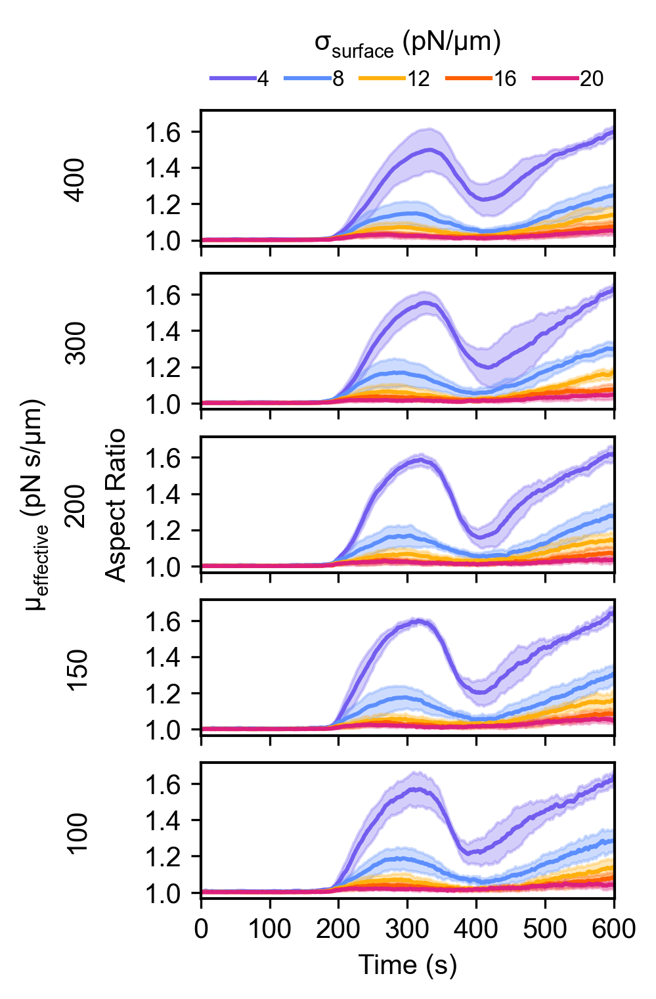

In [89]:
plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
colorlist = ['#725DEF', '#5C8EFD', '#FFB00D', '#FF5F01', '#DD207D']

# Aspect Ratio Figure
nr = 5; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(2.5,5), dpi=300, facecolor='w', edgecolor='k', sharex=True, sharey=True)
for plotcounter in range(0,nr):
    legcell = []
    for val in range(0,nr):
        Rval = plotcounter*len(viscosityvec) + val
        ax = axvec[nr-plotcounter-1]
        x = ax.plot(Timevec,MeanlistAR[Rval],color=colorlist[val])
        legcell.append(x[0]);
        ax.fill_between(Timevec,MeanlistAR[Rval]-StdlistAR[Rval],MeanlistAR[Rval]+StdlistAR[Rval],color=colorlist[val],alpha=0.3)
plt.text(-0.2, 0.5, 'Aspect Ratio', horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)
axvec[4].set_xlabel('Time (s)') 
axvec[4].set_xlim([0,601]) 
axvec[4].set_yticks([1.0,1.2,1.4,1.6]) 
axvec[4].set_xticks([0,100,200,300,400,500,600]) 
axvec[4].set_ylabel('100', labelpad=20) 
axvec[3].set_ylabel('150', labelpad=20)
axvec[2].set_ylabel('200', labelpad=20)
axvec[1].set_ylabel('300', labelpad=20)
axvec[0].set_ylabel('400', labelpad=20)
plt.text(-0.4, 0.5, r"$\mu_{effective} \: (pN \: s/µm)$", horizontalalignment='center', verticalalignment='center', transform=axvec[2].transAxes, rotation=90)
axvec[0].legend(legcell, tensionvec,title=r"$\sigma_{surface} \: (pN/µm)$",
                 ncol=5,fontsize=8,frameon=False, loc='upper center', bbox_to_anchor=(0.5, 1.75), 
                 labelspacing = 0.5, columnspacing = 0.75, handletextpad = 0.1)
plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.0, 
                    hspace=0.2)
plt.savefig('Figure_S7B.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_S7B.pdf', dpi=300, bbox_inches='tight')

## Figure S7C Data

In [90]:
def getARdata(sheetname, columnlist, condlist, Ntrials):
    # Path to Excel data
    datafile = 'Source_Data_Fig_7.xlsx'
    # Read Excel file with multiple sheets
    xlsx = pd.read_excel(datafile, sheet_name=['Fig 7D', 'Fig S7C'])
    dataframedict = {}
    Ncond = len(condlist)
    ARData = []
    ARFrac = np.zeros((Ntrials, Ncond))
    ARAvg = np.zeros((Ntrials, Ncond))
    for cond in range(0, Ncond):
        df = xlsx[sheetname]
        df.columns = df.iloc[1]
        df = df[2:]
        df = df.reset_index(drop=True)
        ARData_Reps = []
        colstart = columnlist[cond]
        for trial in range(0, Ntrials):
            col = colstart + trial
            RGGData = df.iloc[:, col]
            RGGData = pd.to_numeric(RGGData, errors='coerce')
            RGGData = RGGData.dropna()
            RGGData = RGGData.loc[RGGData >= 1]
            df_name = f'RGG_Actin_{condlist[cond]}_AR{trial+1}'
            dataframedict[df_name] = RGGData
            # Calculate fraction of condensates with AR > 1.2
            Count = sum(1 for AR in RGGData if AR > 1.2)
            ARFrac[trial, cond] = Count/len(RGGData)
            # Calculate average aspect ratio
            ARAvg[trial, cond] = np.mean(RGGData)
            ARData_Reps.extend(RGGData)
        ARData.append(ARData_Reps)
    return dataframedict, ARFrac, ARAvg, ARData

## Plot Figure S7C

  conc1 conc2  t_statistic   p_value
0   0.0   0.5    -4.721238  0.009163
1   0.0   1.5   -10.329385  0.000496
2   0.5   1.5    -7.079659  0.002101
2.6400000000000006 0.02
2.6400000000000006 0.02
2.6400000000000006 0.02


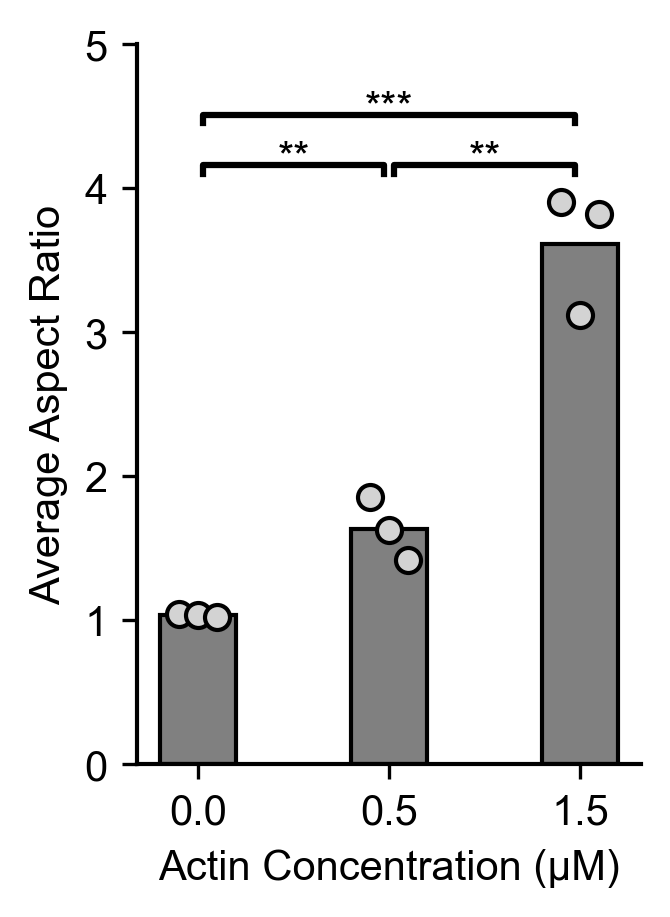

In [91]:
# Get Data
sheetname = 'Fig S7C'
columnlist = [0, 4, 8]
condlist = ['00', '05', '15']
Ntrials = 3
dataframedict, ARFrac, ARAvg, ARData = getARdata(sheetname, columnlist, condlist, Ntrials)

plt.rcParams.update({'font.size': 10, 'font.family':'arial', 'font.weight':'normal'})
conclist = ['0.0', '0.5', '1.5']
bar_width = 0.4

# Figure Full
nr = 1; nc = 1
fig, axvec = plt.subplots(nrows=nr, ncols=nc,figsize=(2,3), dpi=300, facecolor='w', edgecolor='k', sharex=False, sharey=False)
for plotcounter in range(0,nr):
    legcell = []
    concvec = []
    pointsvec = []
    meanvec = []
    stdvec = []
    t_test = []
    for cond in range(0, len(conclist)):
        concvec.append([conclist[cond], conclist[cond], conclist[cond]])
        pointsvec.append(ARAvg[:, cond])
        meanvec.append(np.mean(ARAvg[:, cond]))
        stdvec.append(np.std(ARAvg[:, cond]))
    axvec.bar(conclist, meanvec, width=bar_width, capsize=5, color='grey', edgecolor='black', linewidth=1)
    axvec.spines[['right', 'top']].set_visible(False)
    for cond in range(0, len(conclist)):
        x_jitter_means = [cond-0.1, cond, cond+0.1]
        axvec.plot(x_jitter_means, pointsvec[cond], marker='o', linewidth=0.0, color='lightgrey', alpha=1.0, markeredgecolor='black')
        for cond2 in range(0, len(conclist)):
            if cond < cond2:
                t_statistic, p_value = stats.ttest_ind(a=pointsvec[cond], b=pointsvec[cond2], equal_var=True)
                t_test_tmp = {'conc1': conclist[cond], 'conc2': conclist[cond2], 't_statistic': t_statistic, 'p_value': p_value}
                t_test.append(t_test_tmp)
            else:
                continue
    df = pd.DataFrame(t_test)
    print(df)
    df_annotations = df.drop(columns=['t_statistic'])
    annotations = list(df_annotations.itertuples(index=False, name=None))
    starbars.draw_annotation(annotations, ns_show=False, bar_gap=0.0, text_distance=0.01, h_gap=0.02, top_margin=0.03, tip_length=0.015)
    axvec.set_ylabel('Average Aspect Ratio')
    axvec.set_xlabel('Actin Concentration (µM)')
    axvec.set_ylim(0.0, 5.0)

plt.subplots_adjust(left=0.15,
                    right=0.99,
                    bottom=0.1, 
                    top=0.9,
                    wspace=0.6, 
                    hspace=0.4)
plt.savefig('Figure_S7C.png', dpi=300, bbox_inches='tight')
plt.savefig('Figure_S7C.pdf', dpi=300, bbox_inches='tight')